In [1]:
!pip install nltk matplotlib wordcloud scikit-learn


In [2]:
import nltk
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from collections import Counter
nltk.download('punkt')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [3]:
from wordcloud import WordCloud, STOPWORDS
import plotly.express as px
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Downloads
nltk.download('wordnet')
nltk.download('stopwords')

# Initialize your stopwords set with wordcloud's stopwords
s = set(STOPWORDS)

# Get stopwords for all languages in NLTK
languages = stopwords.fileids()
for language in languages:
    s.update(stopwords.words(language))

# Add any additional stopwords if needed
s.add('amp')

# If you really need the resulting stopwords as a list:
stopwords_list = list(s)


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [4]:
# Load your dataset (Assuming it's a CSV with a column 'abstract' for patent abstracts)

# import data


In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
data_all = pd.read_csv ('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/patent-phage-therapy-lens-23102023-tiab.csv')
#data = pd.read_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/topic_probability_patent_therapy_23102023_10.pkl').reset_index()
pd.set_option('display.max_columns', None)
print(len(data_all))
data_all.head()

2365


,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status
0,1,RU,C2,RU 2214829 C2,069-390-611-717-343,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,4,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED
1,2,JP,A,JP 2016104011 A,114-759-028-882-736,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE
2,3,AU,A1,AU 2015/255318 A1,094-982-928-461-863,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE
3,4,US,A1,US 2016/0022747 A1,167-908-891-122-112,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,https://lens.org/167-908-891-122-112,Patent Application,yes,0,1,42,45,816,A61K38/00;;A61K45/06;;C07K14/005;;C12N7/00;;C1...,A61K35/76;;A61K9/00;;C12N7/00,NaN,0,0,NaN,NaN,NaN,ACTIVE
4,5,AU,A1,AU 2017/204331 A1,112-018-476-081-94X,2017-07-13,2017,AU 2017/204331 A,2017-06-26,AU 2017/204331 A;;AU 2015/255313 A;;AU 2011/30...,2011-09-19,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,NaN,https://lens.org/112-018-476-081-94X,Patent Application,no,0,3,1,1,0,Y02A50/30,A61K35/76;;C12N7/00,NaN,0,0,NaN,NaN,NaN,DISCONTINUED


In [7]:
#data_topic = pd.read_csv ('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/patent-phage-therapy-lens-23102023-tiab.csv')
data_topic = pd.read_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/topic_probability_patent_therapy_23102023_10.pkl').reset_index()[[
    'Lens ID','Topic N°'
]]
pd.set_option('display.max_columns', None)
print(len(data_topic))
data_topic.head()

2309


,Lens ID,Topic N°
0,069-390-611-717-343,2
1,114-759-028-882-736,3
2,094-982-928-461-863,3
3,112-018-476-081-94X,3
4,091-234-230-295-135,3


In [8]:
import pandas as pd

# Assuming `data` is your DataFrame and has a column named 'Jurisdiction'

topics_rename = {
    0: 'Topic 0',
    1: 'Topic 1',
    2: 'Topic 2',
    3: 'Topic 3',
    4: 'Topic 4',
    5: 'Topic 5',
    6: 'Topic 6',
    7: 'Topic 7',
    8: 'Topic 8',
    9: 'Topic 9',
    10: 'Topic 10',
}

# Replace the codes with names in the 'Jurisdiction' column
data_topic['Topic N°'] = data_topic['Topic N°'].map(topics_rename)#.fillna(data_topic['Topic N°'])
data_topic.head()

,Lens ID,Topic N°
0,069-390-611-717-343,Topic 2
1,114-759-028-882-736,Topic 3
2,094-982-928-461-863,Topic 3
3,112-018-476-081-94X,Topic 3
4,091-234-230-295-135,Topic 3


In [9]:
# Merge the DataFrames on 'common_column'
data = data_all.merge(data_topic, on='Lens ID', how='outer')
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Topic N°
0,1,RU,C2,RU 2214829 C2,069-390-611-717-343,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,4,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED,Topic 2
1,2,JP,A,JP 2016104011 A,114-759-028-882-736,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3
2,3,AU,A1,AU 2015/255318 A1,094-982-928-461-863,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3
3,4,US,A1,US 2016/0022747 A1,167-908-891-122-112,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,https://lens.org/167-908-891-122-112,Patent Application,yes,0,1,42,45,816,A61K38/00;;A61K45/06;;C07K14/005;;C12N7/00;;C1...,A61K35/76;;A61K9/00;;C12N7/00,NaN,0,0,NaN,NaN,NaN,ACTIVE,NaN
4,5,AU,A1,AU 2017/204331 A1,112-018-476-081-94X,2017-07-13,2017,AU 2017/204331 A,2017-06-26,AU 2017/204331 A;;AU 2015/255313 A;;AU 2011/30...,2011-09-19,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,NaN,https://lens.org/112-018-476-081-94X,Patent Application,no,0,3,1,1,0,Y02A50/30,A61K35/76;;C12N7/00,NaN,0,0,NaN,NaN,NaN,DISCONTINUED,Topic 3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2360,2361,GB,A,GB 1165745 A,150-422-589-010-681,1969-10-01,1969,GB 3886866 A,1966-08-31,US 48872465 A,1965-09-20,Novel Dinucleoside Phosphates,"1,165,745. Dinucleoside phosphates. UPJOHN CO....",UPJOHN CO,NaN,NaN,https://lens.org/150-422-589-010-681,Granted Patent,no,0,0,7,7,0,C07H19/14;;C07H19/14;;Y02P20/55;;Y02P20/55;;Y1...,C07H19/14,C2A A1B -;;C2A A1C2C -;;C2A ...,0,0,NaN,NaN,NaN,EXPIRED,Topic 0
2361,2362,GB,A,GB 1165354 A,058-819-734-343-222,1969-09-24,1969,GB 3887066 A,1966-08-31,US 48879965 A,1965-09-20,Novel Dinucleoside Phosphates,"1,165,354. Dinucleoside phosphates. UPJOHN CO....",UPJOHN CO,NaN,NaN,https://lens.org/058-819-734-343-222,Granted Patent,no,0,0,7,7,0,C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...,C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...,C2A

# data preprocessing

## clean year and group year in ranges periods

In [10]:
data['Application Date'] = pd.to_datetime(data['Application Date'])
data['Earliest Priority Date'] = pd.to_datetime(data['Earliest Priority Date'])

In [11]:
data['Application Year'] = data['Application Date'].dt.year
data['Earliest Priority Year'] = data['Earliest Priority Date'].dt.year

In [12]:
# Convert 'Publication Year' to integers
data['Publication Year'] = data['Publication Year'].astype('Int64')
data['Application Year'] = data['Application Year'].astype('Int64')
data['Earliest Priority Year'] = data['Earliest Priority Year'].astype('Int64')

In [13]:
def group_years_in_ranges(df, col_name):
    bins = list(range(1950, 2026, 5))
    labels = [f"{i}-{i+4}" for i in bins[:-1]]
    return pd.cut(data['Application Year'], bins=bins, labels=labels, right=False)


In [14]:
data['Application_Year_Range'] = group_years_in_ranges(data, 'Application Year')


## clean IPCR Classifications

In [15]:
data['IPCR Classifications']

0                                    A61K35/76;;A61P31/06
1               C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09
2                         A61K35/76;;C12N9/14;;G01N33/569
3                           A61K35/76;;A61K9/00;;C12N7/00
4                                     A61K35/76;;C12N7/00
                              ...                        
2360                                            C07H19/14
2361    C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...
2362                                             C12Q1/68
2363     A21D2/00;;A23C9/12;;C12N1/00;;C12N1/12;;C12P1/00
2364    A61K39/00;;A61K39/29;;A61K39/295;;A61K39/385;;...
Name: IPCR Classifications, Length: 2365, dtype: object

In [16]:
import pandas as pd

# Define the function to process IPCR codes
def process_ipcr_sections(ipcr_codes):
    # Check if ipcr_codes is a string (which means it's not NaN or None)
    if isinstance(ipcr_codes, str):
        # Extract the first letter of each code, remove duplicates by converting to a set
        unique_initials = sorted(set(code[0] for code in ipcr_codes.split(';;') if code))
        # Join the unique initials back together
        return ';;'.join(unique_initials)
    else:
        # If it's not a string, just return an empty string or NaN
        return ''

# Assuming 'data' is your DataFrame
# Apply the function to the 'IPCR Classifications' column
data['IPCR Sections'] = data['IPCR Classifications'].apply(process_ipcr_sections)

# Print the DataFrame to verify the results
data[['IPCR Classifications', 'IPCR Sections']]


,IPCR Classifications,IPCR Sections
0,A61K35/76;;A61P31/06,A
1,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,A;;C
2,A61K35/76;;C12N9/14;;G01N33/569,A;;C;;G
3,A61K35/76;;A61K9/00;;C12N7/00,A;;C
4,A61K35/76;;C12N7/00,A;;C
...,...,...
2360,C07H19/14,C
2361,C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...,C
2362,C12Q1/68,C
2363,A21D2/00;;A23C9/12;;C12N1/00;;C12N1/12;;C12P1/00,A;;C


In [17]:
import pandas as pd

# Define the function to process IPCR codes
def process_ipcr_class(ipcr_codes):
    # Check if ipcr_codes is a string (which means it's not NaN or None)
    if isinstance(ipcr_codes, str):
        # Extract the first letter of each code, remove duplicates by converting to a set
        unique_initials = sorted(set(code[:3] for code in ipcr_codes.split(';;') if code))
        # Join the unique initials back together
        return ';;'.join(unique_initials)
    else:
        # If it's not a string, just return an empty string or NaN
        return ''

# Assuming 'data' is your DataFrame
# Apply the function to the 'IPCR Classifications' column
data['IPCR Class'] = data['IPCR Classifications'].apply(process_ipcr_class)

# Print the DataFrame to verify the results
data[['IPCR Classifications', 'IPCR Class']]


,IPCR Classifications,IPCR Class
0,A61K35/76;;A61P31/06,A61
1,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,A61;;C12
2,A61K35/76;;C12N9/14;;G01N33/569,A61;;C12;;G01
3,A61K35/76;;A61K9/00;;C12N7/00,A61;;C12
4,A61K35/76;;C12N7/00,A61;;C12
...,...,...
2360,C07H19/14,C07
2361,C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...,C07;;C08;;C12
2362,C12Q1/68,C12
2363,A21D2/00;;A23C9/12;;C12N1/00;;C12N1/12;;C12P1/00,A21;;A23;;C12


In [18]:
import pandas as pd

# Define the function to process IPCR codes
def process_ipcr_subclass(ipcr_codes):
    # Check if ipcr_codes is a string (which means it's not NaN or None)
    if isinstance(ipcr_codes, str):
        # Extract the first letter of each code, remove duplicates by converting to a set
        unique_initials = sorted(set(code[:4] for code in ipcr_codes.split(';;') if code))
        # Join the unique initials back together
        return ';;'.join(unique_initials)
    else:
        # If it's not a string, just return an empty string or NaN
        return ''

# Assuming 'data' is your DataFrame
# Apply the function to the 'IPCR Classifications' column
data['IPCR Subclass'] = data['IPCR Classifications'].apply(process_ipcr_subclass)

# Print the DataFrame to verify the results
data[['IPCR Classifications', 'IPCR Subclass']]


,IPCR Classifications,IPCR Subclass
0,A61K35/76;;A61P31/06,A61K;;A61P
1,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,A61K;;A61P;;C12N
2,A61K35/76;;C12N9/14;;G01N33/569,A61K;;C12N;;G01N
3,A61K35/76;;A61K9/00;;C12N7/00,A61K;;C12N
4,A61K35/76;;C12N7/00,A61K;;C12N
...,...,...
2360,C07H19/14,C07H
2361,C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...,C07H;;C08F;;C12P
2362,C12Q1/68,C12Q
2363,A21D2/00;;A23C9/12;;C12N1/00;;C12N1/12;;C12P1/00,A21D;;A23C;;C12N;;C12P


## preprocesse jurisdiction: add the full name and add a columns for region

In [19]:
data['Jurisdiction'].unique()

array(['RU', 'JP', 'AU', 'US', 'CN', 'CA', 'WO', 'EP', 'SG', 'KR', 'NZ',
       'GB', 'GE', 'DE', 'CZ', 'MX', 'TN', 'ES', 'IN', 'EA', 'TW', 'UA',
       'MY', 'SU', 'FR', 'CH', 'PH', 'SK', 'NL', 'LV', 'ZA', 'PL', 'BG'],
      dtype=object)

In [20]:
import pandas as pd

# Assuming `data` is your DataFrame and has a column named 'Jurisdiction'

jurisdiction_codes = {
    'RU': 'Russia',
    'JP': 'Japan',
    'AU': 'Australia',
    'US': 'United States',
    'CN': 'China',
    'CA': 'Canada',
    'WO': 'World Intellectual Property Org.',
    'EP': 'European Patent Office',
    'SG': 'Singapore',
    'KR': 'South Korea',
    'NZ': 'New Zealand',
    'GB': 'United Kingdom',
    'GE': 'Georgia',  # or 'Germany' for historical East Germany
    'DE': 'Germany',
    'CZ': 'Czech Republic',
    'MX': 'Mexico',
    'TN': 'Tunisia',
    'ES': 'Spain',
    'IN': 'India',
    'EA': 'Eurasian Patent Org.',
    'TW': 'Taiwan',
    'UA': 'Ukraine',
    'MY': 'Malaysia',
    'SU': 'Russia',
    'FR': 'France',
    'CH': 'Switzerland',
    'PH': 'Philippines',
    'SK': 'Slovakia',
    'NL': 'Netherlands',
    'LV': 'Latvia',
    'ZA': 'South Africa',
    'PL': 'Poland',
    'BG': 'Bulgaria',
}

# Replace the codes with names in the 'Jurisdiction' column
data['Jurisdiction_name'] = data['Jurisdiction'].map(jurisdiction_codes).fillna(data['Jurisdiction'])

#data[['Jurisdiction', 'Jurisdiction_name']]

In [21]:
import pandas as pd

# Your existing DataFrame is 'data', and it contains a column 'Jurisdiction'

# Map of jurisdiction codes to their respective continent or region names
jurisdiction_to_region = {
    # Western Europe
    'GB': 'Europe', 'DE': 'Europe', 'FR': 'Europe',
    'CH': 'Europe', 'NL': 'Europe', 'ES': 'Europe',

    # Eastern Europe
    'RU': 'Europe', 'CZ': 'Europe', 'UA': 'Europe',
    'SK': 'Europe', 'LV': 'Europe', 'PL': 'Europe',
    'GE': 'Europe', 'BG': 'Europe',

    # Rest of the regions
    'JP': 'Asia', 'AU': 'Oceania', 'US': 'North America', 'CN': 'Asia',
    'CA': 'North America', 'WO': 'International', 'EP': 'Europe', 'SG': 'Asia',
    'KR': 'Asia', 'NZ': 'Oceania', 'MX': 'North America', 'TN': 'Africa',
    'IN': 'Asia', 'EA': 'Eurasia', 'TW': 'Asia', 'MY': 'Asia',
    'SU': 'Eurasia', 'PH': 'Asia', 'ZA': 'Africa'
}

# Create a new column 'Region' by mapping the 'Jurisdiction' column using the dictionary
data['Jurisdiction_Region'] = data['Jurisdiction'].map(jurisdiction_to_region).fillna(data['Jurisdiction'])

data[['Jurisdiction', 'Jurisdiction_name', 'Jurisdiction_Region']]


,Jurisdiction,Jurisdiction_name,Jurisdiction_Region
0,RU,Russia,Europe
1,JP,Japan,Asia
2,AU,Australia,Oceania
3,US,United States,North America
4,AU,Australia,Oceania
...,...,...,...
2360,GB,United Kingdom,Europe
2361,GB,United Kingdom,Europe
2362,SG,Singapore,Asia
2363,SG,Singapore,Asia


In [22]:
data['Jurisdiction_name'].unique()

array(['Russia', 'Japan', 'Australia', 'United States', 'China', 'Canada',
       'World Intellectual Property Org.', 'European Patent Office',
       'Singapore', 'South Korea', 'New Zealand', 'United Kingdom',
       'Georgia', 'Germany', 'Czech Republic', 'Mexico', 'Tunisia',
       'Spain', 'India', 'Eurasian Patent Org.', 'Taiwan', 'Ukraine',
       'Malaysia', 'France', 'Switzerland', 'Philippines', 'Slovakia',
       'Netherlands', 'Latvia', 'South Africa', 'Poland', 'Bulgaria'],
      dtype=object)

In [23]:
data['Jurisdiction_Region'].unique()

array(['Europe', 'Asia', 'Oceania', 'North America', 'International',
       'Africa', 'Eurasia'], dtype=object)

In [24]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2365 entries, 0 to 2364
Data columns (total 42 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   #                            2365 non-null   int64         
 1   Jurisdiction                 2365 non-null   object        
 2   Kind                         2365 non-null   object        
 3   Display Key                  2365 non-null   object        
 4   Lens ID                      2365 non-null   object        
 5   Publication Date             2365 non-null   object        
 6   Publication Year             2365 non-null   Int64         
 7   Application Number           2365 non-null   object        
 8   Application Date             2365 non-null   datetime64[ns]
 9   Priority Numbers             2363 non-null   object        
 10  Earliest Priority Date       2363 non-null   datetime64[ns]
 11  Title                        2365 non-null 

In [25]:
#

## add_metrics_to_dataframe: number of Applicants, Inventors and IPCR



```
In this function, add_metrics_to_dataframe:

    It takes your DataFrame and the name of the column containing the entity data (entity_column).
    A nested function, count_unique_entities, splits the entities in each row, counts the unique entities, and returns this count.
    This nested function is then applied to each row in the entity_column, creating a new column in the DataFrame named 'Number of Unique Entities'.
    You can extend this function to calculate more metrics in a similar manner and add them as new columns.
```



In [26]:
import pandas as pd
import numpy as np

def add_metrics_to_dataframe(dataframe, entity_column):
    # Function to calculate the number of unique entities in a given row
    def count_unique_entities(entities_string):
        if isinstance(entities_string, str):
            entities = entities_string.split(';;')
            unique_entities = set(entities)
            return len(unique_entities)
        else:
            # Return NaN for non-string data (like NaN or float)
            return np.nan

    # Apply the function to each row in the entity_column
    dataframe[f'Number of Unique {entity_column}'] = dataframe[entity_column].apply(count_unique_entities)

    # Additional metrics can be calculated and added in a similar manner
    # For example, you can add more functions here to calculate other metrics

    return dataframe



In [27]:
# Call the function to add metrics to the DataFrame
updated_dataframe = add_metrics_to_dataframe(data, 'Applicants')
updated_dataframe = add_metrics_to_dataframe(data, 'Inventors')
updated_dataframe = add_metrics_to_dataframe(data, 'IPCR Sections')
updated_dataframe = add_metrics_to_dataframe(data, 'IPCR Class')
updated_dataframe = add_metrics_to_dataframe(data, 'IPCR Subclass')
updated_dataframe = add_metrics_to_dataframe(data, 'IPCR Classifications')
updated_dataframe


,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Topic N°,Application Year,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Number of Unique Applicants,Number of Unique Inventors,Number of Unique IPCR Sections,Number of Unique IPCR Class,Number of Unique IPCR Subclass,Number of Unique IPCR Classifications
0,1,RU,C2,RU 2214829 C2,069-390-611-717-343,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,4,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED,Topic 2,2001,2001,2000-2004,A,A61,A61K;;A61P,Russia,Europe,2.0,3.0,1,1,2,2.0
1,2,JP,A,JP 2016104011 A,114-759-028-882-736,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3,2015,2010,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,Japan,Asia,2.0,5.0,2,2,3,4.0
2,3,AU,A1,AU 2015/255318 A1,094-982-928-461-863,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3,2015,2009,2015-2019,A;;C;;G,A61;;C12;;G01,A61K;;C12N;;G01N,Australia,Oceania,2.0,5.0,3,3,3,3.0
3,4,US,A1,US 2016/0022747 A1,167-908-891-122-112,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,https://lens.org/167-908-891-122-112,Patent Application,yes,0,1,42,45,816,A61K38/00;;A61K45/06;;C07K14/005;;C12N7/00;;C1...,A61K35/76;;A61K9/00;;C12N7/00,NaN,0,0,NaN,NaN,NaN,ACTIVE,NaN,2015,2009,2015-2019,A;;C,A61;;C12,A61K;;C12N,United States,North America,2.0,5.0,2,2,2,3.0
4,5,AU,A1,AU 2017/204331 A1,112-018-476-081-94X,2017-07-13,2017,AU 2017/204331 A,2017-06-26,AU 2017/204331 A;;AU 2015/255313 A;;AU 2011/30...,2011-09-19,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,NaN,https://lens.org/112-018-476-081-94X,Patent Application,no,0,3,1,1,0,Y02A50/30,A61K35/76;;C12N7/00,NaN,0,0,NaN,NaN,NaN,DISCONTINUED,Topic 3,2017,2011,2015-2019,A;;C,A61;;C12,A61K;;C12N,Australia,Oceania,2.0,5.0,2,2,2,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [28]:
data['Application_Year_Range'].unique().to_list()

['2000-2004',
 '2015-2019',
 '2020-2024',
 '1995-1999',
 '2010-2014',
 '2005-2009',
 '1990-1994',
 '1955-1959',
 '1980-1984',
 '1970-1974',
 '1985-1989',
 '1975-1979',
 '1965-1969',
 '1960-1964']

## clean applicants and inventors

In [29]:
data[['Applicants','Inventors']]

,Applicants,Inventors
0,NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D
1,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...
2,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...
3,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...
4,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...
...,...,...
2360,UPJOHN CO,NaN
2361,UPJOHN CO,NaN
2362,TCM BIOTECH INT CORP,LIN YOU-YU;;WANG YA-CHUN;;TZENG SHENG-TAI
2363,FLAGSHIP PIONEERING INNOVATIONS V INC,MARTINEZ IGNACIO;;ARMEN ZACHARY;;CEZAR CHRISTI...


In [30]:
#data_topic = pd.read_csv ('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/patent-phage-therapy-lens-23102023-tiab.csv')
applicant_clean = pd.read_excel(f'/content/drive/Othercomputers/My laptop/D:/PROJECT/YORK UNIVERSITY/BACTERIOPHAGES/MANUSCRIPT/applicant-classification_clean.xlsx')
pd.set_option('display.max_columns', None)
print(len(applicant_clean))
applicant_clean.head()

1973


,Applicants,applicants_clean,applicants_clean_not_individual,Last Classification,Column,applicant_category,Column2,Year of Creation,CITY,COUNTRY,country_clean,region_clean,global_north_sud,country_clean2,capital,latitude,longitude
0,BIOCONTROL LTD,BIOCONTROL LTD,BIOCONTROL LTD,Terminator,ltd,Commercial,BIOCONTROL LTD,Not found,Australia,NaN,Australia,Oceania,NaN,NaN,NaN,-35.293056,149.126944
1,NEW HOPE 6 AND STOCK LTD COMPANY,NEW HOPE 6 AND STOCK LTD COMPANY,NEW HOPE 6 AND STOCK LTD COMPANY,Transient,ltd,Commercial,NEW HOPE 6 AND STOCK LTD COMPANY,NaN,NaN,NaN,Australia,Oceania,NaN,NaN,NaN,-35.293056,149.126944
2,PHAGE CONSULTING PTY LTD,PHAGE CONSULTING PTY LTD,PHAGE CONSULTING PTY LTD,Transient,ltd,Commercial,PHAGE CONSULTING PTY LTD,20211,New South Wales,NaN,Australia,Oceania,NaN,NaN,NaN,-35.293056,149.126944
3,INST MOLEKULARE BIOTECHNOLOGIE,INST MOLEKULARE BIOTECHNOLOGIE,INST MOLEKULARE BIOTECHNOLOGIE,Transient,Institut,Academic,INST MOLEKULARE BIOTECHNOLOGIE,19995,Vienna,NaN,Austria,Europe,NaN,NaN,NaN,NaN,NaN
4,BIO LIFE SCIENCE FORSCHUNGS & ENTWICKLUNGSGESE...,BIO LIFE SCIENCE FORSCHUNGS & ENTWICKLUNGSGESE...,BIO LIFE SCIENCE FORSCHUNGS & ENTWICKLUNGSGESE...,Transient,NaN,Commercial,NaN,2000,Wien,NaN,Austria,Europe,NaN,NaN,NaN,NaN,NaN


In [31]:
#data_topic = pd.read_csv ('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/patent-phage-therapy-lens-23102023-tiab.csv')
inventor_clean = pd.read_excel('/content/drive/Othercomputers/My laptop/D:/PROJECT/YORK UNIVERSITY/BACTERIOPHAGES/MANUSCRIPT/inventor_list_clean2.xlsx')
pd.set_option('display.max_columns', None)
print(len(inventor_clean))
inventor_clean.head()

5824


,index,Inventors,Patent Count,Total Citations,Percentage of Total Patents,Average Citation Count,inventors_clean
0,0,A MINA,1,4,0.042918,4.000000,A MINA
1,1,A P NETHRAVATHI,1,0,0.042918,0.000000,A P NETHRAVATHI
2,2,ABAEV IGOR V,3,1,0.128755,0.333333,ABAEV IGOR V
3,3,ABDULAMIR AHMED SAHIB,1,0,0.042918,0.000000,ABDULAMIR AHMED SAHIB
4,4,ABE TAKAYOSHI,1,1,0.042918,1.000000,OKABE TAKAYOSHI


In [32]:
def clean_entities(df1, df2, col_old, col_clean, col_name):
    # Create a dictionary from df2 for mapping
    disease_dict = df2.set_index(col_old)[col_clean].to_dict()

    # Function to clean a single cell
    #def clean_cell(cell):
    def clean_cell(cell):
        if isinstance(cell, str):
            diseases = cell.split(';;')
            cleaned = list(set([disease_dict.get(disease, disease) for disease in diseases if isinstance(disease_dict.get(disease, disease), str)]))
            return ';;'.join(cleaned)
        else:
            return cell


    # Apply the function to each cell in the 'Diseases_lemat_stop2' column
    df1[col_name] = df1[col_old].apply(clean_cell)

    return df1

# Use the function
#df1_clean = clean_diseases(df1, df2)


#### clean inventors

In [33]:
df1 = data
df2 =  inventor_clean
col_old =  'Inventors'
col_clean =  'inventors_clean'
col_name = 'Inventors_clean'


data = clean_entities(df1, df2, col_old, col_clean, col_name)#.reset_index()
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Topic N°,Application Year,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Number of Unique Applicants,Number of Unique Inventors,Number of Unique IPCR Sections,Number of Unique IPCR Class,Number of Unique IPCR Subclass,Number of Unique IPCR Classifications,Inventors_clean
0,1,RU,C2,RU 2214829 C2,069-390-611-717-343,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,4,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED,Topic 2,2001,2001,2000-2004,A,A61,A61K;;A61P,Russia,Europe,2.0,3.0,1,1,2,2.0,SHATALOVA N D;;KURUNOVA N N;;KURUNOV JU N
1,2,JP,A,JP 2016104011 A,114-759-028-882-736,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3,2015,2010,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,Japan,Asia,2.0,5.0,2,2,3,4.0,CLARA ISABEL RODRIGUES LEANDRO;;DA COSTA GARCI...
2,3,AU,A1,AU 2015/255318 A1,094-982-928-461-863,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3,2015,2009,2015-2019,A;;C;;G,A61;;C12;;G01,A61K;;C12N;;G01N,Australia,Oceania,2.0,5.0,3,3,3,3.0,FERREIRA LLORENTE GRANCHO LOURENCO SARA;;RODRI...
3,4,US,A1,US 2016/0022747 A1,167-908-891-122-112,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,https://lens.org/167-908-891-122-112,Patent Application,yes,0,1,42,45,816,A61K38/00;;A61K45/06;;C07K14/005;;C12N7/00;;C1...,A61K35/76;;A61K9/00;;C12N7/00,NaN,0,0,NaN,NaN,NaN,ACTIVE,NaN,2015,2009,2015-2019,A;;C,A61;;C12,A61K;;C12N,United States,North America,2.0,5.0,2,2,2,3.0,FERREIRA LLORENTE GRANCHO LOURENCO SARA;;CLARA...
4,5,AU,A1,AU 2017/204331 A1,112-018-476-081-94X,2017-07-13,2017,AU 2017/204331 A,2017-06-26,AU 2017/204331 A;;AU 2015/255313 A;;AU 2011/30...,2011-09-19,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,NaN,https://lens.org/112-018-476-081-94X,Patent Application,no,0,3,1,1,0,Y02A50/30,A61K35/76;;C12N7/00,NaN,0,0,NaN,NaN,NaN,DISCONTINUED,Topic 3,2017,2011,2015-2019,A;;C,A61;;C12,A61K;;C12N,Australia,Oc

#### clean applicants

In [34]:
df1 = data
df2 =  applicant_clean
col_old =  'Applicants'
col_clean =  'applicants_clean'
col_name = 'Applicants_clean'


data = clean_entities(df1, df2, col_old, col_clean, col_name)#.reset_index()
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Topic N°,Application Year,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Number of Unique Applicants,Number of Unique Inventors,Number of Unique IPCR Sections,Number of Unique IPCR Class,Number of Unique IPCR Subclass,Number of Unique IPCR Classifications,Inventors_clean,Applicants_clean
0,1,RU,C2,RU 2214829 C2,069-390-611-717-343,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,4,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED,Topic 2,2001,2001,2000-2004,A,A61,A61K;;A61P,Russia,Europe,2.0,3.0,1,1,2,2.0,SHATALOVA N D;;KURUNOVA N N;;KURUNOV JU N,NOVOSIB NII T;;UBERKULEZA
1,2,JP,A,JP 2016104011 A,114-759-028-882-736,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3,2015,2010,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,Japan,Asia,2.0,5.0,2,2,3,4.0,CLARA ISABEL RODRIGUES LEANDRO;;DA COSTA GARCI...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...
2,3,AU,A1,AU 2015/255318 A1,094-982-928-461-863,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3,2015,2009,2015-2019,A;;C;;G,A61;;C12;;G01,A61K;;C12N;;G01N,Australia,Oceania,2.0,5.0,3,3,3,3.0,FERREIRA LLORENTE GRANCHO LOURENCO SARA;;RODRI...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...
3,4,US,A1,US 2016/0022747 A1,167-908-891-122-112,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,https://lens.org/167-908-891-122-112,Patent Application,yes,0,1,42,45,816,A61K38/00;;A61K45/06;;C07K14/005;;C12N7/00;;C1...,A61K35/76;;A61K9/00;;C12N7/00,NaN,0,0,NaN,NaN,NaN,ACTIVE,NaN,2015,2009,2015-2019,A;;C,A61;;C12,A61K;;C12N,United States,North America,2.0,5.0,2,2,2,3.0,FERREIRA LLORENTE GRANCHO LOURENCO SARA;;CLARA...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...
4,5,AU,A1,AU 2017/204331 A1,112-018-476-081-94X,2017-07-13,2017,AU 2017/204331 A,2017-06-26,AU 2017/204331 A;;AU 2015/255313 A;;AU 2011/30...,2011-09-19,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,NaN,http

#### clean applicants not individual

In [35]:
df1 = data
df2 =  applicant_clean
col_old =  'Applicants'
col_clean =  'applicants_clean_not_individual'
col_name = 'applicants_clean_not_individual'


data = clean_entities(df1, df2, col_old, col_clean, col_name)#.reset_index()
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Topic N°,Application Year,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Number of Unique Applicants,Number of Unique Inventors,Number of Unique IPCR Sections,Number of Unique IPCR Class,Number of Unique IPCR Subclass,Number of Unique IPCR Classifications,Inventors_clean,Applicants_clean,applicants_clean_not_individual
0,1,RU,C2,RU 2214829 C2,069-390-611-717-343,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,4,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED,Topic 2,2001,2001,2000-2004,A,A61,A61K;;A61P,Russia,Europe,2.0,3.0,1,1,2,2.0,SHATALOVA N D;;KURUNOVA N N;;KURUNOV JU N,NOVOSIB NII T;;UBERKULEZA,NOVOSIB NII T
1,2,JP,A,JP 2016104011 A,114-759-028-882-736,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3,2015,2010,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,Japan,Asia,2.0,5.0,2,2,3,4.0,CLARA ISABEL RODRIGUES LEANDRO;;DA COSTA GARCI...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...
2,3,AU,A1,AU 2015/255318 A1,094-982-928-461-863,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3,2015,2009,2015-2019,A;;C;;G,A61;;C12;;G01,A61K;;C12N;;G01N,Australia,Oceania,2.0,5.0,3,3,3,3.0,FERREIRA LLORENTE GRANCHO LOURENCO SARA;;RODRI...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...
3,4,US,A1,US 2016/0022747 A1,167-908-891-122-112,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,https://lens.org/167-908-891-122-112,Patent Application,yes,0,1,42,45,816,A61K38/00;;A61K45/06;;C07K14/005;;C12N7/00;;C1...,A61K35/76;;A61K9/00;;C12N7/00,NaN,0,0,NaN,NaN,NaN,ACTIVE,NaN,2015,2009,2015-2019,A;;C,A61;;C12,A61K;;C12N,United States,North America,2.0,5.0,2,2,2,3.0,FERREIRA LLORENTE GRANCHO LOURENCO SARA;;CLARA...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...
4,5,AU,A1,AU 2017/204331 A1,112-018-476-081-94X,2017-07-13,2017,AU 2017/204331 A,2017-06-26,AU 2017/204331 A;;AU 2015/255313 A;;AU 2011/30...,2011-09-19,"Antibacterial

#### add applicants countries

In [36]:
df1 = data
df2 =  applicant_clean
col_old =  'Applicants'
col_clean =  'country_clean'
col_name = 'Applicants_countries'

data = clean_entities(df1, df2, col_old, col_clean, col_name)#.reset_index()
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Topic N°,Application Year,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Number of Unique Applicants,Number of Unique Inventors,Number of Unique IPCR Sections,Number of Unique IPCR Class,Number of Unique IPCR Subclass,Number of Unique IPCR Classifications,Inventors_clean,Applicants_clean,applicants_clean_not_individual,Applicants_countries
0,1,RU,C2,RU 2214829 C2,069-390-611-717-343,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,4,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED,Topic 2,2001,2001,2000-2004,A,A61,A61K;;A61P,Russia,Europe,2.0,3.0,1,1,2,2.0,SHATALOVA N D;;KURUNOVA N N;;KURUNOV JU N,NOVOSIB NII T;;UBERKULEZA,NOVOSIB NII T,Russia
1,2,JP,A,JP 2016104011 A,114-759-028-882-736,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3,2015,2010,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,Japan,Asia,2.0,5.0,2,2,3,4.0,CLARA ISABEL RODRIGUES LEANDRO;;DA COSTA GARCI...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,Portugal
2,3,AU,A1,AU 2015/255318 A1,094-982-928-461-863,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3,2015,2009,2015-2019,A;;C;;G,A61;;C12;;G01,A61K;;C12N;;G01N,Australia,Oceania,2.0,5.0,3,3,3,3.0,FERREIRA LLORENTE GRANCHO LOURENCO SARA;;RODRI...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,Portugal
3,4,US,A1,US 2016/0022747 A1,167-908-891-122-112,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,https://lens.org/167-908-891-122-112,Patent Application,yes,0,1,42,45,816,A61K38/00;;A61K45/06;;C07K14/005;;C12N7/00;;C1...,A61K35/76;;A61K9/00;;C12N7/00,NaN,0,0,NaN,NaN,NaN,ACTIVE,NaN,2015,2009,2015-2019,A;;C,A61;;C12,A61K;;C12N,United States,North America,2.0,5.0,2,2,2,3.0,FERREIRA LLORENTE GRANCHO LOURENCO SARA;;CLARA...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,Portugal
4,5,AU,A1,AU 2017/204331 A1,112-018-476-081-94X,2017-07-13,2017,AU 2017/204331 A,2017-06-26,AU 2017/204331 A;;AU

#### add applicants region

In [37]:
df1 = data
df2 =  applicant_clean
col_old =  'Applicants'
col_clean =  'region_clean'
col_name = 'Applicants_regions'

data = clean_entities(df1, df2, col_old, col_clean, col_name)#.reset_index()
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Topic N°,Application Year,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Number of Unique Applicants,Number of Unique Inventors,Number of Unique IPCR Sections,Number of Unique IPCR Class,Number of Unique IPCR Subclass,Number of Unique IPCR Classifications,Inventors_clean,Applicants_clean,applicants_clean_not_individual,Applicants_countries,Applicants_regions
0,1,RU,C2,RU 2214829 C2,069-390-611-717-343,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,4,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED,Topic 2,2001,2001,2000-2004,A,A61,A61K;;A61P,Russia,Europe,2.0,3.0,1,1,2,2.0,SHATALOVA N D;;KURUNOVA N N;;KURUNOV JU N,NOVOSIB NII T;;UBERKULEZA,NOVOSIB NII T,Russia,Europe
1,2,JP,A,JP 2016104011 A,114-759-028-882-736,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3,2015,2010,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,Japan,Asia,2.0,5.0,2,2,3,4.0,CLARA ISABEL RODRIGUES LEANDRO;;DA COSTA GARCI...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,Portugal,Europe
2,3,AU,A1,AU 2015/255318 A1,094-982-928-461-863,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3,2015,2009,2015-2019,A;;C;;G,A61;;C12;;G01,A61K;;C12N;;G01N,Australia,Oceania,2.0,5.0,3,3,3,3.0,FERREIRA LLORENTE GRANCHO LOURENCO SARA;;RODRI...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,Portugal,Europe
3,4,US,A1,US 2016/0022747 A1,167-908-891-122-112,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,https://lens.org/167-908-891-122-112,Patent Application,yes,0,1,42,45,816,A61K38/00;;A61K45/06;;C07K14/005;;C12N7/00;;C1...,A61K35/76;;A61K9/00;;C12N7/00,NaN,0,0,NaN,NaN,NaN,ACTIVE,NaN,2015,2009,2015-2019,A;;C,A61;;C12,A61K;;C12N,United States,North America,2.0,5.0,2,2,2,3.0,FERREIRA LLORENTE GRANCHO LOURENCO SARA;;CLARA...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,Portugal,Europe
4,5,AU,A1,AU 2017/204331 A1,112-018-476-081-94X,2017-07-13,2017,A

#### add applicants categories

In [38]:
df1 = data
df2 =  applicant_clean
col_old =  'Applicants'
col_clean =  'applicant_category'
col_name = 'Applicants_categories'

data = clean_entities(df1, df2, col_old, col_clean, col_name)#.reset_index()
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Topic N°,Application Year,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Number of Unique Applicants,Number of Unique Inventors,Number of Unique IPCR Sections,Number of Unique IPCR Class,Number of Unique IPCR Subclass,Number of Unique IPCR Classifications,Inventors_clean,Applicants_clean,applicants_clean_not_individual,Applicants_countries,Applicants_regions,Applicants_categories
0,1,RU,C2,RU 2214829 C2,069-390-611-717-343,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,4,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED,Topic 2,2001,2001,2000-2004,A,A61,A61K;;A61P,Russia,Europe,2.0,3.0,1,1,2,2.0,SHATALOVA N D;;KURUNOVA N N;;KURUNOV JU N,NOVOSIB NII T;;UBERKULEZA,NOVOSIB NII T,Russia,Europe,Individual;;Commercial
1,2,JP,A,JP 2016104011 A,114-759-028-882-736,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3,2015,2010,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,Japan,Asia,2.0,5.0,2,2,3,4.0,CLARA ISABEL RODRIGUES LEANDRO;;DA COSTA GARCI...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,Portugal,Europe,Commercial
2,3,AU,A1,AU 2015/255318 A1,094-982-928-461-863,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE,Topic 3,2015,2009,2015-2019,A;;C;;G,A61;;C12;;G01,A61K;;C12N;;G01N,Australia,Oceania,2.0,5.0,3,3,3,3.0,FERREIRA LLORENTE GRANCHO LOURENCO SARA;;RODRI...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,Portugal,Europe,Commercial
3,4,US,A1,US 2016/0022747 A1,167-908-891-122-112,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,https://lens.org/167-908-891-122-112,Patent Application,yes,0,1,42,45,816,A61K38/00;;A61K45/06;;C07K14/005;;C12N7/00;;C1...,A61K35/76;;A61K9/00;;C12N7/00,NaN,0,0,NaN,NaN,NaN,ACTIVE,NaN,2015,2009,2015-2019,A;;C,A61;;C12,A61K;;C12N,United States,North America,2.0,5.0,2,2,2,3.0,FERREIRA LLORENTE GRANCHO LOURENCO SARA;;CLARA...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,Portugal,Europ

In [39]:
#data = data.drop(['Applicants','Inventors'], axis=1).rename(columns={'Applicants_clean': 'Applicants', 'Inventors_clean': 'Inventors'})

In [40]:
#data

# Compare patent in group year period or region

## calculate_yearly_metrics



```
This function will calculate the specified metrics for each year in the provided DataFrame. It assumes the entity_column contains the entities for each record separated by ;;, and the year_column contains the year information.
Breakdown of the Calculations:

    Number of patents: Count of records for each year.
    Number of unique entities: Count of unique entities in the year.
    Proportion of entity per doc: Ratio of total entities to the number of patents.
    Co-author mean: Average number of coauthors per patent.
    Number and proportion of patents with specific counts of entities: Counts and proportions of patents with 1 entity, 2 entities, 2 to 5 entities, and more than 5 entities.
```



In [41]:
import pandas as pd

def parse_entities(entity_str):
    return set(entity_str.split(';;')) if pd.notna(entity_str) else set()

def calculate_entity_types(entities_per_patent):
    entity_counts = {}

    for entities in entities_per_patent:
        is_single = len(entities) == 1
        for entity in entities:
            if entity not in entity_counts:
                entity_counts[entity] = {'single': 0, 'collab': 0}
            if is_single:
                entity_counts[entity]['single'] += 1
            else:
                entity_counts[entity]['collab'] += 1

    only_single = sum(1 for e in entity_counts if entity_counts[e]['single'] > 0 and entity_counts[e]['collab'] == 0)
    only_collab = sum(1 for e in entity_counts if entity_counts[e]['single'] == 0 and entity_counts[e]['collab'] > 0)
    both_types = sum(1 for e in entity_counts if entity_counts[e]['single'] > 0 and entity_counts[e]['collab'] > 0)

    prop_only_single = only_single / len(entity_counts) if entity_counts else 0
    prop_only_collab = only_collab / len(entity_counts) if entity_counts else 0
    prop_both_types = both_types / len(entity_counts) if entity_counts else 0

    return only_single, only_collab, both_types, prop_only_single, prop_only_collab, prop_both_types

def calculate_metrics(group, entity_column):
    entities_per_patent = group[entity_column].apply(parse_entities)
    unique_entities = set().union(*entities_per_patent)
    num_patents = len(group)
    num_entities = len(unique_entities)
    proportion_entities_per_doc = num_entities / num_patents if num_patents else 0
    co_authors_mean = entities_per_patent.apply(len).mean()

    num_entities_per_patent = entities_per_patent.apply(len)
    patents_with_1_entity = sum(num_entities_per_patent == 1)
    patents_with_2_entities = sum(num_entities_per_patent == 2)
    patents_with_2_to_5_entities = sum(num_entities_per_patent.between(3, 5))
    patents_with_more_than_5_entities = sum(num_entities_per_patent > 5)

    prop_patents_with_1_entity = patents_with_1_entity / num_patents if num_patents else 0
    prop_patents_with_2_entities = patents_with_2_entities / num_patents if num_patents else 0
    prop_patents_with_2_to_5_entities = patents_with_2_to_5_entities / num_patents if num_patents else 0
    prop_patents_with_more_than_5_entities = patents_with_more_than_5_entities / num_patents if num_patents else 0

    only_single, only_collab, both_types, prop_only_single, prop_only_collab, prop_both_types = calculate_entity_types(entities_per_patent)

    return [
        num_patents, num_entities, proportion_entities_per_doc, co_authors_mean,
        patents_with_1_entity, prop_patents_with_1_entity,
        patents_with_2_entities, prop_patents_with_2_entities,
        patents_with_2_to_5_entities, prop_patents_with_2_to_5_entities,
        patents_with_more_than_5_entities, prop_patents_with_more_than_5_entities,
        only_single, prop_only_single,
        only_collab, prop_only_collab,
        both_types, prop_both_types
    ]

def calculate_yearly_metrics(dataframe, year_column, entity_column):
    result_columns = [
        'Number of Patents', f'Number of {entity_column}', f'Proportion of {entity_column} per Document',
        f'Co-{entity_column} Mean', f'Number of Patents with 1 {entity_column}', f'Proportion of Patents with 1 {entity_column}',
        f'Number of Patents with 2 {entity_column}', f'Proportion of Patents with 2 {entity_column}',
        f'Number of Patents with 3 to 5 {entity_column}', f'Proportion of Patents with 3 to 5 {entity_column}',
        f'Number of Patents with More than 5 {entity_column}', f'Proportion of Patents with More than 5 {entity_column}',
        f'{entity_column} with Only Single Patents', f'Proportion of {entity_column} with Only Single Patents',
        f'{entity_column} with Only Collaboration Patents', f'Proportion of {entity_column} with Only Collaboration Patents',
        f'{entity_column} with Both Single and Collaboration Patents', f'Proportion of {entity_column} with Both Types of Patents',
        'Proportion of Change'
    ]
    result_df = pd.DataFrame(columns=result_columns)

    previous_patents_count = None
    ########""
        # Set the index
    dataframe2 = dataframe.set_index(['Lens ID', entity_column])

    # Split and explode the 'Applicants' field
    dataframe2 = dataframe2[year_column].str.split(';;').explode().str.strip().to_frame()
        # Reset the index to re-organize data
    dataframe = dataframe2.reset_index()
    dataframe[year_column] = dataframe[year_column].replace('nan', '')
    #dataframe2 = dataframe2[dataframe2[year_column] != '']
    #dataframe = dataframe2[dataframe2[entity_column] != '']
    ###########
    for year, group in dataframe.groupby(year_column):
        metrics = calculate_metrics(group, entity_column)
        current_patents_count = metrics[0]  # 'Number of Patents'

        # Calculate the proportion of change and handle division by zero
        if previous_patents_count is not None and previous_patents_count != 0:
            proportion_of_change = (current_patents_count - previous_patents_count) / previous_patents_count
        else:
            proportion_of_change = None  # Assign None if division by zero would occur
        metrics.append(proportion_of_change)

        result_df.loc[year, :] = metrics
        previous_patents_count = current_patents_count

    # Calculate and add total metrics for the entire dataset
    total_metrics = calculate_metrics(dataframe, entity_column)
    total_metrics.append(None)  # No proportion of change for the total
    result_df.loc['Total', :] = total_metrics

    return result_df

# Example usage with actual data
# Replace 'data' with your actual DataFrame
#result_df = calculate_yearly_metrics(data, 'Application Year', 'Applicants')
#result_df

### year range

In [42]:
metrics_df = calculate_yearly_metrics(data, 'Application_Year_Range', 'applicants_clean_not_individual')
metrics_df

,Number of Patents,Number of applicants_clean_not_individual,Proportion of applicants_clean_not_individual per Document,Co-applicants_clean_not_individual Mean,Number of Patents with 1 applicants_clean_not_individual,Proportion of Patents with 1 applicants_clean_not_individual,Number of Patents with 2 applicants_clean_not_individual,Proportion of Patents with 2 applicants_clean_not_individual,Number of Patents with 3 to 5 applicants_clean_not_individual,Proportion of Patents with 3 to 5 applicants_clean_not_individual,Number of Patents with More than 5 applicants_clean_not_individual,Proportion of Patents with More than 5 applicants_clean_not_individual,applicants_clean_not_individual with Only Single Patents,Proportion of applicants_clean_not_individual with Only Single Patents,applicants_clean_not_individual with Only Collaboration Patents,Proportion of applicants_clean_not_individual with Only Collaboration Patents,applicants_clean_not_individual with Both Single and Collaboration Patents,Proportion of applicants_clean_not_individual with Both Types of Patents,Proportion of Change
1955-1959,5,5,1.0,1.0,5,1.0,0,0.0,0,0.0,0,0.0,5,1.0,0,0.0,0,0.0,None
1960-1964,2,2,1.0,1.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,-0.6
1965-1969,10,4,0.4,1.0,10,1.0,0,0.0,0,0.0,0,0.0,4,1.0,0,0.0,0,0.0,4.0
1970-1974,4,3,0.75,1.0,4,1.0,0,0.0,0,0.0,0,0.0,3,1.0,0,0.0,0,0.0,-0.6
1975-1979,4,4,1.0,1.0,4,1.0,0,0.0,0,0.0,0,0.0,4,1.0,0,0.0,0,0.0,0.0
1980-1984,21,12,0.571429,1.0,21,1.0,0,0.0,0,0.0,0,0.0,12,1.0,0,0.0,0,0.0,4.25
1985-1989,50,39,0.78,1.08,45,0.9,3,0.06,1,0.02,0,0.0,31,0.794872,7,0.179487,1,0.025641,1.380952
1990-1994,80,61,0.7625,1.0875,72,0.9,6,0.075,1,0.0125,0,0.0,48,0.786885,11,0.180328,2,0.032787,0.6
1995-1999,98,74,0.755102,1.05102,90,0.918367,5,0.05102,1,0.010204,0,0.0,62,0.837838,11,0.148649,1,0.013514,0.225
2000-2004,230,111,0.482609,1.008696,205,0.891304,10,0.043478,2,0.008696,0,0.0,89,0.801802,16,0.144144,6,0.054054,1.346939


In [43]:
metrics_df = calculate_yearly_metrics(data, 'Application_Year_Range', 'Applicants_clean')
metrics_df

,Number of Patents,Number of Applicants_clean,Proportion of Applicants_clean per Document,Co-Applicants_clean Mean,Number of Patents with 1 Applicants_clean,Proportion of Patents with 1 Applicants_clean,Number of Patents with 2 Applicants_clean,Proportion of Patents with 2 Applicants_clean,Number of Patents with 3 to 5 Applicants_clean,Proportion of Patents with 3 to 5 Applicants_clean,Number of Patents with More than 5 Applicants_clean,Proportion of Patents with More than 5 Applicants_clean,Applicants_clean with Only Single Patents,Proportion of Applicants_clean with Only Single Patents,Applicants_clean with Only Collaboration Patents,Proportion of Applicants_clean with Only Collaboration Patents,Applicants_clean with Both Single and Collaboration Patents,Proportion of Applicants_clean with Both Types of Patents,Proportion of Change
1955-1959,5,6,1.2,1.2,4,0.8,1,0.2,0,0.0,0,0.0,4,0.666667,2,0.333333,0,0.0,None
1960-1964,2,2,1.0,1.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,-0.6
1965-1969,10,4,0.4,1.0,10,1.0,0,0.0,0,0.0,0,0.0,4,1.0,0,0.0,0,0.0,4.0
1970-1974,4,4,1.0,1.0,4,1.0,0,0.0,0,0.0,0,0.0,4,1.0,0,0.0,0,0.0,-0.6
1975-1979,4,7,1.75,1.75,3,0.75,0,0.0,1,0.25,0,0.0,3,0.428571,4,0.571429,0,0.0,0.0
1980-1984,21,13,0.619048,1.0,21,1.0,0,0.0,0,0.0,0,0.0,13,1.0,0,0.0,0,0.0,4.25
1985-1989,50,52,1.04,1.16,41,0.82,7,0.14,1,0.02,0,0.0,36,0.692308,15,0.288462,1,0.019231,1.380952
1990-1994,80,91,1.1375,1.45,57,0.7125,15,0.1875,5,0.0625,2,0.025,40,0.43956,47,0.516484,4,0.043956,0.6
1995-1999,98,136,1.387755,1.602041,68,0.693878,15,0.153061,10,0.102041,3,0.030612,62,0.455882,73,0.536765,1,0.007353,0.225
2000-2004,230,284,1.234783,1.865217,132,0.573913,30,0.130435,43,0.186957,12,0.052174,80,0.28169,190,0.669014,14,0.049296,1.346939


In [44]:
metrics_df = calculate_yearly_metrics(data, 'Application_Year_Range', 'Applicants_countries')
metrics_df

,Number of Patents,Number of Applicants_countries,Proportion of Applicants_countries per Document,Co-Applicants_countries Mean,Number of Patents with 1 Applicants_countries,Proportion of Patents with 1 Applicants_countries,Number of Patents with 2 Applicants_countries,Proportion of Patents with 2 Applicants_countries,Number of Patents with 3 to 5 Applicants_countries,Proportion of Patents with 3 to 5 Applicants_countries,Number of Patents with More than 5 Applicants_countries,Proportion of Patents with More than 5 Applicants_countries,Applicants_countries with Only Single Patents,Proportion of Applicants_countries with Only Single Patents,Applicants_countries with Only Collaboration Patents,Proportion of Applicants_countries with Only Collaboration Patents,Applicants_countries with Both Single and Collaboration Patents,Proportion of Applicants_countries with Both Types of Patents,Proportion of Change
1955-1959,5,4,0.8,1.0,5,1.0,0,0.0,0,0.0,0,0.0,4,1.0,0,0.0,0,0.0,None
1960-1964,2,2,1.0,1.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,-0.6
1965-1969,10,3,0.3,1.0,10,1.0,0,0.0,0,0.0,0,0.0,3,1.0,0,0.0,0,0.0,4.0
1970-1974,4,3,0.75,1.0,4,1.0,0,0.0,0,0.0,0,0.0,3,1.0,0,0.0,0,0.0,-0.6
1975-1979,4,2,0.5,1.0,4,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,0.0
1980-1984,21,3,0.142857,1.0,21,1.0,0,0.0,0,0.0,0,0.0,3,1.0,0,0.0,0,0.0,4.25
1985-1989,50,10,0.2,1.04,46,0.92,3,0.06,0,0.0,0,0.0,7,0.7,1,0.1,2,0.2,1.380952
1990-1994,80,11,0.1375,0.9875,79,0.9875,0,0.0,0,0.0,0,0.0,11,1.0,0,0.0,0,0.0,0.6
1995-1999,98,15,0.153061,1.010204,93,0.94898,3,0.030612,0,0.0,0,0.0,12,0.8,1,0.066667,2,0.133333,0.225
2000-2004,230,22,0.095652,0.96087,214,0.930435,2,0.008696,1,0.004348,0,0.0,17,0.772727,0,0.0,5,0.227273,1.346939


In [45]:
metrics_df = calculate_yearly_metrics(data, 'Application_Year_Range', 'Inventors_clean')
metrics_df

,Number of Patents,Number of Inventors_clean,Proportion of Inventors_clean per Document,Co-Inventors_clean Mean,Number of Patents with 1 Inventors_clean,Proportion of Patents with 1 Inventors_clean,Number of Patents with 2 Inventors_clean,Proportion of Patents with 2 Inventors_clean,Number of Patents with 3 to 5 Inventors_clean,Proportion of Patents with 3 to 5 Inventors_clean,Number of Patents with More than 5 Inventors_clean,Proportion of Patents with More than 5 Inventors_clean,Inventors_clean with Only Single Patents,Proportion of Inventors_clean with Only Single Patents,Inventors_clean with Only Collaboration Patents,Proportion of Inventors_clean with Only Collaboration Patents,Inventors_clean with Both Single and Collaboration Patents,Proportion of Inventors_clean with Both Types of Patents,Proportion of Change
1955-1959,5,5,1.0,1.0,1,0.2,2,0.4,0,0.0,0,0.0,1,0.2,4,0.8,0,0.0,None
1960-1964,2,1,0.5,0.5,1,0.5,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.6
1965-1969,10,2,0.2,0.2,2,0.2,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,4.0
1970-1974,4,0,0.0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0,0,0,0,0,-0.6
1975-1979,4,14,3.5,3.5,0,0.0,2,0.5,1,0.25,1,0.25,0,0.0,14,1.0,0,0.0,0.0
1980-1984,21,37,1.761905,2.714286,2,0.095238,8,0.380952,11,0.52381,0,0.0,2,0.054054,35,0.945946,0,0.0,4.25
1985-1989,50,147,2.94,3.06,7,0.14,10,0.2,31,0.62,1,0.02,7,0.047619,140,0.952381,0,0.0,1.380952
1990-1994,80,226,2.825,3.275,11,0.1375,16,0.2,41,0.5125,10,0.125,10,0.044248,216,0.955752,0,0.0,0.6
1995-1999,98,283,2.887755,3.22449,18,0.183673,22,0.22449,42,0.428571,11,0.112245,15,0.053004,266,0.939929,2,0.007067,0.225
2000-2004,230,506,2.2,3.252174,35,0.152174,64,0.278261,101,0.43913,27,0.117391,29,0.057312,475,0.938735,2,0.003953,1.346939


### regions

In [46]:
metrics_df = calculate_yearly_metrics(data, 'Applicants_regions', 'Inventors_clean')
metrics_df

,Number of Patents,Number of Inventors_clean,Proportion of Inventors_clean per Document,Co-Inventors_clean Mean,Number of Patents with 1 Inventors_clean,Proportion of Patents with 1 Inventors_clean,Number of Patents with 2 Inventors_clean,Proportion of Patents with 2 Inventors_clean,Number of Patents with 3 to 5 Inventors_clean,Proportion of Patents with 3 to 5 Inventors_clean,Number of Patents with More than 5 Inventors_clean,Proportion of Patents with More than 5 Inventors_clean,Inventors_clean with Only Single Patents,Proportion of Inventors_clean with Only Single Patents,Inventors_clean with Only Collaboration Patents,Proportion of Inventors_clean with Only Collaboration Patents,Inventors_clean with Both Single and Collaboration Patents,Proportion of Inventors_clean with Both Types of Patents,Proportion of Change
,252,507,2.011905,2.575397,94,0.373016,50,0.198413,78,0.309524,23,0.09127,74,0.145957,428,0.844181,5,0.009862,None
Africa,7,13,1.857143,2.571429,1,0.142857,3,0.428571,3,0.428571,0,0.0,1,0.076923,12,0.923077,0,0.0,-0.972222
Asia,1327,3169,2.388093,4.619442,92,0.069329,178,0.134137,660,0.497362,395,0.297664,57,0.017987,3090,0.975071,22,0.006942,188.571429
Europe,332,952,2.86747,3.957831,27,0.081325,86,0.259036,137,0.412651,74,0.222892,15,0.015756,930,0.976891,7,0.007353,-0.749812
North America,420,861,2.05,3.185714,58,0.138095,120,0.285714,188,0.447619,44,0.104762,34,0.039489,815,0.946574,12,0.013937,0.26506
Oceania,8,20,2.5,2.75,1,0.125,2,0.25,2,0.25,1,0.125,0,0.0,19,0.95,1,0.05,-0.980952
South America,14,90,6.428571,7.214286,0,0.0,2,0.142857,5,0.357143,7,0.5,0,0.0,90,1.0,0,0.0,0.75
Total,2382,5367,2.253149,4.061713,275,0.115449,444,0.186398,1077,0.452141,551,0.231318,172,0.032048,5144,0.95845,51,0.009503,None


In [47]:
metrics_df = calculate_yearly_metrics(data, 'Applicants_regions', 'Applicants_countries')
metrics_df

,Number of Patents,Number of Applicants_countries,Proportion of Applicants_countries per Document,Co-Applicants_countries Mean,Number of Patents with 1 Applicants_countries,Proportion of Patents with 1 Applicants_countries,Number of Patents with 2 Applicants_countries,Proportion of Patents with 2 Applicants_countries,Number of Patents with 3 to 5 Applicants_countries,Proportion of Patents with 3 to 5 Applicants_countries,Number of Patents with More than 5 Applicants_countries,Proportion of Patents with More than 5 Applicants_countries,Applicants_countries with Only Single Patents,Proportion of Applicants_countries with Only Single Patents,Applicants_countries with Only Collaboration Patents,Proportion of Applicants_countries with Only Collaboration Patents,Applicants_countries with Both Single and Collaboration Patents,Proportion of Applicants_countries with Both Types of Patents,Proportion of Change
,252,1,0.003968,1.0,252,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,None
Africa,7,3,0.428571,1.0,7,1.0,0,0.0,0,0.0,0,0.0,3,1.0,0,0.0,0,0.0,-0.972222
Asia,1327,18,0.013564,1.009797,1314,0.990203,13,0.009797,0,0.0,0,0.0,7,0.388889,6,0.333333,5,0.277778,188.571429
Europe,332,29,0.087349,1.057229,317,0.954819,11,0.033133,4,0.012048,0,0.0,14,0.482759,4,0.137931,11,0.37931,-0.749812
North America,420,13,0.030952,1.042857,405,0.964286,12,0.028571,3,0.007143,0,0.0,1,0.076923,10,0.769231,2,0.153846,0.26506
Oceania,8,3,0.375,1.25,6,0.75,2,0.25,0,0.0,0,0.0,0,0.0,2,0.666667,1,0.333333,-0.980952
South America,14,5,0.357143,1.0,14,1.0,0,0.0,0,0.0,0,0.0,5,1.0,0,0.0,0,0.0,0.75
Total,2382,52,0.02183,1.012594,2315,0.971872,38,0.015953,7,0.002939,0,0.0,31,0.596154,2,0.038462,19,0.365385,None


In [48]:
metrics_df = calculate_yearly_metrics(data, 'Applicants_regions', 'Applicants_clean')
metrics_df

,Number of Patents,Number of Applicants_clean,Proportion of Applicants_clean per Document,Co-Applicants_clean Mean,Number of Patents with 1 Applicants_clean,Proportion of Patents with 1 Applicants_clean,Number of Patents with 2 Applicants_clean,Proportion of Patents with 2 Applicants_clean,Number of Patents with 3 to 5 Applicants_clean,Proportion of Patents with 3 to 5 Applicants_clean,Number of Patents with More than 5 Applicants_clean,Proportion of Patents with More than 5 Applicants_clean,Applicants_clean with Only Single Patents,Proportion of Applicants_clean with Only Single Patents,Applicants_clean with Only Collaboration Patents,Proportion of Applicants_clean with Only Collaboration Patents,Applicants_clean with Both Single and Collaboration Patents,Proportion of Applicants_clean with Both Types of Patents,Proportion of Change
,252,357,1.416667,1.873016,149,0.59127,51,0.202381,43,0.170635,9,0.035714,120,0.336134,232,0.64986,5,0.014006,None
Africa,7,6,0.857143,1.142857,6,0.857143,1,0.142857,0,0.0,0,0.0,4,0.666667,2,0.333333,0,0.0,-0.972222
Asia,1327,740,0.557649,1.176338,1190,0.89676,99,0.074604,27,0.020347,11,0.008289,447,0.604054,233,0.314865,60,0.081081,188.571429
Europe,332,405,1.21988,1.716867,243,0.731928,40,0.120482,31,0.093373,18,0.054217,144,0.355556,241,0.595062,20,0.049383,-0.749812
North America,420,423,1.007143,1.714286,302,0.719048,44,0.104762,56,0.133333,18,0.042857,125,0.295508,265,0.626478,33,0.078014,0.26506
Oceania,8,9,1.125,1.75,5,0.625,1,0.125,2,0.25,0,0.0,1,0.111111,7,0.777778,1,0.111111,-0.980952
South America,14,13,0.928571,1.142857,12,0.857143,2,0.142857,0,0.0,0,0.0,10,0.769231,3,0.230769,0,0.0,0.75
Total,2382,1854,0.778338,1.410999,1907,0.800588,238,0.099916,159,0.066751,56,0.02351,849,0.457929,884,0.476807,121,0.065264,None


In [49]:
metrics_df = calculate_yearly_metrics(data, 'Applicants_regions', 'applicants_clean_not_individual')
metrics_df

,Number of Patents,Number of applicants_clean_not_individual,Proportion of applicants_clean_not_individual per Document,Co-applicants_clean_not_individual Mean,Number of Patents with 1 applicants_clean_not_individual,Proportion of Patents with 1 applicants_clean_not_individual,Number of Patents with 2 applicants_clean_not_individual,Proportion of Patents with 2 applicants_clean_not_individual,Number of Patents with 3 to 5 applicants_clean_not_individual,Proportion of Patents with 3 to 5 applicants_clean_not_individual,Number of Patents with More than 5 applicants_clean_not_individual,Proportion of Patents with More than 5 applicants_clean_not_individual,applicants_clean_not_individual with Only Single Patents,Proportion of applicants_clean_not_individual with Only Single Patents,applicants_clean_not_individual with Only Collaboration Patents,Proportion of applicants_clean_not_individual with Only Collaboration Patents,applicants_clean_not_individual with Both Single and Collaboration Patents,Proportion of applicants_clean_not_individual with Both Types of Patents,Proportion of Change
,252,2,0.007937,1.0,252,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,None
Africa,7,5,0.714286,1.0,7,1.0,0,0.0,0,0.0,0,0.0,5,1.0,0,0.0,0,0.0,-0.972222
Asia,1327,633,0.477016,1.079879,1233,0.929164,82,0.061794,12,0.009043,0,0.0,477,0.753555,109,0.172196,47,0.07425,188.571429
Europe,332,263,0.792169,1.207831,285,0.858434,34,0.10241,13,0.039157,0,0.0,173,0.657795,75,0.285171,15,0.057034,-0.749812
North America,420,233,0.554762,1.140476,369,0.878571,45,0.107143,6,0.014286,0,0.0,163,0.699571,47,0.201717,23,0.098712,0.26506
Oceania,8,6,0.75,1.375,6,0.75,1,0.125,1,0.125,0,0.0,1,0.166667,4,0.666667,1,0.166667,-0.980952
South America,14,13,0.928571,1.142857,12,0.857143,2,0.142857,0,0.0,0,0.0,10,0.769231,3,0.230769,0,0.0,0.75
Total,2382,1120,0.470193,1.0911,2164,0.90848,164,0.06885,32,0.013434,0,0.0,828,0.739286,206,0.183929,86,0.076786,None


### Applicants_countries

In [50]:
metrics_df = calculate_yearly_metrics(data, 'Applicants_countries', 'Inventors_clean')
metrics_df

,Number of Patents,Number of Inventors_clean,Proportion of Inventors_clean per Document,Co-Inventors_clean Mean,Number of Patents with 1 Inventors_clean,Proportion of Patents with 1 Inventors_clean,Number of Patents with 2 Inventors_clean,Proportion of Patents with 2 Inventors_clean,Number of Patents with 3 to 5 Inventors_clean,Proportion of Patents with 3 to 5 Inventors_clean,Number of Patents with More than 5 Inventors_clean,Proportion of Patents with More than 5 Inventors_clean,Inventors_clean with Only Single Patents,Proportion of Inventors_clean with Only Single Patents,Inventors_clean with Only Collaboration Patents,Proportion of Inventors_clean with Only Collaboration Patents,Inventors_clean with Both Single and Collaboration Patents,Proportion of Inventors_clean with Both Types of Patents,Proportion of Change
,252,507,2.011905,2.575397,94,0.373016,50,0.198413,78,0.309524,23,0.09127,74,0.145957,428,0.844181,5,0.009862,None
Australia,8,20,2.5,2.75,1,0.125,2,0.25,2,0.25,1,0.125,0,0.0,19,0.95,1,0.05,-0.968254
Austria,9,18,2.0,2.888889,2,0.222222,1,0.111111,2,0.222222,2,0.222222,1,0.055556,16,0.888889,1,0.055556,0.125
Belgium,6,14,2.333333,2.5,1,0.166667,3,0.5,2,0.333333,0,0.0,1,0.071429,13,0.928571,0,0.0,-0.333333
Brazil,5,29,5.8,6.2,0,0.0,1,0.2,1,0.2,3,0.6,0,0.0,29,1.0,0,0.0,-0.166667
Canada,35,98,2.8,5.2,2,0.057143,8,0.228571,11,0.314286,14,0.4,2,0.020408,96,0.979592,0,0.0,6.0
Chile,6,46,7.666667,9.166667,0,0.0,1,0.166667,2,0.333333,3,0.5,0,0.0,46,1.0,0,0.0,-0.828571
China,809,2216,2.739184,5.05068,53,0.065513,81,0.100124,391,0.483313,284,0.351051,33,0.014892,2171,0.979693,12,0.005415,133.833333
Colombia,1,3,3.0,3.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,3,1.0,0,0.0,-0.998764
Cuba,2,9,4.5,9.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,9,1.0,0,0.0,1.0


In [51]:
metrics_df = calculate_yearly_metrics(data, 'Applicants_countries', 'Applicants_clean')
metrics_df

,Number of Patents,Number of Applicants_clean,Proportion of Applicants_clean per Document,Co-Applicants_clean Mean,Number of Patents with 1 Applicants_clean,Proportion of Patents with 1 Applicants_clean,Number of Patents with 2 Applicants_clean,Proportion of Patents with 2 Applicants_clean,Number of Patents with 3 to 5 Applicants_clean,Proportion of Patents with 3 to 5 Applicants_clean,Number of Patents with More than 5 Applicants_clean,Proportion of Patents with More than 5 Applicants_clean,Applicants_clean with Only Single Patents,Proportion of Applicants_clean with Only Single Patents,Applicants_clean with Only Collaboration Patents,Proportion of Applicants_clean with Only Collaboration Patents,Applicants_clean with Both Single and Collaboration Patents,Proportion of Applicants_clean with Both Types of Patents,Proportion of Change
,252,357,1.416667,1.873016,149,0.59127,51,0.202381,43,0.170635,9,0.035714,120,0.336134,232,0.64986,5,0.014006,None
Australia,8,9,1.125,1.75,5,0.625,1,0.125,2,0.25,0,0.0,1,0.111111,7,0.777778,1,0.111111,-0.968254
Austria,9,8,0.888889,1.111111,8,0.888889,1,0.111111,0,0.0,0,0.0,6,0.75,2,0.25,0,0.0,0.125
Belgium,6,9,1.5,1.666667,4,0.666667,1,0.166667,1,0.166667,0,0.0,3,0.333333,6,0.666667,0,0.0,-0.333333
Brazil,5,6,1.2,1.4,3,0.6,2,0.4,0,0.0,0,0.0,3,0.5,3,0.5,0,0.0,-0.166667
Canada,35,49,1.4,1.857143,27,0.771429,1,0.028571,4,0.114286,3,0.085714,13,0.265306,35,0.714286,1,0.020408,6.0
Chile,6,4,0.666667,1.0,6,1.0,0,0.0,0,0.0,0,0.0,4,1.0,0,0.0,0,0.0,-0.828571
China,809,436,0.538937,1.102596,752,0.929543,45,0.055624,10,0.012361,2,0.002472,316,0.724771,93,0.213303,27,0.061927,133.833333
Colombia,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.998764
Cuba,2,2,1.0,2.0,0,0.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,1.0


In [52]:
metrics_df = calculate_yearly_metrics(data, 'Applicants_countries', 'applicants_clean_not_individual')
metrics_df

,Number of Patents,Number of applicants_clean_not_individual,Proportion of applicants_clean_not_individual per Document,Co-applicants_clean_not_individual Mean,Number of Patents with 1 applicants_clean_not_individual,Proportion of Patents with 1 applicants_clean_not_individual,Number of Patents with 2 applicants_clean_not_individual,Proportion of Patents with 2 applicants_clean_not_individual,Number of Patents with 3 to 5 applicants_clean_not_individual,Proportion of Patents with 3 to 5 applicants_clean_not_individual,Number of Patents with More than 5 applicants_clean_not_individual,Proportion of Patents with More than 5 applicants_clean_not_individual,applicants_clean_not_individual with Only Single Patents,Proportion of applicants_clean_not_individual with Only Single Patents,applicants_clean_not_individual with Only Collaboration Patents,Proportion of applicants_clean_not_individual with Only Collaboration Patents,applicants_clean_not_individual with Both Single and Collaboration Patents,Proportion of applicants_clean_not_individual with Both Types of Patents,Proportion of Change
,252,2,0.007937,1.0,252,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,None
Australia,8,6,0.75,1.375,6,0.75,1,0.125,1,0.125,0,0.0,1,0.166667,4,0.666667,1,0.166667,-0.968254
Austria,9,7,0.777778,1.0,9,1.0,0,0.0,0,0.0,0,0.0,7,1.0,0,0.0,0,0.0,0.125
Belgium,6,6,1.0,1.166667,5,0.833333,1,0.166667,0,0.0,0,0.0,4,0.666667,2,0.333333,0,0.0,-0.333333
Brazil,5,6,1.2,1.4,3,0.6,2,0.4,0,0.0,0,0.0,3,0.5,3,0.5,0,0.0,-0.166667
Canada,35,23,0.657143,1.114286,33,0.942857,1,0.028571,1,0.028571,0,0.0,17,0.73913,5,0.217391,1,0.043478,6.0
Chile,6,4,0.666667,1.0,6,1.0,0,0.0,0,0.0,0,0.0,4,1.0,0,0.0,0,0.0,-0.828571
China,809,413,0.510507,1.075402,756,0.934487,45,0.055624,8,0.009889,0,0.0,319,0.772397,68,0.164649,26,0.062954,133.833333
Colombia,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.998764
Cuba,2,2,1.0,2.0,0,0.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,1.0


### topics

In [53]:
metrics_df = calculate_yearly_metrics(data, 'Topic N°', 'Inventors_clean')
metrics_df

,Number of Patents,Number of Inventors_clean,Proportion of Inventors_clean per Document,Co-Inventors_clean Mean,Number of Patents with 1 Inventors_clean,Proportion of Patents with 1 Inventors_clean,Number of Patents with 2 Inventors_clean,Proportion of Patents with 2 Inventors_clean,Number of Patents with 3 to 5 Inventors_clean,Proportion of Patents with 3 to 5 Inventors_clean,Number of Patents with More than 5 Inventors_clean,Proportion of Patents with More than 5 Inventors_clean,Inventors_clean with Only Single Patents,Proportion of Inventors_clean with Only Single Patents,Inventors_clean with Only Collaboration Patents,Proportion of Inventors_clean with Only Collaboration Patents,Inventors_clean with Both Single and Collaboration Patents,Proportion of Inventors_clean with Both Types of Patents,Proportion of Change
Topic 0,12,13,1.083333,1.333333,3,0.25,1,0.083333,3,0.25,0,0.0,3,0.230769,10,0.769231,0,0.0,None
Topic 1,155,301,1.941935,4.754839,5,0.032258,21,0.135484,86,0.554839,43,0.277419,2,0.006645,297,0.986711,2,0.006645,11.916667
Topic 2,354,1054,2.977401,3.632768,68,0.19209,61,0.172316,141,0.398305,74,0.20904,52,0.049336,998,0.946869,4,0.003795,1.283871
Topic 3,498,960,1.927711,3.544177,65,0.130522,128,0.257028,215,0.431727,86,0.172691,42,0.04375,907,0.944792,11,0.011458,0.40678
Topic 4,154,438,2.844156,3.357143,18,0.116883,38,0.246753,75,0.487013,21,0.136364,14,0.031963,422,0.96347,2,0.004566,-0.690763
Topic 5,46,114,2.478261,3.565217,6,0.130435,10,0.217391,19,0.413043,9,0.195652,3,0.026316,110,0.964912,1,0.008772,-0.701299
Topic 6,67,175,2.61194,3.089552,11,0.164179,20,0.298507,30,0.447761,5,0.074627,7,0.04,165,0.942857,3,0.017143,0.456522
Topic 7,441,1311,2.972789,4.29932,40,0.090703,66,0.14966,228,0.517007,106,0.240363,27,0.020595,1279,0.975591,5,0.003814,5.58209
Topic 8,406,1125,2.770936,5.3867,29,0.071429,37,0.091133,176,0.433498,162,0.399015,25,0.022222,1097,0.975111,3,0.002667,-0.079365
Topic 9,176,521,2.960227,3.590909,23,0.130682,45,0.255682,77,0.4375,28,0.159091,16,0.03071,499,0.957774,6,0.011516,-0.566502


In [54]:
metrics_df = calculate_yearly_metrics(data, 'Topic N°', 'Applicants_countries')
metrics_df

,Number of Patents,Number of Applicants_countries,Proportion of Applicants_countries per Document,Co-Applicants_countries Mean,Number of Patents with 1 Applicants_countries,Proportion of Patents with 1 Applicants_countries,Number of Patents with 2 Applicants_countries,Proportion of Patents with 2 Applicants_countries,Number of Patents with 3 to 5 Applicants_countries,Proportion of Patents with 3 to 5 Applicants_countries,Number of Patents with More than 5 Applicants_countries,Proportion of Patents with More than 5 Applicants_countries,Applicants_countries with Only Single Patents,Proportion of Applicants_countries with Only Single Patents,Applicants_countries with Only Collaboration Patents,Proportion of Applicants_countries with Only Collaboration Patents,Applicants_countries with Both Single and Collaboration Patents,Proportion of Applicants_countries with Both Types of Patents,Proportion of Change
Topic 0,12,4,0.333333,1.0,12,1.0,0,0.0,0,0.0,0,0.0,4,1.0,0,0.0,0,0.0,None
Topic 1,155,17,0.109677,1.0,155,1.0,0,0.0,0,0.0,0,0.0,17,1.0,0,0.0,0,0.0,11.916667
Topic 2,354,28,0.079096,1.002825,339,0.957627,8,0.022599,0,0.0,0,0.0,19,0.678571,1,0.035714,8,0.285714,1.283871
Topic 3,498,31,0.062249,1.018072,487,0.977912,4,0.008032,4,0.008032,0,0.0,21,0.677419,0,0.0,10,0.322581,0.40678
Topic 4,154,14,0.090909,0.987013,152,0.987013,0,0.0,0,0.0,0,0.0,14,1.0,0,0.0,0,0.0,-0.690763
Topic 5,46,14,0.304348,1.0,46,1.0,0,0.0,0,0.0,0,0.0,14,1.0,0,0.0,0,0.0,-0.701299
Topic 6,67,12,0.179104,1.0,65,0.970149,1,0.014925,0,0.0,0,0.0,10,0.833333,0,0.0,2,0.166667,0.456522
Topic 7,441,29,0.06576,1.006803,434,0.984127,5,0.011338,0,0.0,0,0.0,23,0.793103,2,0.068966,4,0.137931,5.58209
Topic 8,406,10,0.024631,0.992611,399,0.982759,2,0.004926,0,0.0,0,0.0,7,0.7,1,0.1,2,0.2,-0.079365
Topic 9,176,26,0.147727,1.005682,171,0.971591,3,0.017045,0,0.0,0,0.0,21,0.807692,1,0.038462,4,0.153846,-0.566502


In [55]:
metrics_df = calculate_yearly_metrics(data, 'Topic N°', 'Applicants_clean')
metrics_df

,Number of Patents,Number of Applicants_clean,Proportion of Applicants_clean per Document,Co-Applicants_clean Mean,Number of Patents with 1 Applicants_clean,Proportion of Patents with 1 Applicants_clean,Number of Patents with 2 Applicants_clean,Proportion of Patents with 2 Applicants_clean,Number of Patents with 3 to 5 Applicants_clean,Proportion of Patents with 3 to 5 Applicants_clean,Number of Patents with More than 5 Applicants_clean,Proportion of Patents with More than 5 Applicants_clean,Applicants_clean with Only Single Patents,Proportion of Applicants_clean with Only Single Patents,Applicants_clean with Only Collaboration Patents,Proportion of Applicants_clean with Only Collaboration Patents,Applicants_clean with Both Single and Collaboration Patents,Proportion of Applicants_clean with Both Types of Patents,Proportion of Change
Topic 0,12,8,0.666667,1.083333,11,0.916667,1,0.083333,0,0.0,0,0.0,6,0.75,2,0.25,0,0.0,None
Topic 1,155,71,0.458065,1.2,146,0.941935,4,0.025806,0,0.0,5,0.032258,48,0.676056,20,0.28169,3,0.042254,11.916667
Topic 2,354,405,1.144068,1.451977,274,0.774011,39,0.110169,25,0.070621,9,0.025424,212,0.523457,185,0.45679,8,0.019753,1.283871
Topic 3,498,479,0.961847,1.654618,354,0.710843,65,0.130522,60,0.120482,16,0.032129,159,0.331942,287,0.599165,33,0.068894,0.40678
Topic 4,154,156,1.012987,1.324675,123,0.798701,20,0.12987,6,0.038961,3,0.019481,83,0.532051,63,0.403846,10,0.064103,-0.690763
Topic 5,46,47,1.021739,1.413043,36,0.782609,5,0.108696,4,0.086957,1,0.021739,24,0.510638,21,0.446809,2,0.042553,-0.701299
Topic 6,67,90,1.343284,1.731343,44,0.656716,7,0.104478,13,0.19403,2,0.029851,31,0.344444,57,0.633333,2,0.022222,0.456522
Topic 7,441,401,0.909297,1.306122,377,0.854875,34,0.077098,20,0.045351,8,0.018141,217,0.541147,168,0.418953,16,0.0399,5.58209
Topic 8,406,244,0.600985,1.152709,364,0.896552,26,0.064039,9,0.022167,2,0.004926,158,0.647541,78,0.319672,8,0.032787,-0.079365
Topic 9,176,208,1.181818,1.426136,139,0.789773,18,0.102273,11,0.0625,6,0.034091,101,0.485577,101,0.485577,6,0.028846,-0.566502


In [56]:
metrics_df = calculate_yearly_metrics(data, 'Topic N°', 'applicants_clean_not_individual')
metrics_df

,Number of Patents,Number of applicants_clean_not_individual,Proportion of applicants_clean_not_individual per Document,Co-applicants_clean_not_individual Mean,Number of Patents with 1 applicants_clean_not_individual,Proportion of Patents with 1 applicants_clean_not_individual,Number of Patents with 2 applicants_clean_not_individual,Proportion of Patents with 2 applicants_clean_not_individual,Number of Patents with 3 to 5 applicants_clean_not_individual,Proportion of Patents with 3 to 5 applicants_clean_not_individual,Number of Patents with More than 5 applicants_clean_not_individual,Proportion of Patents with More than 5 applicants_clean_not_individual,applicants_clean_not_individual with Only Single Patents,Proportion of applicants_clean_not_individual with Only Single Patents,applicants_clean_not_individual with Only Collaboration Patents,Proportion of applicants_clean_not_individual with Only Collaboration Patents,applicants_clean_not_individual with Both Single and Collaboration Patents,Proportion of applicants_clean_not_individual with Both Types of Patents,Proportion of Change
Topic 0,12,7,0.583333,1.0,12,1.0,0,0.0,0,0.0,0,0.0,7,1.0,0,0.0,0,0.0,None
Topic 1,155,57,0.367742,1.025806,151,0.974194,4,0.025806,0,0.0,0,0.0,49,0.859649,6,0.105263,2,0.035088,11.916667
Topic 2,354,246,0.694915,1.079096,318,0.898305,23,0.064972,6,0.016949,0,0.0,189,0.768293,51,0.207317,6,0.02439,1.283871
Topic 3,498,254,0.51004,1.128514,442,0.88755,45,0.090361,8,0.016064,0,0.0,174,0.685039,59,0.232283,21,0.082677,0.40678
Topic 4,154,108,0.701299,1.051948,143,0.928571,8,0.051948,1,0.006494,0,0.0,93,0.861111,11,0.101852,4,0.037037,-0.690763
Topic 5,46,28,0.608696,1.043478,44,0.956522,2,0.043478,0,0.0,0,0.0,24,0.857143,4,0.142857,0,0.0,-0.701299
Topic 6,67,51,0.761194,1.089552,61,0.910448,4,0.059701,1,0.014925,0,0.0,39,0.764706,11,0.215686,1,0.019608,0.456522
Topic 7,441,274,0.621315,1.088435,406,0.920635,27,0.061224,6,0.013605,0,0.0,213,0.777372,50,0.182482,11,0.040146,5.58209
Topic 8,406,185,0.455665,1.054187,377,0.928571,21,0.051724,3,0.007389,0,0.0,138,0.745946,39,0.210811,8,0.043243,-0.079365
Topic 9,176,140,0.795455,1.090909,158,0.897727,14,0.079545,2,0.011364,0,0.0,107,0.764286,31,0.221429,2,0.014286,-0.566502


### IPCR Sections

In [57]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Sections', 'Inventors_clean')
metrics_df

,Number of Patents,Number of Inventors_clean,Proportion of Inventors_clean per Document,Co-Inventors_clean Mean,Number of Patents with 1 Inventors_clean,Proportion of Patents with 1 Inventors_clean,Number of Patents with 2 Inventors_clean,Proportion of Patents with 2 Inventors_clean,Number of Patents with 3 to 5 Inventors_clean,Proportion of Patents with 3 to 5 Inventors_clean,Number of Patents with More than 5 Inventors_clean,Proportion of Patents with More than 5 Inventors_clean,Inventors_clean with Only Single Patents,Proportion of Inventors_clean with Only Single Patents,Inventors_clean with Only Collaboration Patents,Proportion of Inventors_clean with Only Collaboration Patents,Inventors_clean with Both Single and Collaboration Patents,Proportion of Inventors_clean with Both Types of Patents,Proportion of Change
,11,37,3.363636,3.363636,0,0.0,2,0.181818,5,0.454545,2,0.181818,0,0.0,37,1.0,0,0.0,None
A,1775,4023,2.266479,4.16169,180,0.101408,335,0.188732,816,0.459718,426,0.24,119,0.02958,3873,0.962714,31,0.007706,160.363636
B,59,179,3.033898,3.40678,10,0.169492,13,0.220339,26,0.440678,10,0.169492,10,0.055866,169,0.944134,0,0.0,-0.966761
C,1942,4532,2.333677,4.15345,192,0.098867,348,0.179197,916,0.471679,461,0.237384,120,0.026478,4373,0.964916,39,0.008605,31.915254
D,7,28,4.0,4.714286,0,0.0,0,0.0,5,0.714286,2,0.285714,0,0.0,28,1.0,0,0.0,-0.996395
E,2,7,3.5,3.5,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,7,1.0,0,0.0,-0.714286
F,7,19,2.714286,2.714286,4,0.571429,0,0.0,2,0.285714,1,0.142857,4,0.210526,15,0.789474,0,0.0,2.5
G,316,945,2.990506,3.977848,44,0.139241,66,0.208861,134,0.424051,70,0.221519,31,0.032804,910,0.962963,4,0.004233,44.142857
H,4,13,3.25,3.25,1,0.25,1,0.25,1,0.25,1,0.25,1,0.076923,12,0.923077,0,0.0,-0.987342
Total,4123,5367,1.301722,4.128062,431,0.104536,765,0.185545,1907,0.462527,973,0.235993,172,0.032048,5144,0.95845,51,0.009503,None


In [58]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Sections', 'Applicants_countries')
metrics_df

,Number of Patents,Number of Applicants_countries,Proportion of Applicants_countries per Document,Co-Applicants_countries Mean,Number of Patents with 1 Applicants_countries,Proportion of Patents with 1 Applicants_countries,Number of Patents with 2 Applicants_countries,Proportion of Patents with 2 Applicants_countries,Number of Patents with 3 to 5 Applicants_countries,Proportion of Patents with 3 to 5 Applicants_countries,Number of Patents with More than 5 Applicants_countries,Proportion of Patents with More than 5 Applicants_countries,Applicants_countries with Only Single Patents,Proportion of Applicants_countries with Only Single Patents,Applicants_countries with Only Collaboration Patents,Proportion of Applicants_countries with Only Collaboration Patents,Applicants_countries with Both Single and Collaboration Patents,Proportion of Applicants_countries with Both Types of Patents,Proportion of Change
,11,9,0.818182,1.0,11,1.0,0,0.0,0,0.0,0,0.0,9,1.0,0,0.0,0,0.0,None
A,1775,46,0.025915,1.00338,1739,0.979718,18,0.010141,2,0.001127,0,0.0,30,0.652174,1,0.021739,15,0.326087,160.363636
B,59,9,0.152542,1.0,59,1.0,0,0.0,0,0.0,0,0.0,9,1.0,0,0.0,0,0.0,-0.966761
C,1942,50,0.025747,1.003605,1908,0.982492,16,0.008239,3,0.001545,0,0.0,30,0.6,3,0.06,17,0.34,31.915254
D,7,3,0.428571,1.0,7,1.0,0,0.0,0,0.0,0,0.0,3,1.0,0,0.0,0,0.0,-0.996395
E,2,2,1.0,1.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,-0.714286
F,7,2,0.285714,1.0,7,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,2.5
G,316,26,0.082278,1.006329,314,0.993671,2,0.006329,0,0.0,0,0.0,23,0.884615,1,0.038462,2,0.076923,44.142857
H,4,3,0.75,1.0,4,1.0,0,0.0,0,0.0,0,0.0,3,1.0,0,0.0,0,0.0,-0.987342
Total,4123,52,0.012612,1.003638,4051,0.982537,36,0.008732,5,0.001213,0,0.0,31,0.596154,2,0.038462,19,0.365385,None


In [59]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Sections', 'Applicants_clean')
metrics_df

,Number of Patents,Number of Applicants_clean,Proportion of Applicants_clean per Document,Co-Applicants_clean Mean,Number of Patents with 1 Applicants_clean,Proportion of Patents with 1 Applicants_clean,Number of Patents with 2 Applicants_clean,Proportion of Patents with 2 Applicants_clean,Number of Patents with 3 to 5 Applicants_clean,Proportion of Patents with 3 to 5 Applicants_clean,Number of Patents with More than 5 Applicants_clean,Proportion of Patents with More than 5 Applicants_clean,Applicants_clean with Only Single Patents,Proportion of Applicants_clean with Only Single Patents,Applicants_clean with Only Collaboration Patents,Proportion of Applicants_clean with Only Collaboration Patents,Applicants_clean with Both Single and Collaboration Patents,Proportion of Applicants_clean with Both Types of Patents,Proportion of Change
,11,24,2.181818,2.272727,7,0.636364,2,0.181818,1,0.090909,1,0.090909,6,0.25,18,0.75,0,0.0,None
A,1775,1370,0.771831,1.393239,1438,0.810141,168,0.094648,111,0.062535,42,0.023662,626,0.456934,652,0.475912,92,0.067153,160.363636
B,59,67,1.135593,1.271186,52,0.881356,2,0.033898,4,0.067797,1,0.016949,47,0.701493,20,0.298507,0,0.0,-0.966761
C,1942,1481,0.762616,1.361483,1595,0.821318,177,0.091143,117,0.060247,38,0.019567,687,0.463876,695,0.469278,99,0.066847,31.915254
D,7,9,1.285714,1.428571,6,0.857143,0,0.0,1,0.142857,0,0.0,5,0.555556,4,0.444444,0,0.0,-0.996395
E,2,2,1.0,1.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,-0.714286
F,7,7,1.0,1.0,7,1.0,0,0.0,0,0.0,0,0.0,7,1.0,0,0.0,0,0.0,2.5
G,316,301,0.952532,1.313291,263,0.832278,29,0.091772,20,0.063291,4,0.012658,162,0.538206,127,0.421927,12,0.039867,44.142857
H,4,4,1.0,1.0,4,1.0,0,0.0,0,0.0,0,0.0,4,1.0,0,0.0,0,0.0,-0.987342
Total,4123,1854,0.449673,1.371574,3374,0.818336,378,0.091681,254,0.061606,86,0.020859,849,0.457929,884,0.476807,121,0.065264,None


In [60]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Sections', 'applicants_clean_not_individual')
metrics_df

,Number of Patents,Number of applicants_clean_not_individual,Proportion of applicants_clean_not_individual per Document,Co-applicants_clean_not_individual Mean,Number of Patents with 1 applicants_clean_not_individual,Proportion of Patents with 1 applicants_clean_not_individual,Number of Patents with 2 applicants_clean_not_individual,Proportion of Patents with 2 applicants_clean_not_individual,Number of Patents with 3 to 5 applicants_clean_not_individual,Proportion of Patents with 3 to 5 applicants_clean_not_individual,Number of Patents with More than 5 applicants_clean_not_individual,Proportion of Patents with More than 5 applicants_clean_not_individual,applicants_clean_not_individual with Only Single Patents,Proportion of applicants_clean_not_individual with Only Single Patents,applicants_clean_not_individual with Only Collaboration Patents,Proportion of applicants_clean_not_individual with Only Collaboration Patents,applicants_clean_not_individual with Both Single and Collaboration Patents,Proportion of applicants_clean_not_individual with Both Types of Patents,Proportion of Change
,11,11,1.0,1.090909,10,0.909091,1,0.090909,0,0.0,0,0.0,9,0.818182,2,0.181818,0,0.0,None
A,1775,826,0.465352,1.078873,1626,0.916056,116,0.065352,17,0.009577,0,0.0,608,0.736077,150,0.181598,68,0.082324,160.363636
B,59,47,0.79661,1.0,59,1.0,0,0.0,0,0.0,0,0.0,47,1.0,0,0.0,0,0.0,-0.966761
C,1942,941,0.484552,1.079815,1779,0.916066,130,0.066941,18,0.009269,0,0.0,701,0.744952,168,0.178533,72,0.076514,31.915254
D,7,6,0.857143,1.0,7,1.0,0,0.0,0,0.0,0,0.0,6,1.0,0,0.0,0,0.0,-0.996395
E,2,2,1.0,1.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,-0.714286
F,7,6,0.857143,1.0,7,1.0,0,0.0,0,0.0,0,0.0,6,1.0,0,0.0,0,0.0,2.5
G,316,221,0.699367,1.091772,291,0.920886,22,0.06962,3,0.009494,0,0.0,169,0.764706,43,0.19457,9,0.040724,44.142857
H,4,3,0.75,1.0,4,1.0,0,0.0,0,0.0,0,0.0,3,1.0,0,0.0,0,0.0,-0.987342
Total,4123,1120,0.271647,1.078826,3785,0.918021,269,0.065244,38,0.009217,0,0.0,828,0.739286,206,0.183929,86,0.076786,None


### IPCR Class

In [61]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Class', 'Inventors_clean')
metrics_df

,Number of Patents,Number of Inventors_clean,Proportion of Inventors_clean per Document,Co-Inventors_clean Mean,Number of Patents with 1 Inventors_clean,Proportion of Patents with 1 Inventors_clean,Number of Patents with 2 Inventors_clean,Proportion of Patents with 2 Inventors_clean,Number of Patents with 3 to 5 Inventors_clean,Proportion of Patents with 3 to 5 Inventors_clean,Number of Patents with More than 5 Inventors_clean,Proportion of Patents with More than 5 Inventors_clean,Inventors_clean with Only Single Patents,Proportion of Inventors_clean with Only Single Patents,Inventors_clean with Only Collaboration Patents,Proportion of Inventors_clean with Only Collaboration Patents,Inventors_clean with Both Single and Collaboration Patents,Proportion of Inventors_clean with Both Types of Patents,Proportion of Change
,11,37,3.363636,3.363636,0,0.0,2,0.181818,5,0.454545,2,0.181818,0,0.0,37,1.0,0,0.0,None
A01,399,983,2.463659,4.907268,21,0.052632,49,0.122807,198,0.496241,129,0.323308,16,0.016277,964,0.980671,3,0.003052,35.272727
A21,1,5,5.0,5.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,5,1.0,0,0.0,-0.997494
A23,335,655,1.955224,4.78209,13,0.038806,47,0.140299,176,0.525373,98,0.292537,12,0.018321,642,0.980153,1,0.001527,334.0
A41,2,3,1.5,1.5,1,0.5,1,0.5,0,0.0,0,0.0,1,0.333333,2,0.666667,0,0.0,-0.99403
A47,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.5
A61,1604,3629,2.262469,4.13217,158,0.098504,306,0.190773,749,0.466958,374,0.233167,103,0.028382,3500,0.964453,26,0.007165,1603.0
A62,2,7,3.5,3.5,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,7,1.0,0,0.0,-0.998753
A63,1,3,3.0,3.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,3,1.0,0,0.0,-0.5
B01,38,111,2.921053,3.210526,6,0.157895,10,0.263158,17,0.447368,5,0.131579,6,0.054054,105,0.945946,0,0.0,37.0


In [62]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Class', 'Applicants_countries')
metrics_df

,Number of Patents,Number of Applicants_countries,Proportion of Applicants_countries per Document,Co-Applicants_countries Mean,Number of Patents with 1 Applicants_countries,Proportion of Patents with 1 Applicants_countries,Number of Patents with 2 Applicants_countries,Proportion of Patents with 2 Applicants_countries,Number of Patents with 3 to 5 Applicants_countries,Proportion of Patents with 3 to 5 Applicants_countries,Number of Patents with More than 5 Applicants_countries,Proportion of Patents with More than 5 Applicants_countries,Applicants_countries with Only Single Patents,Proportion of Applicants_countries with Only Single Patents,Applicants_countries with Only Collaboration Patents,Proportion of Applicants_countries with Only Collaboration Patents,Applicants_countries with Both Single and Collaboration Patents,Proportion of Applicants_countries with Both Types of Patents,Proportion of Change
,11,9,0.818182,1.0,11,1.0,0,0.0,0,0.0,0,0.0,9,1.0,0,0.0,0,0.0,None
A01,399,23,0.057644,1.005013,395,0.989975,3,0.007519,0,0.0,0,0.0,19,0.826087,0,0.0,4,0.173913,35.272727
A21,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.997494
A23,335,17,0.050746,0.997015,332,0.991045,1,0.002985,0,0.0,0,0.0,15,0.882353,1,0.058824,1,0.058824,334.0
A41,2,2,1.0,1.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,-0.99403
A47,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.5
A61,1604,44,0.027431,1.003117,1571,0.979426,16,0.009975,2,0.001247,0,0.0,29,0.659091,1,0.022727,14,0.318182,1603.0
A62,2,1,0.5,1.0,2,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.998753
A63,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.5
B01,38,6,0.157895,1.0,38,1.0,0,0.0,0,0.0,0,0.0,6,1.0,0,0.0,0,0.0,37.0


In [63]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Class', 'Applicants_clean')
metrics_df

,Number of Patents,Number of Applicants_clean,Proportion of Applicants_clean per Document,Co-Applicants_clean Mean,Number of Patents with 1 Applicants_clean,Proportion of Patents with 1 Applicants_clean,Number of Patents with 2 Applicants_clean,Proportion of Patents with 2 Applicants_clean,Number of Patents with 3 to 5 Applicants_clean,Proportion of Patents with 3 to 5 Applicants_clean,Number of Patents with More than 5 Applicants_clean,Proportion of Patents with More than 5 Applicants_clean,Applicants_clean with Only Single Patents,Proportion of Applicants_clean with Only Single Patents,Applicants_clean with Only Collaboration Patents,Proportion of Applicants_clean with Only Collaboration Patents,Applicants_clean with Both Single and Collaboration Patents,Proportion of Applicants_clean with Both Types of Patents,Proportion of Change
,11,24,2.181818,2.272727,7,0.636364,2,0.181818,1,0.090909,1,0.090909,6,0.25,18,0.75,0,0.0,None
A01,399,272,0.681704,1.263158,348,0.87218,27,0.067669,19,0.047619,4,0.010025,133,0.488971,124,0.455882,15,0.055147,35.272727
A21,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.997494
A23,335,181,0.540299,1.19403,299,0.892537,22,0.065672,8,0.023881,4,0.01194,97,0.535912,82,0.453039,2,0.01105,334.0
A41,2,2,1.0,1.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,-0.99403
A47,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.5
A61,1604,1259,0.784913,1.406484,1294,0.806733,149,0.092893,106,0.066085,40,0.024938,568,0.451152,609,0.483717,82,0.065131,1603.0
A62,2,2,1.0,1.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,-0.998753
A63,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.5
B01,38,38,1.0,1.105263,36,0.947368,1,0.026316,1,0.026316,0,0.0,32,0.842105,6,0.157895,0,0.0,37.0


In [64]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Class', 'applicants_clean_not_individual')
metrics_df

,Number of Patents,Number of applicants_clean_not_individual,Proportion of applicants_clean_not_individual per Document,Co-applicants_clean_not_individual Mean,Number of Patents with 1 applicants_clean_not_individual,Proportion of Patents with 1 applicants_clean_not_individual,Number of Patents with 2 applicants_clean_not_individual,Proportion of Patents with 2 applicants_clean_not_individual,Number of Patents with 3 to 5 applicants_clean_not_individual,Proportion of Patents with 3 to 5 applicants_clean_not_individual,Number of Patents with More than 5 applicants_clean_not_individual,Proportion of Patents with More than 5 applicants_clean_not_individual,applicants_clean_not_individual with Only Single Patents,Proportion of applicants_clean_not_individual with Only Single Patents,applicants_clean_not_individual with Only Collaboration Patents,Proportion of applicants_clean_not_individual with Only Collaboration Patents,applicants_clean_not_individual with Both Single and Collaboration Patents,Proportion of applicants_clean_not_individual with Both Types of Patents,Proportion of Change
,11,11,1.0,1.090909,10,0.909091,1,0.090909,0,0.0,0,0.0,9,0.818182,2,0.181818,0,0.0,None
A01,399,191,0.478697,1.067669,372,0.932331,24,0.06015,2,0.005013,0,0.0,141,0.73822,37,0.193717,13,0.068063,35.272727
A21,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.997494
A23,335,129,0.385075,1.050746,317,0.946269,13,0.038806,3,0.008955,0,0.0,98,0.75969,28,0.217054,3,0.023256,334.0
A41,2,2,1.0,1.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,-0.99403
A47,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.5
A61,1604,755,0.470698,1.0798,1468,0.915212,105,0.065461,16,0.009975,0,0.0,556,0.736424,138,0.182781,61,0.080795,1603.0
A62,2,2,1.0,1.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,-0.998753
A63,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.5
B01,38,32,0.842105,1.0,38,1.0,0,0.0,0,0.0,0,0.0,32,1.0,0,0.0,0,0.0,37.0


### IPCR Subclass

In [65]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Subclass', 'Inventors_clean')
metrics_df

,Number of Patents,Number of Inventors_clean,Proportion of Inventors_clean per Document,Co-Inventors_clean Mean,Number of Patents with 1 Inventors_clean,Proportion of Patents with 1 Inventors_clean,Number of Patents with 2 Inventors_clean,Proportion of Patents with 2 Inventors_clean,Number of Patents with 3 to 5 Inventors_clean,Proportion of Patents with 3 to 5 Inventors_clean,Number of Patents with More than 5 Inventors_clean,Proportion of Patents with More than 5 Inventors_clean,Inventors_clean with Only Single Patents,Proportion of Inventors_clean with Only Single Patents,Inventors_clean with Only Collaboration Patents,Proportion of Inventors_clean with Only Collaboration Patents,Inventors_clean with Both Single and Collaboration Patents,Proportion of Inventors_clean with Both Types of Patents,Proportion of Change
,11,37,3.363636,3.363636,0,0.0,2,0.181818,5,0.454545,2,0.181818,0,0.0,37,1.0,0,0.0,None
A01G,7,29,4.142857,4.142857,1,0.142857,0,0.0,4,0.571429,2,0.285714,1,0.034483,28,0.965517,0,0.0,-0.363636
A01H,6,20,3.333333,4.0,1,0.166667,1,0.166667,3,0.5,1,0.166667,1,0.05,19,0.95,0,0.0,-0.142857
A01K,19,87,4.578947,4.947368,0,0.0,2,0.105263,10,0.526316,7,0.368421,0,0.0,87,1.0,0,0.0,2.166667
A01N,371,888,2.393531,4.90566,21,0.056604,46,0.123989,184,0.495957,118,0.318059,16,0.018018,869,0.978604,3,0.003378,18.526316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F,1,3,3.0,3.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,3,1.0,0,0.0,-0.666667
H01T,1,7,7.0,7.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,7,1.0,0,0.0,0.0
H04R,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H05K,1,2,2.0,2.0,0,0.0,1,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0.0


In [66]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Subclass', 'Applicants_countries')
metrics_df

,Number of Patents,Number of Applicants_countries,Proportion of Applicants_countries per Document,Co-Applicants_countries Mean,Number of Patents with 1 Applicants_countries,Proportion of Patents with 1 Applicants_countries,Number of Patents with 2 Applicants_countries,Proportion of Patents with 2 Applicants_countries,Number of Patents with 3 to 5 Applicants_countries,Proportion of Patents with 3 to 5 Applicants_countries,Number of Patents with More than 5 Applicants_countries,Proportion of Patents with More than 5 Applicants_countries,Applicants_countries with Only Single Patents,Proportion of Applicants_countries with Only Single Patents,Applicants_countries with Only Collaboration Patents,Proportion of Applicants_countries with Only Collaboration Patents,Applicants_countries with Both Single and Collaboration Patents,Proportion of Applicants_countries with Both Types of Patents,Proportion of Change
,11,9,0.818182,1.0,11,1.0,0,0.0,0,0.0,0,0.0,9,1.0,0,0.0,0,0.0,None
A01G,7,3,0.428571,1.0,7,1.0,0,0.0,0,0.0,0,0.0,3,1.0,0,0.0,0,0.0,-0.363636
A01H,6,3,0.5,1.0,6,1.0,0,0.0,0,0.0,0,0.0,3,1.0,0,0.0,0,0.0,-0.142857
A01K,19,4,0.210526,1.0,19,1.0,0,0.0,0,0.0,0,0.0,4,1.0,0,0.0,0,0.0,2.166667
A01N,371,22,0.059299,1.005391,367,0.989218,3,0.008086,0,0.0,0,0.0,18,0.818182,0,0.0,4,0.181818,18.526316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.666667
H01T,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H04R,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H05K,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0


In [67]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Subclass', 'Applicants_clean')
metrics_df

,Number of Patents,Number of Applicants_clean,Proportion of Applicants_clean per Document,Co-Applicants_clean Mean,Number of Patents with 1 Applicants_clean,Proportion of Patents with 1 Applicants_clean,Number of Patents with 2 Applicants_clean,Proportion of Patents with 2 Applicants_clean,Number of Patents with 3 to 5 Applicants_clean,Proportion of Patents with 3 to 5 Applicants_clean,Number of Patents with More than 5 Applicants_clean,Proportion of Patents with More than 5 Applicants_clean,Applicants_clean with Only Single Patents,Proportion of Applicants_clean with Only Single Patents,Applicants_clean with Only Collaboration Patents,Proportion of Applicants_clean with Only Collaboration Patents,Applicants_clean with Both Single and Collaboration Patents,Proportion of Applicants_clean with Both Types of Patents,Proportion of Change
,11,24,2.181818,2.272727,7,0.636364,2,0.181818,1,0.090909,1,0.090909,6,0.25,18,0.75,0,0.0,None
A01G,7,10,1.428571,1.428571,5,0.714286,1,0.142857,1,0.142857,0,0.0,5,0.5,5,0.5,0,0.0,-0.363636
A01H,6,6,1.0,1.166667,5,0.833333,1,0.166667,0,0.0,0,0.0,4,0.666667,2,0.333333,0,0.0,-0.142857
A01K,19,20,1.052632,1.210526,15,0.789474,4,0.210526,0,0.0,0,0.0,12,0.6,8,0.4,0,0.0,2.166667
A01N,371,251,0.67655,1.264151,326,0.878706,22,0.059299,18,0.048518,4,0.010782,124,0.494024,114,0.454183,13,0.051793,18.526316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.666667
H01T,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H04R,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H05K,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0


In [68]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Subclass', 'applicants_clean_not_individual')
metrics_df

,Number of Patents,Number of applicants_clean_not_individual,Proportion of applicants_clean_not_individual per Document,Co-applicants_clean_not_individual Mean,Number of Patents with 1 applicants_clean_not_individual,Proportion of Patents with 1 applicants_clean_not_individual,Number of Patents with 2 applicants_clean_not_individual,Proportion of Patents with 2 applicants_clean_not_individual,Number of Patents with 3 to 5 applicants_clean_not_individual,Proportion of Patents with 3 to 5 applicants_clean_not_individual,Number of Patents with More than 5 applicants_clean_not_individual,Proportion of Patents with More than 5 applicants_clean_not_individual,applicants_clean_not_individual with Only Single Patents,Proportion of applicants_clean_not_individual with Only Single Patents,applicants_clean_not_individual with Only Collaboration Patents,Proportion of applicants_clean_not_individual with Only Collaboration Patents,applicants_clean_not_individual with Both Single and Collaboration Patents,Proportion of applicants_clean_not_individual with Both Types of Patents,Proportion of Change
,11,11,1.0,1.090909,10,0.909091,1,0.090909,0,0.0,0,0.0,9,0.818182,2,0.181818,0,0.0,None
A01G,7,9,1.285714,1.285714,6,0.857143,0,0.0,1,0.142857,0,0.0,6,0.666667,3,0.333333,0,0.0,-0.363636
A01H,6,6,1.0,1.166667,5,0.833333,1,0.166667,0,0.0,0,0.0,4,0.666667,2,0.333333,0,0.0,-0.142857
A01K,19,20,1.052632,1.210526,15,0.789474,4,0.210526,0,0.0,0,0.0,12,0.6,8,0.4,0,0.0,2.166667
A01N,371,172,0.463612,1.059299,349,0.940701,19,0.051213,2,0.005391,0,0.0,132,0.767442,30,0.174419,10,0.05814,18.526316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.666667
H01T,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H04R,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H05K,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0


### IPCR Classifications

In [69]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Classifications', 'Inventors_clean')
metrics_df

,Number of Patents,Number of Inventors_clean,Proportion of Inventors_clean per Document,Co-Inventors_clean Mean,Number of Patents with 1 Inventors_clean,Proportion of Patents with 1 Inventors_clean,Number of Patents with 2 Inventors_clean,Proportion of Patents with 2 Inventors_clean,Number of Patents with 3 to 5 Inventors_clean,Proportion of Patents with 3 to 5 Inventors_clean,Number of Patents with More than 5 Inventors_clean,Proportion of Patents with More than 5 Inventors_clean,Inventors_clean with Only Single Patents,Proportion of Inventors_clean with Only Single Patents,Inventors_clean with Only Collaboration Patents,Proportion of Inventors_clean with Only Collaboration Patents,Inventors_clean with Both Single and Collaboration Patents,Proportion of Inventors_clean with Both Types of Patents,Proportion of Change
A01G13/00,4,21,5.25,5.25,0,0.0,0,0.0,2,0.5,2,0.5,0,0.0,21,1.0,0,0.0,None
A01G17/00,1,4,4.0,4.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,4,1.0,0,0.0,-0.75
A01G22/05,1,6,6.0,6.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,6,1.0,0,0.0,0.0
A01G33/02,1,3,3.0,3.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,3,1.0,0,0.0,0.0
A01G7/06,2,4,2.0,2.0,1,0.5,0,0.0,1,0.5,0,0.0,1,0.25,3,0.75,0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F1/44,1,3,3.0,3.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,3,1.0,0,0.0,0.0
H01T23/00,1,7,7.0,7.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,7,1.0,0,0.0,0.0
H04R1/12,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H05K13/04,1,2,2.0,2.0,0,0.0,1,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0.0


In [70]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Classifications', 'Applicants_countries')
metrics_df

,Number of Patents,Number of Applicants_countries,Proportion of Applicants_countries per Document,Co-Applicants_countries Mean,Number of Patents with 1 Applicants_countries,Proportion of Patents with 1 Applicants_countries,Number of Patents with 2 Applicants_countries,Proportion of Patents with 2 Applicants_countries,Number of Patents with 3 to 5 Applicants_countries,Proportion of Patents with 3 to 5 Applicants_countries,Number of Patents with More than 5 Applicants_countries,Proportion of Patents with More than 5 Applicants_countries,Applicants_countries with Only Single Patents,Proportion of Applicants_countries with Only Single Patents,Applicants_countries with Only Collaboration Patents,Proportion of Applicants_countries with Only Collaboration Patents,Applicants_countries with Both Single and Collaboration Patents,Proportion of Applicants_countries with Both Types of Patents,Proportion of Change
A01G13/00,4,1,0.25,1.0,4,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,None
A01G17/00,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.75
A01G22/05,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
A01G33/02,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
A01G7/06,2,2,1.0,1.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F1/44,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H01T23/00,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H04R1/12,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H05K13/04,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0


In [71]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Classifications', 'Applicants_clean')
metrics_df

,Number of Patents,Number of Applicants_clean,Proportion of Applicants_clean per Document,Co-Applicants_clean Mean,Number of Patents with 1 Applicants_clean,Proportion of Patents with 1 Applicants_clean,Number of Patents with 2 Applicants_clean,Proportion of Patents with 2 Applicants_clean,Number of Patents with 3 to 5 Applicants_clean,Proportion of Patents with 3 to 5 Applicants_clean,Number of Patents with More than 5 Applicants_clean,Proportion of Patents with More than 5 Applicants_clean,Applicants_clean with Only Single Patents,Proportion of Applicants_clean with Only Single Patents,Applicants_clean with Only Collaboration Patents,Proportion of Applicants_clean with Only Collaboration Patents,Applicants_clean with Both Single and Collaboration Patents,Proportion of Applicants_clean with Both Types of Patents,Proportion of Change
A01G13/00,4,6,1.5,1.5,3,0.75,0,0.0,1,0.25,0,0.0,3,0.5,3,0.5,0,0.0,None
A01G17/00,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.75
A01G22/05,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
A01G33/02,1,2,2.0,2.0,0,0.0,1,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0.0
A01G7/06,2,2,1.0,1.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F1/44,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H01T23/00,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H04R1/12,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H05K13/04,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0


In [72]:
metrics_df = calculate_yearly_metrics(data, 'IPCR Classifications', 'applicants_clean_not_individual')
metrics_df

,Number of Patents,Number of applicants_clean_not_individual,Proportion of applicants_clean_not_individual per Document,Co-applicants_clean_not_individual Mean,Number of Patents with 1 applicants_clean_not_individual,Proportion of Patents with 1 applicants_clean_not_individual,Number of Patents with 2 applicants_clean_not_individual,Proportion of Patents with 2 applicants_clean_not_individual,Number of Patents with 3 to 5 applicants_clean_not_individual,Proportion of Patents with 3 to 5 applicants_clean_not_individual,Number of Patents with More than 5 applicants_clean_not_individual,Proportion of Patents with More than 5 applicants_clean_not_individual,applicants_clean_not_individual with Only Single Patents,Proportion of applicants_clean_not_individual with Only Single Patents,applicants_clean_not_individual with Only Collaboration Patents,Proportion of applicants_clean_not_individual with Only Collaboration Patents,applicants_clean_not_individual with Both Single and Collaboration Patents,Proportion of applicants_clean_not_individual with Both Types of Patents,Proportion of Change
A01G13/00,4,6,1.5,1.5,3,0.75,0,0.0,1,0.25,0,0.0,3,0.5,3,0.5,0,0.0,None
A01G17/00,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,-0.75
A01G22/05,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
A01G33/02,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
A01G7/06,2,2,1.0,1.0,2,1.0,0,0.0,0,0.0,0,0.0,2,1.0,0,0.0,0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F1/44,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H01T23/00,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H04R1/12,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0
H05K13/04,1,1,1.0,1.0,1,1.0,0,0.0,0,0.0,0,0.0,1,1.0,0,0.0,0,0.0,0.0


In [73]:
#metrics_df = calculate_yearly_metrics(data, 'Legal Status', 'Applicants_clean')
#metrics_df

In [74]:
#metrics_df = calculate_yearly_metrics(data, 'Legal Status', 'Inventors_clean')
#metrics_df

In [75]:
#metrics_df = calculate_yearly_metrics(data, 'Document Type', 'Applicants_clean')
#metrics_df

In [76]:
#metrics_df = calculate_yearly_metrics(data, 'Document Type', 'Inventors_clean')
#metrics_df

In [77]:
#data.columns

## calculate_network_metrics

In [78]:
#data[['Applicants','Application_Year_Range']]


```
'N vertices':
 `len(G)` This gives you the number of nodes in the network. In a social network, for example, this would be the number of individuals or entities in the network.

'N links':
`G.number_of_edges()` This gives you the number of edges in the network. In a social network, this would represent the number of relationships or connections in the network.

**Average degree** :
`np.mean(list(dict(G.degree()).values()))` used to understand the average number of connections each individual (represented as a node) has within the network. This can provide insights into the overall structure and connectivity of the social network. For example, a high average degree might indicate a highly interconnected network, while a low average degree might suggest a more sparse network.

'SD edges/vertex':
`np.std(list(dict(G.degree()).values()))` This calculates the standard deviation of the degree of the nodes in the graph. the standard deviation of the degree gives you a measure of how much variation or dispersion exists from the average degree of nodes. A low standard deviation indicates that the degrees of nodes tend to be close to the mean (average) degree of the nodes, while a high standard deviation indicates that the degrees are spread out over a wider range.

num_components :
`len([c for c in nx.connected_components(G)])` This calculates the length of the list of connected components, which gives the number of connected components in the graph.
The number of connected components can provide insights into the overall structure of the network.
For example, a network with many connected components might suggest a community structure where groups of nodes are more closely connected with each other than with the rest of the network.

'Size of largest component':
`max([len(c) for c in components], default=0)` This finds the maximum value in the list of component sizes. If the list is empty (i.e., there are no components), it returns 0.
The size of the largest connected component can provide insights into the overall structure of the network.
For example, if the largest component contains a significant proportion of the total nodes in the network, this might suggest that the network is closely interconnected.

'Number of isolated vertices':
`sum(1 for node in G.nodes if G.degree[node] == 0)` This calculates the sum of the 1s generated by the generator expression, which gives the number of isolated nodes in the graph.
The number of isolated nodes can provide insights into the overall structure of the network.
For example, a high number of isolated nodes might suggest a sparse network with many individuals or entities that are not connected to others.

'Network density':
`nx.density(G)` from the networkx library in Python calculates the density of the network G.
A high-density network might suggest a closely-knit community where most members know each other, while a low-density network might indicate a more dispersed community with fewer connections between members.

'Average vertices per component':
`np.mean([len(c) for c in components]) if [len(c) for c in components] else 0` calculates the average size of the connected components in the network, if there are any.
The average size of the connected components can provide insights into the overall structure of the network.
For example, a high average component size might suggest a few large groups of interconnected nodes, while a low average component size might suggest many small groups of interconnected nodes.

'SD of vertices per component':
`np.std([len(c) for c in components]) if [len(c) for c in components] else 0` calculates the standard deviation of the sizes of the connected components in the network, if there are any.
The standard deviation of the sizes of the connected components can provide insights into the variability or dispersion of the sizes of the groups of interconnected nodes in the network. A high standard deviation might suggest that the sizes of the groups vary widely, while a low standard deviation might suggest that the sizes of the groups are relatively similar.

'Median of vertices per component':
`np.median([len(c) for c in components]) if [len(c) for c in components] else 0` calculates the median size of the connected components in the network, if there are any.
The median size of the connected components can provide insights into the overall structure of the network. The median gives the middle value in a sorted list of numbers, which can be a more robust measure than the mean when dealing with data that may contain outliers. A high median component size might suggest that at least half of the groups of interconnected nodes are relatively large, while a low median component size might suggest that at least half of the groups are relatively small.


'Mode of vertices per component':
`stats.mode(sizes)[0][0] if sizes and isinstance(stats.mode(sizes)[0], np.ndarray) and stats.mode(sizes)[0].size > 0 else 0` calculates the mode of the sizes of the connected components in the network, if there are any and if the mode is a numpy array with size greater than 0.
The mode of the sizes of the connected components can provide insights into the most common size of the groups of interconnected nodes in the network.


'Clustering coefficient':
The Python code snippet `nx.average_clustering(G) if len([c for c in nx.connected_components(G)])> 0 else 0` calculates the average clustering coefficient of the network `G` if the network has more than 0 connected components.
The average clustering coefficient can provide insights into the overall structure of the network. The local clustering of each node in `G` is the fraction of triangles that actually exist over all possible triangles in its neighborhood. The average clustering coefficient of a graph `G` is the mean of local clusterings. A high average clustering coefficient might suggest that nodes in the network tend to cluster together, forming tightly-knit groups, while a low average clustering coefficient might suggest a more dispersed network structure.


'Average distance':
The Python code snippet `nx.average_shortest_path_length(G) if len(G) > 0 and nx.is_connected(G) else 0` calculates the average shortest path length of the network `G` if the network has more than 0 nodes and is connected.
The average shortest path length can provide insights into the overall structure of the network. It is defined as the average number of steps along the shortest paths for all possible pairs of network nodes. It is a measure of the efficiency of information or mass transport on a network.
```



In [79]:
import pandas as pd
import networkx as nx
import itertools
import numpy as np
from scipy import stats

def calculate_edge_weights(G):
    edge_weights = {}
    for u, v in G.edges():
        if (u, v) not in edge_weights and (v, u) not in edge_weights:
            edge_weights[(u, v)] = G[u][v]['weight']
    return edge_weights

def create_graph(subset, entity_column):
    G = nx.Graph()
    for _, row in subset.iterrows():
        entities = str(row[entity_column]).split(';;') if pd.notna(row[entity_column]) else []
        for pair in itertools.combinations(entities, 2):
            if G.has_edge(*pair):
                G[pair[0]][pair[1]]['weight'] += 1
            else:
                G.add_edge(pair[0], pair[1], weight=1)
    return G

def calculate_graph_metrics(G):
    edge_weights = calculate_edge_weights(G)
    components = [c for c in nx.connected_components(G)]
    num_components = len(components)
    sizes = [len(c) for c in components]
    clustering_coeff = nx.average_clustering(G) if num_components > 0 else 0
    network_density = nx.density(G)

    percent_isolates = sum(1 for node in G.nodes if G.degree[node] == 0) / len(G) if len(G) > 0 else 0
    size_largest_component = max(sizes, default=0)
    num_isolated_vertices = sum(1 for node in G.nodes if G.degree[node] == 0)

    # Additional metrics
    num_edges = G.number_of_edges()
    mean_edges_per_vertex = np.mean(list(dict(G.degree()).values())) if num_components > 0 else 0
    sd_edges_per_vertex = np.std(list(dict(G.degree()).values())) if num_components > 0 else 0
    edge_weight_counts = np.array(list(edge_weights.values()))
    prop_edges_eq_1 = np.mean(edge_weight_counts == 1) if num_edges > 0 else 0
    prop_edges_eq_2 = np.mean(edge_weight_counts == 2) if num_edges > 0 else 0
    prop_edges_3_to_5 = np.mean((edge_weight_counts >= 3) & (edge_weight_counts <= 5)) if num_edges > 0 else 0
    prop_edges_gt_5 = np.mean(edge_weight_counts > 5) if num_edges > 0 else 0

    mode_sizes = stats.mode(sizes)[0][0] if sizes and isinstance(stats.mode(sizes)[0], np.ndarray) and stats.mode(sizes)[0].size > 0 else 0
    median_sizes = np.median(sizes) if sizes else 0

    return {
        'N vertices': len(G),
        'N links': num_edges,
        'Average degree': mean_edges_per_vertex,
        'SD edges/vertex': sd_edges_per_vertex,
        'Proportion of edges = 1': prop_edges_eq_1,
        'Proportion of edges = 2': prop_edges_eq_2,
        'Proportion of edges 3 to 5': prop_edges_3_to_5,
        'Proportion of edges > 5': prop_edges_gt_5,
        'Number of components': num_components,
        'Size of largest component': size_largest_component,
        'Number of isolated vertices': num_isolated_vertices,
        'Percent isolates': percent_isolates,
        'Network density': network_density,
        'Average vertices per component': np.mean(sizes) if sizes else 0,
        'SD of vertices per component': np.std(sizes) if sizes else 0,
        'Median of vertices per component': median_sizes,
        'Mode of vertices per component': mode_sizes,
        'Clustering coefficient': clustering_coeff,
        'Average distance': nx.average_shortest_path_length(G) if len(G) > 0 and nx.is_connected(G) else 0
    }

def calculate_network_metrics(dataframe, entity_column, year_range_column):
    metrics_df = pd.DataFrame()
    #####""""""""""""""
        # Set the index
    dataframe2 = dataframe.set_index(['Lens ID', entity_column])

    # Split and explode the 'Applicants' field
    dataframe2 = dataframe2[year_range_column].str.split(';;').explode().str.strip().to_frame()
        # Reset the index to re-organize data
    dataframe = dataframe2.reset_index()
    dataframe[year_range_column] = dataframe[year_range_column].replace('nan', '')
    #dataframe2 = dataframe2[dataframe2[year_range_column] != '']
    #dataframe = dataframe2[dataframe2[entity_column] != '']
    ############""""""""""""""
    for year_range in dataframe[year_range_column].unique():
        G = create_graph(dataframe[dataframe[year_range_column] == year_range], entity_column)
        metrics = calculate_graph_metrics(G)
        metrics['Year Range'] = year_range
        metrics_df = metrics_df.append(metrics, ignore_index=True)


    # Calculate metrics for the entire dataset
    total_G = create_graph(dataframe, entity_column)
    total_metrics = calculate_graph_metrics(total_G)
    total_metrics['Year Range'] = 'Total'
    metrics_df = metrics_df.append(total_metrics, ignore_index=True)

    metrics_df.set_index('Year Range', inplace=True)

    # Drop rows where the index ('Inventors') is NaN
    metrics_df = metrics_df[metrics_df.index.notna()]
    # Convert the index to string
    metrics_df.index = metrics_df.index.astype(str)

    # Check and store the 'Total' row, then drop it from the DataFrame
    if 'Total' in metrics_df.index:
        total_row = metrics_df.loc['Total']
        metrics_df = metrics_df.drop('Total')

    # Sort the DataFrame by index
    metrics_df = metrics_df.sort_index()

    # Append the 'Total' row at the end
    metrics_df = metrics_df.append(total_row)

    metrics_df.index.name = None
    # Add a prefix or suffix to each column name
    suffix = f'-({entity_column})'

    # Using list comprehension to update column names
    metrics_df.columns = [col + suffix for col in metrics_df.columns]
    #metrics_df2 =  network_metrics_df.reset_index().rename(columns={"Year Range": f'{entity_column}'}).set_index(f'{entity_column}')
    return metrics_df




### Application_Year_Range

In [80]:
network_metrics_df = calculate_network_metrics(data, 'Inventors_clean', 'Application_Year_Range')
network_metrics_df


<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Inventors_clean),N links-(Inventors_clean),Average degree-(Inventors_clean),SD edges/vertex-(Inventors_clean),Proportion of edges = 1-(Inventors_clean),Proportion of edges = 2-(Inventors_clean),Proportion of edges 3 to 5-(Inventors_clean),Proportion of edges > 5-(Inventors_clean),Number of components-(Inventors_clean),Size of largest component-(Inventors_clean),Number of isolated vertices-(Inventors_clean),Percent isolates-(Inventors_clean),Network density-(Inventors_clean),Average vertices per component-(Inventors_clean),SD of vertices per component-(Inventors_clean),Median of vertices per component-(Inventors_clean),Mode of vertices per component-(Inventors_clean),Clustering coefficient-(Inventors_clean),Average distance-(Inventors_clean)
1955-1959,4.0,2.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2.0,2.0,0.0,0.0,0.333333,2.000000,0.000000,2.0,0.0,0.000000,0.0
1960-1964,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
1965-1969,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
1970-1974,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
1975-1979,14.0,23.0,3.285714,1.665986,1.000000,0.000000,0.000000,0.000000,4.0,6.0,0.0,0.0,0.252747,3.500000,1.658312,3.0,0.0,0.714286,0.0
1980-1984,35.0,43.0,2.457143,1.051335,0.697674,0.255814,0.046512,0.000000,11.0,5.0,0.0,0.0,0.072269,3.181818,1.113404,3.0,0.0,0.752381,0.0
1985-1989,140.0,216.0,3.085714,1.679650,0.990741,0.009259,0.000000,0.000000,38.0,9.0,0.0,0.0,0.022199,3.684211,1.607634,3.0,0.0,0.865442,0.0
1990-1994,216.0,367.0,3.398148,1.880405,0.877384,0.103542,0.019074,0.000000,54.0,13.0,0.0,0.0,0.015805,4.000000,2.419060,3.0,0.0,0.842544,0.0
1995-1999,268.0,696.0,5.194030,4.788010,0.969828,0.015805,0.014368,0.000000,62.0,20.0,0.0,0.0,0.019453,4.322581,3.241735,3.0,0.0,0.855773,0.0
2000-2004,477.0,1081.0,4.532495,3.599658,0.719704,0.223867,0.055504,0.000925,106.0,24.0,0.0,0.0,0.009522,4.500000,3.359723,3.0,0.0,0.846320,0.0


In [81]:
network_metrics_df = calculate_network_metrics(data, 'Applicants_countries', 'Application_Year_Range')
network_metrics_df


<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Applicants_countries),N links-(Applicants_countries),Average degree-(Applicants_countries),SD edges/vertex-(Applicants_countries),Proportion of edges = 1-(Applicants_countries),Proportion of edges = 2-(Applicants_countries),Proportion of edges 3 to 5-(Applicants_countries),Proportion of edges > 5-(Applicants_countries),Number of components-(Applicants_countries),Size of largest component-(Applicants_countries),Number of isolated vertices-(Applicants_countries),Percent isolates-(Applicants_countries),Network density-(Applicants_countries),Average vertices per component-(Applicants_countries),SD of vertices per component-(Applicants_countries),Median of vertices per component-(Applicants_countries),Mode of vertices per component-(Applicants_countries),Clustering coefficient-(Applicants_countries),Average distance-(Applicants_countries)
1955-1959,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
1960-1964,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
1965-1969,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
1970-1974,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
1975-1979,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
1980-1984,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
1985-1989,3.0,2.0,1.333333,0.471405,0.500000,0.500000,0.000000,0.0,1.0,3.0,0.0,0.0,0.666667,3.0,0.000000,3.0,0.0,0.000000,1.333333
1990-1994,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
1995-1999,3.0,2.0,1.333333,0.471405,0.500000,0.500000,0.000000,0.0,1.0,3.0,0.0,0.0,0.666667,3.0,0.000000,3.0,0.0,0.000000,1.333333
2000-2004,5.0,5.0,2.000000,0.632456,1.000000,0.000000,0.000000,0.0,1.0,5.0,0.0,0.0,0.500000,5.0,0.000000,5.0,0.0,0.466667,1.700000


In [82]:
network_metrics_df = calculate_network_metrics(data, 'Applicants_clean', 'Application_Year_Range')
network_metrics_df


<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Applicants_clean),N links-(Applicants_clean),Average degree-(Applicants_clean),SD edges/vertex-(Applicants_clean),Proportion of edges = 1-(Applicants_clean),Proportion of edges = 2-(Applicants_clean),Proportion of edges 3 to 5-(Applicants_clean),Proportion of edges > 5-(Applicants_clean),Number of components-(Applicants_clean),Size of largest component-(Applicants_clean),Number of isolated vertices-(Applicants_clean),Percent isolates-(Applicants_clean),Network density-(Applicants_clean),Average vertices per component-(Applicants_clean),SD of vertices per component-(Applicants_clean),Median of vertices per component-(Applicants_clean),Mode of vertices per component-(Applicants_clean),Clustering coefficient-(Applicants_clean),Average distance-(Applicants_clean)
1955-1959,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.0
1960-1964,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
1965-1969,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
1970-1974,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
1975-1979,4.0,6.0,3.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,4.0,0.0,0.0,1.000000,4.000000,0.000000,4.0,0.0,1.000000,1.0
1980-1984,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
1985-1989,16.0,10.0,1.250000,0.559017,1.000000,0.000000,0.000000,0.000000,7.0,4.0,0.0,0.0,0.083333,2.285714,0.699854,2.0,0.0,0.145833,0.0
1990-1994,51.0,55.0,2.156863,1.601134,0.800000,0.200000,0.000000,0.000000,19.0,7.0,0.0,0.0,0.043137,2.684211,1.216234,2.0,0.0,0.464052,0.0
1995-1999,74.0,148.0,4.000000,3.631692,0.959459,0.033784,0.006757,0.000000,20.0,17.0,0.0,0.0,0.054795,3.700000,3.287856,3.0,0.0,0.706107,0.0
2000-2004,204.0,426.0,4.176471,2.554933,0.908451,0.056338,0.030516,0.004695,46.0,15.0,0.0,0.0,0.020574,4.434783,2.946274,3.0,0.0,0.815124,0.0


In [83]:
network_metrics_df = calculate_network_metrics(data, 'applicants_clean_not_individual', 'Application_Year_Range')
network_metrics_df


<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(applicants_clean_not_individual),N links-(applicants_clean_not_individual),Average degree-(applicants_clean_not_individual),SD edges/vertex-(applicants_clean_not_individual),Proportion of edges = 1-(applicants_clean_not_individual),Proportion of edges = 2-(applicants_clean_not_individual),Proportion of edges 3 to 5-(applicants_clean_not_individual),Proportion of edges > 5-(applicants_clean_not_individual),Number of components-(applicants_clean_not_individual),Size of largest component-(applicants_clean_not_individual),Number of isolated vertices-(applicants_clean_not_individual),Percent isolates-(applicants_clean_not_individual),Network density-(applicants_clean_not_individual),Average vertices per component-(applicants_clean_not_individual),SD of vertices per component-(applicants_clean_not_individual),Median of vertices per component-(applicants_clean_not_individual),Mode of vertices per component-(applicants_clean_not_individual),Clustering coefficient-(applicants_clean_not_individual),Average distance-(applicants_clean_not_individual)
1955-1959,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
1960-1964,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
1965-1969,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
1970-1974,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
1975-1979,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
1980-1984,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
1985-1989,8.0,6.0,1.500000,0.707107,1.000000,0.000000,0.000000,0.0,3.0,4.0,0.0,0.0,0.214286,2.666667,0.942809,2.0,0.0,0.291667,0.0
1990-1994,13.0,8.0,1.230769,0.421325,0.875000,0.125000,0.000000,0.0,6.0,3.0,0.0,0.0,0.102564,2.166667,0.372678,2.0,0.0,0.230769,0.0
1995-1999,12.0,8.0,1.333333,0.471405,1.000000,0.000000,0.000000,0.0,5.0,3.0,0.0,0.0,0.121212,2.400000,0.489898,2.0,0.0,0.250000,0.0
2000-2004,22.0,17.0,1.545455,1.032529,0.941176,0.000000,0.058824,0.0,9.0,6.0,0.0,0.0,0.073593,2.444444,1.257079,2.0,0.0,0.245455,0.0


### Applicants_regions

In [84]:
network_metrics_df = calculate_network_metrics(data, 'Inventors_clean', 'Applicants_regions')
network_metrics_df


<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Inventors_clean),N links-(Inventors_clean),Average degree-(Inventors_clean),SD edges/vertex-(Inventors_clean),Proportion of edges = 1-(Inventors_clean),Proportion of edges = 2-(Inventors_clean),Proportion of edges 3 to 5-(Inventors_clean),Proportion of edges > 5-(Inventors_clean),Number of components-(Inventors_clean),Size of largest component-(Inventors_clean),Number of isolated vertices-(Inventors_clean),Percent isolates-(Inventors_clean),Network density-(Inventors_clean),Average vertices per component-(Inventors_clean),SD of vertices per component-(Inventors_clean),Median of vertices per component-(Inventors_clean),Mode of vertices per component-(Inventors_clean),Clustering coefficient-(Inventors_clean),Average distance-(Inventors_clean)
,433.0,906.0,4.184758,3.369891,0.881898,0.098234,0.015453,0.004415,104.0,26.0,0.0,0.0,0.009687,4.163462,3.433743,3.0,0.0,0.834621,0.0
Africa,12.0,15.0,2.500000,1.322876,0.733333,0.266667,0.000000,0.000000,4.0,5.0,0.0,0.0,0.227273,3.000000,1.224745,2.5,0.0,0.666667,0.0
Asia,3112.0,9772.0,6.280206,5.010839,0.779370,0.128530,0.068461,0.023639,335.0,1335.0,0.0,0.0,0.002019,9.289552,72.835265,4.0,0.0,0.859463,0.0
Europe,937.0,2677.0,5.713981,4.673473,0.889055,0.074337,0.034740,0.001868,170.0,64.0,0.0,0.0,0.006105,5.511765,6.800725,4.0,0.0,0.853282,0.0
North America,827.0,1705.0,4.123337,3.311593,0.784164,0.148974,0.056891,0.009971,170.0,33.0,0.0,0.0,0.004992,4.864706,4.632296,3.0,0.0,0.804704,0.0
Oceania,20.0,51.0,5.100000,2.791057,1.000000,0.000000,0.000000,0.000000,4.0,9.0,0.0,0.0,0.268421,5.000000,2.549510,4.5,0.0,0.816667,0.0
South America,90.0,438.0,9.733333,6.124269,0.915525,0.084475,0.000000,0.000000,12.0,23.0,0.0,0.0,0.109363,7.500000,6.198118,4.5,0.0,0.926307,0.0
Total,5195.0,15212.0,5.856400,5.015181,0.782014,0.131146,0.069287,0.017552,717.0,1456.0,0.0,0.0,0.001128,7.245467,54.525170,4.0,0.0,0.843481,0.0


In [85]:
network_metrics_df = calculate_network_metrics(data, 'Applicants_countries', 'Applicants_regions')
network_metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Applicants_countries),N links-(Applicants_countries),Average degree-(Applicants_countries),SD edges/vertex-(Applicants_countries),Proportion of edges = 1-(Applicants_countries),Proportion of edges = 2-(Applicants_countries),Proportion of edges 3 to 5-(Applicants_countries),Proportion of edges > 5-(Applicants_countries),Number of components-(Applicants_countries),Size of largest component-(Applicants_countries),Number of isolated vertices-(Applicants_countries),Percent isolates-(Applicants_countries),Network density-(Applicants_countries),Average vertices per component-(Applicants_countries),SD of vertices per component-(Applicants_countries),Median of vertices per component-(Applicants_countries),Mode of vertices per component-(Applicants_countries),Clustering coefficient-(Applicants_countries),Average distance-(Applicants_countries)
,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
Africa,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
Asia,11.0,10.0,1.818182,1.465865,0.700000,0.300000,0.000000,0.000000,1.0,11.0,0.0,0.0,0.181818,11.0,0.000000,11.0,0.0,0.000000,2.763636
Europe,15.0,16.0,2.133333,1.454495,0.750000,0.125000,0.125000,0.000000,3.0,11.0,0.0,0.0,0.152381,5.0,4.242641,2.0,0.0,0.302222,0.000000
North America,12.0,13.0,2.166667,1.863390,0.615385,0.230769,0.153846,0.000000,1.0,12.0,0.0,0.0,0.196970,12.0,0.000000,12.0,0.0,0.364087,2.181818
Oceania,3.0,2.0,1.333333,0.471405,1.000000,0.000000,0.000000,0.000000,1.0,3.0,0.0,0.0,0.666667,3.0,0.000000,3.0,0.0,0.000000,1.333333
South America,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
Total,21.0,26.0,2.476190,1.942484,0.346154,0.461538,0.115385,0.076923,2.0,19.0,0.0,0.0,0.123810,10.5,8.500000,10.5,0.0,0.230385,0.000000


In [86]:
network_metrics_df = calculate_network_metrics(data, 'Applicants_clean', 'Applicants_regions')
network_metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Applicants_clean),N links-(Applicants_clean),Average degree-(Applicants_clean),SD edges/vertex-(Applicants_clean),Proportion of edges = 1-(Applicants_clean),Proportion of edges = 2-(Applicants_clean),Proportion of edges 3 to 5-(Applicants_clean),Proportion of edges > 5-(Applicants_clean),Number of components-(Applicants_clean),Size of largest component-(Applicants_clean),Number of isolated vertices-(Applicants_clean),Percent isolates-(Applicants_clean),Network density-(Applicants_clean),Average vertices per component-(Applicants_clean),SD of vertices per component-(Applicants_clean),Median of vertices per component-(Applicants_clean),Mode of vertices per component-(Applicants_clean),Clustering coefficient-(Applicants_clean),Average distance-(Applicants_clean)
,237.0,427.0,3.603376,2.955876,0.854801,0.138173,0.004684,0.002342,64.0,22.0,0.0,0.0,0.015269,3.703125,2.977413,3.0,0.0,0.736168,0.000000
Africa,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.000000
Asia,293.0,425.0,2.901024,2.701365,0.922353,0.032941,0.044706,0.000000,94.0,12.0,0.0,0.0,0.009935,3.117021,2.087737,2.0,0.0,0.479284,0.000000
Europe,261.0,585.0,4.482759,3.485697,0.914530,0.075214,0.010256,0.000000,58.0,24.0,0.0,0.0,0.017241,4.500000,4.476952,3.0,0.0,0.741718,0.000000
North America,298.0,614.0,4.120805,2.631540,0.907166,0.060261,0.026059,0.006515,60.0,19.0,0.0,0.0,0.013875,4.966667,3.851262,4.0,0.0,0.784387,0.000000
Oceania,8.0,10.0,2.500000,0.866025,1.000000,0.000000,0.000000,0.000000,2.0,5.0,0.0,0.0,0.357143,4.000000,1.000000,4.0,0.0,0.812500,0.000000
South America,3.0,2.0,1.333333,0.471405,1.000000,0.000000,0.000000,0.000000,1.0,3.0,0.0,0.0,0.666667,3.000000,0.000000,3.0,0.0,0.000000,1.333333
Total,1005.0,1931.0,3.842786,3.189404,0.845676,0.119109,0.032626,0.002589,247.0,34.0,0.0,0.0,0.003827,4.068826,4.065172,3.0,0.0,0.662215,0.000000


In [87]:
network_metrics_df = calculate_network_metrics(data, 'applicants_clean_not_individual', 'Applicants_regions')
network_metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(applicants_clean_not_individual),N links-(applicants_clean_not_individual),Average degree-(applicants_clean_not_individual),SD edges/vertex-(applicants_clean_not_individual),Proportion of edges = 1-(applicants_clean_not_individual),Proportion of edges = 2-(applicants_clean_not_individual),Proportion of edges 3 to 5-(applicants_clean_not_individual),Proportion of edges > 5-(applicants_clean_not_individual),Number of components-(applicants_clean_not_individual),Size of largest component-(applicants_clean_not_individual),Number of isolated vertices-(applicants_clean_not_individual),Percent isolates-(applicants_clean_not_individual),Network density-(applicants_clean_not_individual),Average vertices per component-(applicants_clean_not_individual),SD of vertices per component-(applicants_clean_not_individual),Median of vertices per component-(applicants_clean_not_individual),Mode of vertices per component-(applicants_clean_not_individual),Clustering coefficient-(applicants_clean_not_individual),Average distance-(applicants_clean_not_individual)
,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
Africa,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
Asia,156.0,103.0,1.320513,0.530930,0.902913,0.067961,0.029126,0.0,65.0,5.0,0.0,0.0,0.008519,2.400000,0.697247,2.0,0.0,0.215812,0.000000
Europe,90.0,91.0,2.022222,1.349714,0.912088,0.076923,0.010989,0.0,31.0,12.0,0.0,0.0,0.022722,2.903226,1.889783,2.0,0.0,0.432407,0.000000
North America,70.0,55.0,1.571429,0.803055,0.872727,0.072727,0.054545,0.0,24.0,7.0,0.0,0.0,0.022774,2.916667,1.351440,2.0,0.0,0.204762,0.000000
Oceania,5.0,4.0,1.600000,0.489898,1.000000,0.000000,0.000000,0.0,2.0,3.0,0.0,0.0,0.400000,2.500000,0.500000,2.5,0.0,0.600000,0.000000
South America,3.0,2.0,1.333333,0.471405,1.000000,0.000000,0.000000,0.0,1.0,3.0,0.0,0.0,0.666667,3.000000,0.000000,3.0,0.0,0.000000,1.333333
Total,292.0,228.0,1.561644,0.943417,0.807018,0.144737,0.048246,0.0,110.0,12.0,0.0,0.0,0.005366,2.654545,1.303397,2.0,0.0,0.259989,0.000000


### Applicants_countries

In [88]:
network_metrics_df = calculate_network_metrics(data, 'Inventors_clean', 'Applicants_countries')
network_metrics_df


<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Inventors_clean),N links-(Inventors_clean),Average degree-(Inventors_clean),SD edges/vertex-(Inventors_clean),Proportion of edges = 1-(Inventors_clean),Proportion of edges = 2-(Inventors_clean),Proportion of edges 3 to 5-(Inventors_clean),Proportion of edges > 5-(Inventors_clean),Number of components-(Inventors_clean),Size of largest component-(Inventors_clean),Number of isolated vertices-(Inventors_clean),Percent isolates-(Inventors_clean),Network density-(Inventors_clean),Average vertices per component-(Inventors_clean),SD of vertices per component-(Inventors_clean),Median of vertices per component-(Inventors_clean),Mode of vertices per component-(Inventors_clean),Clustering coefficient-(Inventors_clean),Average distance-(Inventors_clean)
,433.0,906.0,4.184758,3.369891,0.881898,0.098234,0.015453,0.004415,104.0,26.0,0.0,0.0,0.009687,4.163462,3.433743,3.0,0.0,0.834621,0.0
Australia,20.0,51.0,5.100000,2.791057,1.000000,0.000000,0.000000,0.000000,4.0,9.0,0.0,0.0,0.268421,5.000000,2.549510,4.5,0.0,0.816667,0.0
Austria,17.0,34.0,4.000000,1.782266,0.382353,0.617647,0.000000,0.000000,4.0,7.0,0.0,0.0,0.250000,4.250000,1.785357,4.0,0.0,0.882353,0.0
Belgium,13.0,16.0,2.461538,1.277942,1.000000,0.000000,0.000000,0.000000,4.0,5.0,0.0,0.0,0.205128,3.250000,1.089725,3.0,0.0,0.615385,0.0
Brazil,29.0,97.0,6.689655,2.972326,0.989691,0.010309,0.000000,0.000000,4.0,15.0,0.0,0.0,0.238916,7.250000,4.815340,6.0,0.0,0.900720,0.0
Canada,96.0,349.0,7.270833,6.494355,0.644699,0.240688,0.074499,0.040115,16.0,27.0,0.0,0.0,0.076535,6.000000,5.968668,4.0,0.0,0.822272,0.0
Chile,46.0,299.0,13.000000,6.550805,0.879599,0.120401,0.000000,0.000000,5.0,23.0,0.0,0.0,0.288889,9.200000,7.884161,4.0,0.0,0.918408,0.0
China,2183.0,7634.0,6.994045,5.201612,0.775085,0.136233,0.067985,0.020697,163.0,1332.0,0.0,0.0,0.003205,13.392638,103.691699,4.0,0.0,0.874223,0.0
Colombia,3.0,3.0,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,3.0,0.0,0.0,1.000000,3.000000,0.000000,3.0,0.0,1.000000,1.0
Cuba,9.0,36.0,8.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.0,9.0,0.0,0.0,1.000000,9.000000,0.000000,9.0,0.0,1.000000,1.0


In [89]:
network_metrics_df = calculate_network_metrics(data, 'Applicants_clean', 'Applicants_countries')
network_metrics_df


<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Applicants_clean),N links-(Applicants_clean),Average degree-(Applicants_clean),SD edges/vertex-(Applicants_clean),Proportion of edges = 1-(Applicants_clean),Proportion of edges = 2-(Applicants_clean),Proportion of edges 3 to 5-(Applicants_clean),Proportion of edges > 5-(Applicants_clean),Number of components-(Applicants_clean),Size of largest component-(Applicants_clean),Number of isolated vertices-(Applicants_clean),Percent isolates-(Applicants_clean),Network density-(Applicants_clean),Average vertices per component-(Applicants_clean),SD of vertices per component-(Applicants_clean),Median of vertices per component-(Applicants_clean),Mode of vertices per component-(Applicants_clean),Clustering coefficient-(Applicants_clean),Average distance-(Applicants_clean)
,237.0,427.0,3.603376,2.955876,0.854801,0.138173,0.004684,0.002342,64.0,22.0,0.0,0.0,0.015269,3.703125,2.977413,3.0,0.0,0.736168,0.000000
Australia,8.0,10.0,2.500000,0.866025,1.000000,0.000000,0.000000,0.000000,2.0,5.0,0.0,0.0,0.357143,4.000000,1.000000,4.0,0.0,0.812500,0.000000
Austria,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.000000
Belgium,6.0,7.0,2.333333,0.942809,1.000000,0.000000,0.000000,0.000000,2.0,4.0,0.0,0.0,0.466667,3.000000,1.000000,3.0,0.0,0.666667,0.000000
Brazil,3.0,2.0,1.333333,0.471405,1.000000,0.000000,0.000000,0.000000,1.0,3.0,0.0,0.0,0.666667,3.000000,0.000000,3.0,0.0,0.000000,1.333333
Canada,36.0,84.0,4.666667,2.000000,1.000000,0.000000,0.000000,0.000000,6.0,12.0,0.0,0.0,0.133333,6.000000,3.109126,4.5,0.0,0.954545,0.000000
Chile,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
China,120.0,163.0,2.716667,3.136302,0.969325,0.024540,0.006135,0.000000,43.0,12.0,0.0,0.0,0.022829,2.790698,1.811567,2.0,0.0,0.402778,0.000000
Colombia,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
Cuba,2.0,1.0,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.000000


In [90]:
network_metrics_df = calculate_network_metrics(data, 'applicants_clean_not_individual', 'Applicants_countries')
network_metrics_df


<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(applicants_clean_not_individual),N links-(applicants_clean_not_individual),Average degree-(applicants_clean_not_individual),SD edges/vertex-(applicants_clean_not_individual),Proportion of edges = 1-(applicants_clean_not_individual),Proportion of edges = 2-(applicants_clean_not_individual),Proportion of edges 3 to 5-(applicants_clean_not_individual),Proportion of edges > 5-(applicants_clean_not_individual),Number of components-(applicants_clean_not_individual),Size of largest component-(applicants_clean_not_individual),Number of isolated vertices-(applicants_clean_not_individual),Percent isolates-(applicants_clean_not_individual),Network density-(applicants_clean_not_individual),Average vertices per component-(applicants_clean_not_individual),SD of vertices per component-(applicants_clean_not_individual),Median of vertices per component-(applicants_clean_not_individual),Mode of vertices per component-(applicants_clean_not_individual),Clustering coefficient-(applicants_clean_not_individual),Average distance-(applicants_clean_not_individual)
,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
Australia,5.0,4.0,1.600000,0.489898,1.000000,0.000000,0.000000,0.000000,2.0,3.0,0.0,0.0,0.400000,2.500000,0.500000,2.5,0.0,0.600000,0.000000
Austria,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
Belgium,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.000000
Brazil,3.0,2.0,1.333333,0.471405,1.000000,0.000000,0.000000,0.000000,1.0,3.0,0.0,0.0,0.666667,3.000000,0.000000,3.0,0.0,0.000000,1.333333
Canada,6.0,7.0,2.333333,0.942809,1.000000,0.000000,0.000000,0.000000,2.0,4.0,0.0,0.0,0.466667,3.000000,1.000000,3.0,0.0,0.666667,0.000000
Chile,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
China,94.0,63.0,1.340426,0.556455,0.920635,0.063492,0.015873,0.000000,39.0,5.0,0.0,0.0,0.014413,2.410256,0.775191,2.0,0.0,0.237589,0.000000
Colombia,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
Cuba,2.0,1.0,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.000000


### Topic N°

In [91]:
network_metrics_df = calculate_network_metrics(data, 'Inventors_clean', 'Topic N°')
network_metrics_df


<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Inventors_clean),N links-(Inventors_clean),Average degree-(Inventors_clean),SD edges/vertex-(Inventors_clean),Proportion of edges = 1-(Inventors_clean),Proportion of edges = 2-(Inventors_clean),Proportion of edges 3 to 5-(Inventors_clean),Proportion of edges > 5-(Inventors_clean),Number of components-(Inventors_clean),Size of largest component-(Inventors_clean),Number of isolated vertices-(Inventors_clean),Percent isolates-(Inventors_clean),Network density-(Inventors_clean),Average vertices per component-(Inventors_clean),SD of vertices per component-(Inventors_clean),Median of vertices per component-(Inventors_clean),Mode of vertices per component-(Inventors_clean),Clustering coefficient-(Inventors_clean),Average distance-(Inventors_clean)
Topic 0,10.0,14.0,2.800000,1.249000,0.785714,0.214286,0.000000,0.000000,3.0,5.0,0.0,0.0,0.311111,3.333333,1.247219,3.0,0.0,0.800000,0.0
Topic 1,299.0,927.0,6.200669,3.965554,0.761597,0.089536,0.121899,0.026969,43.0,26.0,0.0,0.0,0.020808,6.953488,5.282501,5.0,0.0,0.892261,0.0
Topic 2,1002.0,2615.0,5.219561,3.815571,0.919694,0.064245,0.015679,0.000382,194.0,46.0,0.0,0.0,0.005214,5.164948,4.682013,4.0,0.0,0.884739,0.0
Topic 3,918.0,2189.0,4.769063,4.115045,0.828689,0.084057,0.066240,0.021014,179.0,66.0,0.0,0.0,0.005201,5.128492,6.061162,3.0,0.0,0.800275,0.0
Topic 4,424.0,828.0,3.905660,2.583614,0.913043,0.078502,0.008454,0.000000,101.0,13.0,0.0,0.0,0.009233,4.198020,2.485681,3.0,0.0,0.845008,0.0
Topic 5,111.0,247.0,4.450450,2.629489,0.821862,0.113360,0.060729,0.004049,24.0,11.0,0.0,0.0,0.040459,4.625000,2.810879,3.5,0.0,0.851087,0.0
Topic 6,168.0,334.0,3.976190,3.091756,0.952096,0.008982,0.035928,0.002994,44.0,13.0,0.0,0.0,0.023810,3.818182,2.357510,3.0,0.0,0.769359,0.0
Topic 7,1284.0,3689.0,5.746106,4.322227,0.833017,0.118731,0.046083,0.002169,183.0,276.0,0.0,0.0,0.004479,7.016393,20.404509,4.0,0.0,0.884854,0.0
Topic 8,1100.0,4005.0,7.281818,5.157927,0.760799,0.114856,0.084894,0.039451,118.0,309.0,0.0,0.0,0.006626,9.322034,28.566569,5.0,0.0,0.884589,0.0
Topic 9,505.0,1195.0,4.732673,3.489989,0.922176,0.054393,0.022594,0.000837,107.0,29.0,0.0,0.0,0.009390,4.719626,3.771002,4.0,0.0,0.844430,0.0


In [92]:
network_metrics_df = calculate_network_metrics(data, 'Applicants_clean', 'Topic N°')
network_metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Applicants_clean),N links-(Applicants_clean),Average degree-(Applicants_clean),SD edges/vertex-(Applicants_clean),Proportion of edges = 1-(Applicants_clean),Proportion of edges = 2-(Applicants_clean),Proportion of edges 3 to 5-(Applicants_clean),Proportion of edges > 5-(Applicants_clean),Number of components-(Applicants_clean),Size of largest component-(Applicants_clean),Number of isolated vertices-(Applicants_clean),Percent isolates-(Applicants_clean),Network density-(Applicants_clean),Average vertices per component-(Applicants_clean),SD of vertices per component-(Applicants_clean),Median of vertices per component-(Applicants_clean),Mode of vertices per component-(Applicants_clean),Clustering coefficient-(Applicants_clean),Average distance-(Applicants_clean)
Topic 0,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.0
Topic 1,23.0,51.0,4.434783,2.715913,0.705882,0.000000,0.294118,0.000000,6.0,9.0,0.0,0.0,0.201581,3.833333,2.733537,2.0,0.0,0.621118,0.0
Topic 2,193.0,372.0,3.854922,3.458067,0.870968,0.118280,0.010753,0.000000,53.0,21.0,0.0,0.0,0.020078,3.641509,3.210210,3.0,0.0,0.655226,0.0
Topic 3,320.0,661.0,4.131250,2.861647,0.910741,0.052950,0.031770,0.004539,73.0,16.0,0.0,0.0,0.012951,4.383562,3.072771,3.0,0.0,0.771015,0.0
Topic 4,73.0,110.0,3.013699,2.496535,0.972727,0.027273,0.000000,0.000000,24.0,9.0,0.0,0.0,0.041857,3.041667,1.836645,2.0,0.0,0.538813,0.0
Topic 5,23.0,31.0,2.695652,1.572447,0.903226,0.064516,0.032258,0.000000,7.0,6.0,0.0,0.0,0.122530,3.285714,1.484615,3.0,0.0,0.673913,0.0
Topic 6,59.0,77.0,2.610169,1.461563,0.805195,0.155844,0.038961,0.000000,18.0,9.0,0.0,0.0,0.045003,3.277778,1.626365,3.0,0.0,0.745763,0.0
Topic 7,184.0,327.0,3.554348,2.704120,0.990826,0.003058,0.006116,0.000000,52.0,12.0,0.0,0.0,0.019423,3.538462,2.143519,3.0,0.0,0.693427,0.0
Topic 8,86.0,135.0,3.139535,3.849382,0.755556,0.244444,0.000000,0.000000,30.0,18.0,0.0,0.0,0.036936,2.866667,2.895207,2.0,0.0,0.427524,0.0
Topic 9,107.0,166.0,3.102804,2.130923,0.993976,0.006024,0.000000,0.000000,31.0,11.0,0.0,0.0,0.029272,3.451613,2.499532,2.0,0.0,0.650942,0.0


In [93]:
network_metrics_df = calculate_network_metrics(data, 'Applicants_countries', 'Topic N°')
network_metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Applicants_countries),N links-(Applicants_countries),Average degree-(Applicants_countries),SD edges/vertex-(Applicants_countries),Proportion of edges = 1-(Applicants_countries),Proportion of edges = 2-(Applicants_countries),Proportion of edges 3 to 5-(Applicants_countries),Proportion of edges > 5-(Applicants_countries),Number of components-(Applicants_countries),Size of largest component-(Applicants_countries),Number of isolated vertices-(Applicants_countries),Percent isolates-(Applicants_countries),Network density-(Applicants_countries),Average vertices per component-(Applicants_countries),SD of vertices per component-(Applicants_countries),Median of vertices per component-(Applicants_countries),Mode of vertices per component-(Applicants_countries),Clustering coefficient-(Applicants_countries),Average distance-(Applicants_countries)
Topic 0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000
Topic 1,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000
Topic 2,9.0,6.0,1.333333,0.471405,0.666667,0.333333,0.000000,0.0,3.0,3.0,0.0,0.0,0.166667,3.0,0.0,3.0,0.0,0.000000,0.000000
Topic 3,10.0,12.0,2.400000,1.280625,0.750000,0.166667,0.083333,0.0,2.0,8.0,0.0,0.0,0.266667,5.0,3.0,5.0,0.0,0.480000,0.000000
Topic 4,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000
Topic 5,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000
Topic 6,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.0,1.0,2.0,0.0,0.0,1.000000,2.0,0.0,2.0,0.0,0.000000,1.000000
Topic 7,6.0,4.0,1.333333,0.471405,0.750000,0.250000,0.000000,0.0,2.0,3.0,0.0,0.0,0.266667,3.0,0.0,3.0,0.0,0.000000,0.000000
Topic 8,3.0,2.0,1.333333,0.471405,1.000000,0.000000,0.000000,0.0,1.0,3.0,0.0,0.0,0.666667,3.0,0.0,3.0,0.0,0.000000,1.333333
Topic 9,5.0,3.0,1.200000,0.400000,1.000000,0.000000,0.000000,0.0,2.0,3.0,0.0,0.0,0.300000,2.5,0.5,2.5,0.0,0.000000,0.000000


In [94]:
network_metrics_df = calculate_network_metrics(data, 'applicants_clean_not_individual', 'Topic N°')
network_metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(applicants_clean_not_individual),N links-(applicants_clean_not_individual),Average degree-(applicants_clean_not_individual),SD edges/vertex-(applicants_clean_not_individual),Proportion of edges = 1-(applicants_clean_not_individual),Proportion of edges = 2-(applicants_clean_not_individual),Proportion of edges 3 to 5-(applicants_clean_not_individual),Proportion of edges > 5-(applicants_clean_not_individual),Number of components-(applicants_clean_not_individual),Size of largest component-(applicants_clean_not_individual),Number of isolated vertices-(applicants_clean_not_individual),Percent isolates-(applicants_clean_not_individual),Network density-(applicants_clean_not_individual),Average vertices per component-(applicants_clean_not_individual),SD of vertices per component-(applicants_clean_not_individual),Median of vertices per component-(applicants_clean_not_individual),Mode of vertices per component-(applicants_clean_not_individual),Clustering coefficient-(applicants_clean_not_individual),Average distance-(applicants_clean_not_individual)
Topic 0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
Topic 1,8.0,4.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.0,4.0,2.0,0.0,0.0,0.142857,2.000000,0.000000,2.0,0.0,0.000000,0.0
Topic 2,57.0,40.0,1.403509,0.557553,0.975000,0.025000,0.000000,0.0,23.0,4.0,0.0,0.0,0.025063,2.478261,0.650723,2.0,0.0,0.304094,0.0
Topic 3,80.0,71.0,1.775000,1.083686,0.845070,0.098592,0.056338,0.0,30.0,5.0,0.0,0.0,0.022468,2.666667,0.977525,2.0,0.0,0.331250,0.0
Topic 4,15.0,9.0,1.200000,0.400000,0.777778,0.222222,0.000000,0.0,7.0,3.0,0.0,0.0,0.085714,2.142857,0.349927,2.0,0.0,0.200000,0.0
Topic 5,4.0,2.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.0,2.0,2.0,0.0,0.0,0.333333,2.000000,0.000000,2.0,0.0,0.000000,0.0
Topic 6,12.0,10.0,1.666667,0.942809,1.000000,0.000000,0.000000,0.0,5.0,4.0,0.0,0.0,0.151515,2.400000,0.800000,2.0,0.0,0.333333,0.0
Topic 7,61.0,46.0,1.508197,0.880070,0.934783,0.021739,0.043478,0.0,25.0,7.0,0.0,0.0,0.025137,2.440000,1.022937,2.0,0.0,0.301639,0.0
Topic 8,47.0,29.0,1.234043,0.423399,0.965517,0.034483,0.000000,0.0,21.0,4.0,0.0,0.0,0.026827,2.238095,0.525970,2.0,0.0,0.191489,0.0
Topic 9,33.0,20.0,1.212121,0.477213,1.000000,0.000000,0.000000,0.0,15.0,4.0,0.0,0.0,0.037879,2.200000,0.541603,2.0,0.0,0.161616,0.0


### IPCR Sections

In [95]:
metrics_df = calculate_network_metrics(data, 'Inventors_clean', 'IPCR Sections')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Inventors_clean),N links-(Inventors_clean),Average degree-(Inventors_clean),SD edges/vertex-(Inventors_clean),Proportion of edges = 1-(Inventors_clean),Proportion of edges = 2-(Inventors_clean),Proportion of edges 3 to 5-(Inventors_clean),Proportion of edges > 5-(Inventors_clean),Number of components-(Inventors_clean),Size of largest component-(Inventors_clean),Number of isolated vertices-(Inventors_clean),Percent isolates-(Inventors_clean),Network density-(Inventors_clean),Average vertices per component-(Inventors_clean),SD of vertices per component-(Inventors_clean),Median of vertices per component-(Inventors_clean),Mode of vertices per component-(Inventors_clean),Clustering coefficient-(Inventors_clean),Average distance-(Inventors_clean)
,37.0,84.0,4.540541,2.982785,1.000000,0.000000,0.000000,0.000000,9.0,10.0,0.0,0.0,0.126126,4.111111,2.424158,3.0,0.0,0.891892,0.0
A,3904.0,11443.0,5.862193,4.938657,0.775933,0.133182,0.068688,0.022197,534.0,1007.0,0.0,0.0,0.001502,7.310861,43.812171,4.0,0.0,0.843912,0.0
B,169.0,334.0,3.952663,2.147823,0.931138,0.065868,0.002994,0.000000,39.0,14.0,0.0,0.0,0.023528,4.333333,2.494438,3.0,0.0,0.869369,0.0
C,4412.0,12926.0,5.859474,4.915350,0.793207,0.125948,0.061659,0.019186,600.0,1368.0,0.0,0.0,0.001328,7.353333,55.844533,4.0,0.0,0.846610,0.0
D,28.0,58.0,4.142857,1.481174,0.827586,0.172414,0.000000,0.000000,6.0,7.0,0.0,0.0,0.153439,4.666667,1.490712,4.5,0.0,1.000000,0.0
E,7.0,9.0,2.571429,0.494872,1.000000,0.000000,0.000000,0.000000,2.0,4.0,0.0,0.0,0.428571,3.500000,0.500000,3.5,0.0,1.000000,0.0
F,15.0,34.0,4.533333,1.543445,1.000000,0.000000,0.000000,0.000000,3.0,7.0,0.0,0.0,0.323810,5.000000,1.632993,5.0,0.0,1.000000,0.0
G,914.0,2541.0,5.560175,4.537612,0.853207,0.104683,0.038961,0.003148,167.0,87.0,0.0,0.0,0.006090,5.473054,7.610121,4.0,0.0,0.875921,0.0
H,12.0,25.0,4.166667,2.192158,1.000000,0.000000,0.000000,0.000000,3.0,7.0,0.0,0.0,0.378788,4.000000,2.160247,3.0,0.0,0.833333,0.0
Total,5195.0,15212.0,5.856400,5.015181,0.295819,0.431238,0.200368,0.072574,717.0,1456.0,0.0,0.0,0.001128,7.245467,54.525170,4.0,0.0,0.843481,0.0


In [96]:
metrics_df = calculate_network_metrics(data, 'Applicants_clean', 'IPCR Sections')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Applicants_clean),N links-(Applicants_clean),Average degree-(Applicants_clean),SD edges/vertex-(Applicants_clean),Proportion of edges = 1-(Applicants_clean),Proportion of edges = 2-(Applicants_clean),Proportion of edges 3 to 5-(Applicants_clean),Proportion of edges > 5-(Applicants_clean),Number of components-(Applicants_clean),Size of largest component-(Applicants_clean),Number of isolated vertices-(Applicants_clean),Percent isolates-(Applicants_clean),Network density-(Applicants_clean),Average vertices per component-(Applicants_clean),SD of vertices per component-(Applicants_clean),Median of vertices per component-(Applicants_clean),Mode of vertices per component-(Applicants_clean),Clustering coefficient-(Applicants_clean),Average distance-(Applicants_clean)
,18.0,53.0,5.888889,3.541639,1.000000,0.000000,0.000000,0.000000,4.0,10.0,0.0,0.0,0.346405,4.500000,3.278719,3.0,0.0,0.777778,0.0
A,744.0,1434.0,3.854839,2.985701,0.884240,0.092050,0.020921,0.002789,182.0,21.0,0.0,0.0,0.005188,4.087912,3.431106,3.0,0.0,0.674081,0.0
B,20.0,29.0,2.900000,1.513275,0.896552,0.103448,0.000000,0.000000,6.0,6.0,0.0,0.0,0.152632,3.333333,1.374369,3.0,0.0,0.800000,0.0
C,794.0,1430.0,3.602015,2.982788,0.888112,0.082517,0.027972,0.001399,209.0,24.0,0.0,0.0,0.004542,3.799043,3.568576,3.0,0.0,0.648127,0.0
D,4.0,6.0,3.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,4.0,0.0,0.0,1.000000,4.000000,0.000000,4.0,0.0,1.000000,1.0
E,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
F,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
G,139.0,170.0,2.446043,1.425223,0.947059,0.052941,0.000000,0.000000,46.0,6.0,0.0,0.0,0.017725,3.021739,1.242178,3.0,0.0,0.607914,0.0
H,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
Total,1005.0,1931.0,3.842786,3.189404,0.447954,0.396168,0.139824,0.016054,247.0,34.0,0.0,0.0,0.003827,4.068826,4.065172,3.0,0.0,0.662215,0.0


In [97]:
metrics_df = calculate_network_metrics(data, 'Applicants_countries', 'IPCR Sections')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Applicants_countries),N links-(Applicants_countries),Average degree-(Applicants_countries),SD edges/vertex-(Applicants_countries),Proportion of edges = 1-(Applicants_countries),Proportion of edges = 2-(Applicants_countries),Proportion of edges 3 to 5-(Applicants_countries),Proportion of edges > 5-(Applicants_countries),Number of components-(Applicants_countries),Size of largest component-(Applicants_countries),Number of isolated vertices-(Applicants_countries),Percent isolates-(Applicants_countries),Network density-(Applicants_countries),Average vertices per component-(Applicants_countries),SD of vertices per component-(Applicants_countries),Median of vertices per component-(Applicants_countries),Mode of vertices per component-(Applicants_countries),Clustering coefficient-(Applicants_countries),Average distance-(Applicants_countries)
,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
A,16.0,19.0,2.375000,1.932453,0.736842,0.263158,0.000000,0.0,1.0,16.0,0.0,0.0,0.158333,16.000000,0.000000,16.0,0.0,0.258631,2.425000
B,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
C,20.0,22.0,2.200000,1.536229,0.863636,0.136364,0.000000,0.0,3.0,16.0,0.0,0.0,0.115789,6.666667,6.599663,2.0,0.0,0.288333,0.000000
D,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
E,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
F,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
G,3.0,2.0,1.333333,0.471405,1.000000,0.000000,0.000000,0.0,1.0,3.0,0.0,0.0,0.666667,3.000000,0.000000,3.0,0.0,0.000000,1.333333
H,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
Total,21.0,26.0,2.476190,1.942484,0.346154,0.461538,0.192308,0.0,2.0,19.0,0.0,0.0,0.123810,10.500000,8.500000,10.5,0.0,0.230385,0.000000


In [98]:
metrics_df = calculate_network_metrics(data, 'applicants_clean_not_individual', 'IPCR Sections')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(applicants_clean_not_individual),N links-(applicants_clean_not_individual),Average degree-(applicants_clean_not_individual),SD edges/vertex-(applicants_clean_not_individual),Proportion of edges = 1-(applicants_clean_not_individual),Proportion of edges = 2-(applicants_clean_not_individual),Proportion of edges 3 to 5-(applicants_clean_not_individual),Proportion of edges > 5-(applicants_clean_not_individual),Number of components-(applicants_clean_not_individual),Size of largest component-(applicants_clean_not_individual),Number of isolated vertices-(applicants_clean_not_individual),Percent isolates-(applicants_clean_not_individual),Network density-(applicants_clean_not_individual),Average vertices per component-(applicants_clean_not_individual),SD of vertices per component-(applicants_clean_not_individual),Median of vertices per component-(applicants_clean_not_individual),Mode of vertices per component-(applicants_clean_not_individual),Clustering coefficient-(applicants_clean_not_individual),Average distance-(applicants_clean_not_individual)
,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.00000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.0
A,218.0,163.0,1.495413,0.797057,0.920245,0.049080,0.030675,0.00000,86.0,7.0,0.0,0.0,0.006891,2.534884,0.885250,2.0,0.0,0.252294,0.0
B,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
C,240.0,169.0,1.408333,0.841584,0.905325,0.059172,0.035503,0.00000,97.0,12.0,0.0,0.0,0.005893,2.474227,1.285067,2.0,0.0,0.201042,0.0
D,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
E,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
F,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
G,52.0,34.0,1.307692,0.605693,1.000000,0.000000,0.000000,0.00000,23.0,4.0,0.0,0.0,0.025641,2.260870,0.528936,2.0,0.0,0.192308,0.0
H,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
Total,292.0,228.0,1.561644,0.943417,0.460526,0.394737,0.122807,0.02193,110.0,12.0,0.0,0.0,0.005366,2.654545,1.303397,2.0,0.0,0.259989,0.0


### IPCR Class

In [99]:
metrics_df = calculate_network_metrics(data, 'Inventors_clean', 'IPCR Class')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Inventors_clean),N links-(Inventors_clean),Average degree-(Inventors_clean),SD edges/vertex-(Inventors_clean),Proportion of edges = 1-(Inventors_clean),Proportion of edges = 2-(Inventors_clean),Proportion of edges 3 to 5-(Inventors_clean),Proportion of edges > 5-(Inventors_clean),Number of components-(Inventors_clean),Size of largest component-(Inventors_clean),Number of isolated vertices-(Inventors_clean),Percent isolates-(Inventors_clean),Network density-(Inventors_clean),Average vertices per component-(Inventors_clean),SD of vertices per component-(Inventors_clean),Median of vertices per component-(Inventors_clean),Mode of vertices per component-(Inventors_clean),Clustering coefficient-(Inventors_clean),Average distance-(Inventors_clean)
,37.0,84.0,4.540541,2.982785,1.000000,0.000000,0.000000,0.000000,9.0,10.0,0.0,0.0,0.126126,4.111111,2.424158,3.0,0.0,0.891892,0.0
A01,967.0,2991.0,6.186143,4.297434,0.763624,0.114677,0.086927,0.034771,135.0,171.0,0.0,0.0,0.006404,7.162963,14.935519,5.0,0.0,0.880609,0.0
A21,5.0,10.0,4.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,5.0,0.0,0.0,1.000000,5.000000,0.000000,5.0,0.0,1.000000,1.0
A23,643.0,2097.0,6.522551,4.772006,0.725799,0.172151,0.054840,0.047210,88.0,110.0,0.0,0.0,0.010160,7.306818,12.710373,4.0,0.0,0.861419,0.0
A41,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.0
A47,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
A61,3526.0,10204.0,5.787862,4.861593,0.777930,0.130537,0.069875,0.021658,501.0,810.0,0.0,0.0,0.001642,7.037924,36.458225,4.0,0.0,0.845437,0.0
A62,7.0,9.0,2.571429,0.494872,1.000000,0.000000,0.000000,0.000000,2.0,4.0,0.0,0.0,0.428571,3.500000,0.500000,3.5,0.0,1.000000,0.0
A63,3.0,3.0,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,3.0,0.0,0.0,1.000000,3.000000,0.000000,3.0,0.0,1.000000,1.0
B01,105.0,191.0,3.638095,1.947520,0.973822,0.020942,0.005236,0.000000,26.0,9.0,0.0,0.0,0.034982,4.038462,1.807692,3.5,0.0,0.857460,0.0


In [100]:
metrics_df = calculate_network_metrics(data, 'Applicants_clean', 'IPCR Class')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Applicants_clean),N links-(Applicants_clean),Average degree-(Applicants_clean),SD edges/vertex-(Applicants_clean),Proportion of edges = 1-(Applicants_clean),Proportion of edges = 2-(Applicants_clean),Proportion of edges 3 to 5-(Applicants_clean),Proportion of edges > 5-(Applicants_clean),Number of components-(Applicants_clean),Size of largest component-(Applicants_clean),Number of isolated vertices-(Applicants_clean),Percent isolates-(Applicants_clean),Network density-(Applicants_clean),Average vertices per component-(Applicants_clean),SD of vertices per component-(Applicants_clean),Median of vertices per component-(Applicants_clean),Mode of vertices per component-(Applicants_clean),Clustering coefficient-(Applicants_clean),Average distance-(Applicants_clean)
,18.0,53.0,5.888889,3.541639,1.000000,0.000000,0.000000,0.000000,4.0,10.0,0.0,0.0,0.346405,4.500000,3.278719,3.0,0.0,0.777778,0.0
A01,139.0,215.0,3.093525,2.316323,0.925581,0.069767,0.004651,0.000000,43.0,12.0,0.0,0.0,0.022417,3.232558,1.998106,2.0,0.0,0.630259,0.0
A21,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
A23,84.0,147.0,3.500000,2.697000,0.979592,0.013605,0.000000,0.006803,24.0,10.0,0.0,0.0,0.042169,3.500000,2.273030,2.0,0.0,0.600680,0.0
A41,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
A47,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
A61,691.0,1345.0,3.892909,2.975558,0.889963,0.084758,0.022305,0.002974,165.0,21.0,0.0,0.0,0.005642,4.187879,3.518932,3.0,0.0,0.691533,0.0
A62,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
A63,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
B01,6.0,7.0,2.333333,0.942809,1.000000,0.000000,0.000000,0.000000,2.0,4.0,0.0,0.0,0.466667,3.000000,1.000000,3.0,0.0,0.666667,0.0


In [101]:
metrics_df = calculate_network_metrics(data, 'Applicants_countries', 'IPCR Class')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Applicants_countries),N links-(Applicants_countries),Average degree-(Applicants_countries),SD edges/vertex-(Applicants_countries),Proportion of edges = 1-(Applicants_countries),Proportion of edges = 2-(Applicants_countries),Proportion of edges 3 to 5-(Applicants_countries),Proportion of edges > 5-(Applicants_countries),Number of components-(Applicants_countries),Size of largest component-(Applicants_countries),Number of isolated vertices-(Applicants_countries),Percent isolates-(Applicants_countries),Network density-(Applicants_countries),Average vertices per component-(Applicants_countries),SD of vertices per component-(Applicants_countries),Median of vertices per component-(Applicants_countries),Mode of vertices per component-(Applicants_countries),Clustering coefficient-(Applicants_countries),Average distance-(Applicants_countries)
,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
A01,4.0,3.0,1.500000,0.866025,1.000000,0.000000,0.000000,0.0,1.0,4.0,0.0,0.0,0.500000,4.0,0.000000,4.0,0.0,0.000000,1.500000
A21,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
A23,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.0,1.0,2.0,0.0,0.0,1.000000,2.0,0.000000,2.0,0.0,0.000000,1.000000
A41,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
A47,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
A61,15.0,17.0,2.266667,1.569147,0.705882,0.294118,0.000000,0.0,1.0,15.0,0.0,0.0,0.161905,15.0,0.000000,15.0,0.0,0.203175,2.761905
A62,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
A63,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
B01,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000


In [102]:
metrics_df = calculate_network_metrics(data, 'applicants_clean_not_individual', 'IPCR Class')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(applicants_clean_not_individual),N links-(applicants_clean_not_individual),Average degree-(applicants_clean_not_individual),SD edges/vertex-(applicants_clean_not_individual),Proportion of edges = 1-(applicants_clean_not_individual),Proportion of edges = 2-(applicants_clean_not_individual),Proportion of edges 3 to 5-(applicants_clean_not_individual),Proportion of edges > 5-(applicants_clean_not_individual),Number of components-(applicants_clean_not_individual),Size of largest component-(applicants_clean_not_individual),Number of isolated vertices-(applicants_clean_not_individual),Percent isolates-(applicants_clean_not_individual),Network density-(applicants_clean_not_individual),Average vertices per component-(applicants_clean_not_individual),SD of vertices per component-(applicants_clean_not_individual),Median of vertices per component-(applicants_clean_not_individual),Mode of vertices per component-(applicants_clean_not_individual),Clustering coefficient-(applicants_clean_not_individual),Average distance-(applicants_clean_not_individual)
,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.0
A01,50.0,28.0,1.120000,0.324962,0.928571,0.071429,0.000000,0.000000,24.0,3.0,0.0,0.0,0.022857,2.083333,0.276385,2.0,0.0,0.120000,0.0
A21,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
A23,31.0,21.0,1.354839,0.478464,0.952381,0.047619,0.000000,0.000000,13.0,3.0,0.0,0.0,0.045161,2.384615,0.486504,2.0,0.0,0.290323,0.0
A41,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
A47,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
A61,199.0,151.0,1.517588,0.819635,0.927152,0.039735,0.033113,0.000000,78.0,7.0,0.0,0.0,0.007665,2.551282,0.914939,2.0,0.0,0.261307,0.0
A62,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
A63,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
B01,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0


### IPCR Subclass

In [103]:
metrics_df = calculate_network_metrics(data, 'Inventors_clean', 'IPCR Subclass')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Inventors_clean),N links-(Inventors_clean),Average degree-(Inventors_clean),SD edges/vertex-(Inventors_clean),Proportion of edges = 1-(Inventors_clean),Proportion of edges = 2-(Inventors_clean),Proportion of edges 3 to 5-(Inventors_clean),Proportion of edges > 5-(Inventors_clean),Number of components-(Inventors_clean),Size of largest component-(Inventors_clean),Number of isolated vertices-(Inventors_clean),Percent isolates-(Inventors_clean),Network density-(Inventors_clean),Average vertices per component-(Inventors_clean),SD of vertices per component-(Inventors_clean),Median of vertices per component-(Inventors_clean),Mode of vertices per component-(Inventors_clean),Clustering coefficient-(Inventors_clean),Average distance-(Inventors_clean)
,37.0,84.0,4.540541,2.982785,1.000000,0.000000,0.000000,0.000000,9.0,10.0,0.0,0.0,0.126126,4.111111,2.424158,3.0,0.0,0.891892,0.0
A01G,28.0,61.0,4.357143,1.949621,1.000000,0.000000,0.000000,0.000000,6.0,8.0,0.0,0.0,0.161376,4.666667,1.795055,4.0,0.0,1.000000,0.0
A01H,19.0,50.0,5.263158,2.749969,0.880000,0.120000,0.000000,0.000000,4.0,9.0,0.0,0.0,0.292398,4.750000,2.680951,4.0,0.0,0.894737,0.0
A01K,87.0,228.0,5.241379,2.045267,0.986842,0.008772,0.004386,0.000000,16.0,9.0,0.0,0.0,0.060946,5.437500,2.178553,5.0,0.0,0.942529,0.0
A01N,872.0,2707.0,6.208716,4.395057,0.744736,0.132250,0.084595,0.038419,123.0,150.0,0.0,0.0,0.007128,7.089431,13.657249,5.0,0.0,0.879600,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F,3.0,3.0,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,3.0,0.0,0.0,1.000000,3.000000,0.000000,3.0,0.0,1.000000,1.0
H01T,7.0,21.0,6.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,7.0,0.0,0.0,1.000000,7.000000,0.000000,7.0,0.0,1.000000,1.0
H04R,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
H05K,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.0


In [104]:
metrics_df = calculate_network_metrics(data, 'Applicants_clean', 'IPCR Subclass')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Applicants_clean),N links-(Applicants_clean),Average degree-(Applicants_clean),SD edges/vertex-(Applicants_clean),Proportion of edges = 1-(Applicants_clean),Proportion of edges = 2-(Applicants_clean),Proportion of edges 3 to 5-(Applicants_clean),Proportion of edges > 5-(Applicants_clean),Number of components-(Applicants_clean),Size of largest component-(Applicants_clean),Number of isolated vertices-(Applicants_clean),Percent isolates-(Applicants_clean),Network density-(Applicants_clean),Average vertices per component-(Applicants_clean),SD of vertices per component-(Applicants_clean),Median of vertices per component-(Applicants_clean),Mode of vertices per component-(Applicants_clean),Clustering coefficient-(Applicants_clean),Average distance-(Applicants_clean)
,18.0,53.0,5.888889,3.541639,1.000000,0.000000,0.000000,0.00000,4.0,10.0,0.0,0.0,0.346405,4.500000,3.278719,3.0,0.0,0.777778,0.0
A01G,5.0,4.0,1.600000,0.489898,1.000000,0.000000,0.000000,0.00000,2.0,3.0,0.0,0.0,0.400000,2.500000,0.500000,2.5,0.0,0.600000,0.0
A01H,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.00000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.0
A01K,8.0,4.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.00000,4.0,2.0,0.0,0.0,0.142857,2.000000,0.000000,2.0,0.0,0.000000,0.0
A01N,127.0,207.0,3.259843,2.294164,0.922705,0.072464,0.004831,0.00000,38.0,10.0,0.0,0.0,0.025872,3.342105,1.867680,2.0,0.0,0.676640,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
H01T,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
H04R,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
H05K,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0


In [105]:
metrics_df = calculate_network_metrics(data, 'Applicants_countries', 'IPCR Subclass')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Applicants_countries),N links-(Applicants_countries),Average degree-(Applicants_countries),SD edges/vertex-(Applicants_countries),Proportion of edges = 1-(Applicants_countries),Proportion of edges = 2-(Applicants_countries),Proportion of edges 3 to 5-(Applicants_countries),Proportion of edges > 5-(Applicants_countries),Number of components-(Applicants_countries),Size of largest component-(Applicants_countries),Number of isolated vertices-(Applicants_countries),Percent isolates-(Applicants_countries),Network density-(Applicants_countries),Average vertices per component-(Applicants_countries),SD of vertices per component-(Applicants_countries),Median of vertices per component-(Applicants_countries),Mode of vertices per component-(Applicants_countries),Clustering coefficient-(Applicants_countries),Average distance-(Applicants_countries)
,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0
A01G,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0
A01H,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0
A01K,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0
A01N,4.0,3.0,1.50000,0.866025,1.000000,0.000000,0.000000,0.000000,1.0,4.0,0.0,0.0,0.50000,4.0,0.0,4.0,0.0,0.000000,1.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0
H01T,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0
H04R,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0
H05K,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0


In [106]:
metrics_df = calculate_network_metrics(data, 'applicants_clean_not_individual', 'IPCR Subclass')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(applicants_clean_not_individual),N links-(applicants_clean_not_individual),Average degree-(applicants_clean_not_individual),SD edges/vertex-(applicants_clean_not_individual),Proportion of edges = 1-(applicants_clean_not_individual),Proportion of edges = 2-(applicants_clean_not_individual),Proportion of edges 3 to 5-(applicants_clean_not_individual),Proportion of edges > 5-(applicants_clean_not_individual),Number of components-(applicants_clean_not_individual),Size of largest component-(applicants_clean_not_individual),Number of isolated vertices-(applicants_clean_not_individual),Percent isolates-(applicants_clean_not_individual),Network density-(applicants_clean_not_individual),Average vertices per component-(applicants_clean_not_individual),SD of vertices per component-(applicants_clean_not_individual),Median of vertices per component-(applicants_clean_not_individual),Mode of vertices per component-(applicants_clean_not_individual),Clustering coefficient-(applicants_clean_not_individual),Average distance-(applicants_clean_not_individual)
,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.0
A01G,3.0,3.0,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,3.0,0.0,0.0,1.000000,3.000000,0.000000,3.0,0.0,1.000000,1.0
A01H,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.0
A01K,8.0,4.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,4.0,2.0,0.0,0.0,0.142857,2.000000,0.000000,2.0,0.0,0.000000,0.0
A01N,40.0,23.0,1.150000,0.357071,0.913043,0.086957,0.000000,0.000000,19.0,3.0,0.0,0.0,0.029487,2.105263,0.306892,2.0,0.0,0.150000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
H01T,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
H04R,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
H05K,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0


### IPCR Classifications

In [107]:
metrics_df = calculate_network_metrics(data, 'Inventors_clean', 'IPCR Classifications')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Inventors_clean),N links-(Inventors_clean),Average degree-(Inventors_clean),SD edges/vertex-(Inventors_clean),Proportion of edges = 1-(Inventors_clean),Proportion of edges = 2-(Inventors_clean),Proportion of edges 3 to 5-(Inventors_clean),Proportion of edges > 5-(Inventors_clean),Number of components-(Inventors_clean),Size of largest component-(Inventors_clean),Number of isolated vertices-(Inventors_clean),Percent isolates-(Inventors_clean),Network density-(Inventors_clean),Average vertices per component-(Inventors_clean),SD of vertices per component-(Inventors_clean),Median of vertices per component-(Inventors_clean),Mode of vertices per component-(Inventors_clean),Clustering coefficient-(Inventors_clean),Average distance-(Inventors_clean)
A01G13/00,21.0,52.0,4.952381,1.889222,1.000000,0.000000,0.000000,0.000000,4.0,8.0,0.0,0.0,0.247619,5.250000,1.920286,5.0,0.0,1.000000,0.0
A01G17/00,4.0,6.0,3.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,4.0,0.0,0.0,1.000000,4.000000,0.000000,4.0,0.0,1.000000,1.0
A01G22/05,6.0,15.0,5.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,6.0,0.0,0.0,1.000000,6.000000,0.000000,6.0,0.0,1.000000,1.0
A01G33/02,3.0,3.0,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,3.0,0.0,0.0,1.000000,3.000000,0.000000,3.0,0.0,1.000000,1.0
A01G7/06,3.0,3.0,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,3.0,0.0,0.0,1.000000,3.000000,0.000000,3.0,0.0,1.000000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F1/44,3.0,3.0,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,3.0,0.0,0.0,1.000000,3.000000,0.000000,3.0,0.0,1.000000,1.0
H01T23/00,7.0,21.0,6.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,7.0,0.0,0.0,1.000000,7.000000,0.000000,7.0,0.0,1.000000,1.0
H04R1/12,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
H05K13/04,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.0


In [108]:
metrics_df = calculate_network_metrics(data, 'Applicants_clean', 'IPCR Classifications')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Applicants_clean),N links-(Applicants_clean),Average degree-(Applicants_clean),SD edges/vertex-(Applicants_clean),Proportion of edges = 1-(Applicants_clean),Proportion of edges = 2-(Applicants_clean),Proportion of edges 3 to 5-(Applicants_clean),Proportion of edges > 5-(Applicants_clean),Number of components-(Applicants_clean),Size of largest component-(Applicants_clean),Number of isolated vertices-(Applicants_clean),Percent isolates-(Applicants_clean),Network density-(Applicants_clean),Average vertices per component-(Applicants_clean),SD of vertices per component-(Applicants_clean),Median of vertices per component-(Applicants_clean),Mode of vertices per component-(Applicants_clean),Clustering coefficient-(Applicants_clean),Average distance-(Applicants_clean)
A01G13/00,3.0,3.0,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,3.0,0.0,0.0,1.000000,3.000000,0.000000,3.0,0.0,1.000000,1.0
A01G17/00,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
A01G22/05,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
A01G33/02,2.0,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,2.0,0.0,0.0,1.000000,2.000000,0.000000,2.0,0.0,0.000000,1.0
A01G7/06,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F1/44,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
H01T23/00,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
H04R1/12,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
H05K13/04,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0


In [109]:
metrics_df = calculate_network_metrics(data, 'Applicants_countries', 'IPCR Classifications')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(Applicants_countries),N links-(Applicants_countries),Average degree-(Applicants_countries),SD edges/vertex-(Applicants_countries),Proportion of edges = 1-(Applicants_countries),Proportion of edges = 2-(Applicants_countries),Proportion of edges 3 to 5-(Applicants_countries),Proportion of edges > 5-(Applicants_countries),Number of components-(Applicants_countries),Size of largest component-(Applicants_countries),Number of isolated vertices-(Applicants_countries),Percent isolates-(Applicants_countries),Network density-(Applicants_countries),Average vertices per component-(Applicants_countries),SD of vertices per component-(Applicants_countries),Median of vertices per component-(Applicants_countries),Mode of vertices per component-(Applicants_countries),Clustering coefficient-(Applicants_countries),Average distance-(Applicants_countries)
A01G13/00,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0
A01G17/00,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0
A01G22/05,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0
A01G33/02,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0
A01G7/06,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F1/44,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0
H01T23/00,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0
H04R1/12,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0
H05K13/04,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0


In [110]:
metrics_df = calculate_network_metrics(data, 'applicants_clean_not_individual', 'IPCR Classifications')
metrics_df

<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append(metrics, ignore_index=True)
<ipython-input-79-6739e273fa90>:90: FutureWarning: The frame.append method is de

,N vertices-(applicants_clean_not_individual),N links-(applicants_clean_not_individual),Average degree-(applicants_clean_not_individual),SD edges/vertex-(applicants_clean_not_individual),Proportion of edges = 1-(applicants_clean_not_individual),Proportion of edges = 2-(applicants_clean_not_individual),Proportion of edges 3 to 5-(applicants_clean_not_individual),Proportion of edges > 5-(applicants_clean_not_individual),Number of components-(applicants_clean_not_individual),Size of largest component-(applicants_clean_not_individual),Number of isolated vertices-(applicants_clean_not_individual),Percent isolates-(applicants_clean_not_individual),Network density-(applicants_clean_not_individual),Average vertices per component-(applicants_clean_not_individual),SD of vertices per component-(applicants_clean_not_individual),Median of vertices per component-(applicants_clean_not_individual),Mode of vertices per component-(applicants_clean_not_individual),Clustering coefficient-(applicants_clean_not_individual),Average distance-(applicants_clean_not_individual)
A01G13/00,3.0,3.0,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.0,3.0,0.0,0.0,1.000000,3.000000,0.000000,3.0,0.0,1.000000,1.0
A01G17/00,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
A01G22/05,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
A01G33/02,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
A01G7/06,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H01F1/44,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
H01T23/00,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
H04R1/12,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
H05K13/04,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0


In [111]:
# metrics_df = calculate_network_metrics(data, 'Applicants_clean', 'Legal Status')
# metrics_df

In [112]:
# metrics_df = calculate_network_metrics(data, 'Inventors_clean', 'Legal Status')
# metrics_df

In [113]:
# metrics_df = calculate_network_metrics(data, 'Applicants_clean', 'Document Type')
# metrics_df

In [114]:
# metrics_df = calculate_network_metrics(data, 'Inventors_clean', 'Document Type')
# metrics_df

In [115]:
# data['Application_Year_Range'].dropna().astype(str).unique()

## calculate_communities

### greedy_modularity_communities



```
import pandas as pd
import networkx as nx
from itertools import combinations
from networkx.algorithms import community as nx_community

def count_communities_in_year_ranges_greedy_modularity(dataframe, entity_column, year_range_column):
    # Initialize a DataFrame to hold the community counts
    community_counts_df = pd.DataFrame(columns=[f'Number of Communities of {entity_column}'])

    # Iterate over each year range
    for year_range in dataframe[year_range_column].unique():
        # Create a graph for the current year range
        G = nx.Graph()
        subset = dataframe[dataframe[year_range_column] == year_range]

        for _, row in subset.iterrows():
            entities = str(row[entity_column]).split(';;') if pd.notna(row[entity_column]) else []
            for pair in combinations(entities, 2):
                G.add_edge(*pair)

        # Check if the graph has edges and then detect communities
        if G.number_of_edges() > 0:
            communities = list(nx_community.greedy_modularity_communities(G))
            num_communities = len(communities)
        else:
            num_communities = 0  # No communities if the graph has no edges

        # Add the count to the DataFrame
        community_counts_df.loc[year_range] = num_communities

    return community_counts_df

# Example usage with your dataset
# Replace 'your_dataframe' with your actual DataFrame name
# community_counts_df = count_communities_in_year_ranges_greedy_modularity(your_dataframe, 'Applicants', 'Application_Year_Range')
# print(community_counts_df)


```





```
Number of Communities :
`len(list(nx_community.greedy_modularity_communities(G)))` calculates the number of communities found in the network `G` using the greedy modularity maximization algorithm.
The number of communities can provide insights into the overall structure of the network.
For example, a high number of communities might suggest a community structure where groups of nodes are more closely connected with each other than with the rest of the network.

```



In [116]:
import pandas as pd
import networkx as nx
from itertools import combinations
from networkx.algorithms import community as nx_community

def count_communities_in_year_ranges_greedy_modularity(dataframe, entity_column, year_range_column):
    # Initialize a DataFrame to hold the community counts
    community_counts_df = pd.DataFrame(columns=[f'Number of Communities of {entity_column}'])

    # Create a graph for the entire dataset
    total_G = nx.Graph()
    for _, row in dataframe.iterrows():
        entities = str(row[entity_column]).split(';;') if pd.notna(row[entity_column]) else []
        for pair in combinations(entities, 2):
            total_G.add_edge(*pair)

    # Check if the total graph has edges and then detect communities
    if total_G.number_of_edges() > 0:
        total_communities = list(nx_community.greedy_modularity_communities(total_G))
        total_num_communities = len(total_communities)
    else:
        total_num_communities = 0  # No communities if the graph has no edges

    # Iterate over each year range
    for year_range in dataframe[year_range_column].unique():
        # Create a graph for the current year range
        G = nx.Graph()
        subset = dataframe[dataframe[year_range_column] == year_range]

        for _, row in subset.iterrows():
            entities = str(row[entity_column]).split(';;') if pd.notna(row[entity_column]) else []
            for pair in combinations(entities, 2):
                G.add_edge(*pair)

        # Check if the graph has edges and then detect communities
        if G.number_of_edges() > 0:
            communities = list(nx_community.greedy_modularity_communities(G))
            num_communities = len(communities)
        else:
            num_communities = 0  # No communities if the graph has no edges

        # Add the count to the DataFrame
        community_counts_df.loc[year_range] = num_communities


    # Drop rows where the index ('Inventors') is NaN
    community_counts_df = community_counts_df[community_counts_df.index.notna()]
    # Convert the index to string
    community_counts_df.index = community_counts_df.index.astype(str)

    # Sort DataFrame by index (year ranges) and add the total row at the end
    community_counts_df = community_counts_df.sort_index()
    community_counts_df.loc['Total'] = total_num_communities

    return community_counts_df

# Example usage with your dataset
# Replace 'your_dataframe' with your actual DataFrame name
# community_counts_df = count_communities_in_year_ranges_greedy_modularity(your_dataframe, 'Applicants', 'Application_Year_Range')
# print(community_counts_df)


In [117]:
# count_communities_in_year_ranges_greedy_modularity(data, 'Applicants_clean', 'Application_Year_Range')

In [118]:
# count_communities_in_year_ranges_greedy_modularity(data, 'Applicants_clean', 'Application_Year_Range')

In [119]:
# count_communities_in_year_ranges_greedy_modularity(data, 'Applicants_clean', 'Application_Year_Range')


In [120]:
community_counts_df = count_communities_in_year_ranges_greedy_modularity(data, 'Applicants_clean', 'Application_Year_Range')
community_counts_df


,Number of Communities of Applicants_clean
1955-1959,1
1960-1964,0
1965-1969,0
1970-1974,0
1975-1979,1
1980-1984,0
1985-1989,7
1990-1994,19
1995-1999,20
2000-2004,46


In [121]:
community_counts_df = count_communities_in_year_ranges_greedy_modularity(data, 'Inventors_clean', 'Application_Year_Range')
community_counts_df


,Number of Communities of Inventors_clean
1955-1959,2
1960-1964,0
1965-1969,0
1970-1974,0
1975-1979,4
1980-1984,11
1985-1989,38
1990-1994,54
1995-1999,62
2000-2004,106


In [122]:
community_counts_df = count_communities_in_year_ranges_greedy_modularity(data, 'Applicants_clean', 'Applicants_regions')
community_counts_df


,Number of Communities of Applicants_clean
,64
Africa,1
Asia,89
Europe,49
Europe;;Asia,2
Europe;;North America,7
North America,52
North America;;Asia,3
Oceania,1
Oceania;;Asia,1


In [123]:
community_counts_df = count_communities_in_year_ranges_greedy_modularity(data, 'Inventors_clean', 'Applicants_regions')
community_counts_df


,Number of Communities of Inventors_clean
,104
Africa,4
Asia,347
Europe,163
Europe;;Asia,2
Europe;;North America,7
North America,164
North America;;Asia,3
Oceania,2
Oceania;;Asia,1


In [124]:
network_metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Applicants_clean', 'Applicants_countries')
network_metrics_df


,Number of Communities of Applicants_clean
,64
Australia,1
Austria,1
Belgium,1
Brazil,1
...,...
United States;;Canada,1
United States;;Netherlands;;United Kingdom,1
United States;;United Kingdom,2
Venezuela,0


In [125]:
network_metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Inventors_clean', 'Applicants_countries')
network_metrics_df


,Number of Communities of Inventors_clean
,104
Australia,2
Austria,4
Belgium,3
Brazil,5
...,...
United States;;Canada,1
United States;;Netherlands;;United Kingdom,1
United States;;United Kingdom,2
Venezuela,1


In [126]:
network_metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Applicants_clean', 'Topic N°')
network_metrics_df


,Number of Communities of Applicants_clean
Topic 0,1
Topic 1,6
Topic 2,53
Topic 3,73
Topic 4,24
Topic 5,7
Topic 6,18
Topic 7,52
Topic 8,31
Topic 9,31


In [127]:
network_metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Inventors_clean', 'Topic N°')
network_metrics_df


,Number of Communities of Inventors_clean
Topic 0,3
Topic 1,43
Topic 2,194
Topic 3,180
Topic 4,101
Topic 5,24
Topic 6,44
Topic 7,188
Topic 8,123
Topic 9,107


In [128]:
# metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Applicants_clean', 'IPCR Sections')
# metrics_df

In [129]:
# metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Inventors_clean', 'IPCR Sections')
# metrics_df

In [130]:
# metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Applicants_clean', 'IPCR Class')
# metrics_df

In [131]:
# metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Inventors_clean', 'IPCR Class')
# metrics_df

In [132]:
# metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Applicants_clean', 'IPCR Subclass')
# metrics_df

In [133]:
# metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Inventors_clean', 'IPCR Subclass')
# metrics_df

In [134]:
# metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Applicants_clean', 'IPCR Classifications')
# metrics_df

In [135]:
# metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Inventors_clean', 'IPCR Classifications')
# metrics_df

In [136]:
# metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Applicants_clean', 'Legal Status')
# metrics_df

In [137]:
# metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Inventors_clean', 'Legal Status')
# metrics_df

In [138]:
# metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Applicants_clean', 'Document Type')
# metrics_df

In [139]:
# metrics_df = count_communities_in_year_ranges_greedy_modularity(data, 'Inventors_clean', 'Document Type')
# metrics_df

### louvain_communities

In [140]:
import pandas as pd
import networkx as nx
from itertools import combinations
from networkx.algorithms import community as nx_community

def count_communities_in_year_ranges_louvain(dataframe, entity_column, year_range_column):
    # Initialize a DataFrame to hold the community counts
    community_counts_df = pd.DataFrame(columns=[f'Number of Communities of {entity_column}'])

    # Iterate over each year range
    for year_range in dataframe[year_range_column].unique():
        # Create a graph for the current year range
        G = nx.Graph()
        subset = dataframe[dataframe[year_range_column] == year_range]

        for _, row in subset.iterrows():
            entities = str(row[entity_column]).split(';;') if pd.notna(row[entity_column]) else []
            for pair in combinations(entities, 2):
                G.add_edge(*pair)

        # Check if the graph has edges and then detect communities
        if G.number_of_edges() > 0:
            communities = list(nx_community.louvain_communities(G))
            num_communities = len(communities)
        else:
            num_communities = 0  # No communities if the graph has no edges

        # Add the count to the DataFrame
        community_counts_df.loc[year_range] = num_communities

    return community_counts_df


In [141]:
community_counts_df = count_communities_in_year_ranges_louvain(data, 'Inventors_clean', 'Applicants_regions')
community_counts_df


,Number of Communities of Inventors_clean
Europe,163
North America,164
Asia,355
Oceania,2
,104
NaN,0
South America,12
Europe;;North America,7
Africa,4
Oceania;;Asia,1


In [142]:
community_counts_df = count_communities_in_year_ranges_louvain(data, 'Inventors_clean', 'Applicants_regions')
community_counts_df


,Number of Communities of Inventors_clean
Europe,163
North America,164
Asia,357
Oceania,2
,104
NaN,0
South America,12
Europe;;North America,7
Africa,4
Oceania;;Asia,1


In [143]:
data['Application Year'].dropna().astype(str).unique()

array(['2001', '2015', '2017', '2020', '1995', '2013', '2003', '2021',
       '2018', '2022', '2010', '2016', '2002', '1997', '2009', '2012',
       '2008', '2019', '2007', '2011', '2004', '2023', '1998', '2005',
       '2014', '2000', '1999', '1990', '2006', '1958', '1994', '1981',
       '1991', '1972', '1987', '1996', '1988', '1978', '1984', '1967',
       '1993', '1971', '1986', '1992', '1985', '1989', '1955', '1969',
       '1982', '1964', '1983', '1977', '1979', '1980', '1968', '1959',
       '1963', '1966'], dtype=object)

In [144]:
data['Application_Year_Range'].astype(str).unique()

array(['2000-2004', '2015-2019', '2020-2024', '1995-1999', '2010-2014',
       '2005-2009', '1990-1994', '1955-1959', '1980-1984', '1970-1974',
       '1985-1989', '1975-1979', '1965-1969', '1960-1964'], dtype=object)

## plot_graphs_for_year_ranges

### greedy_modularity_communities



```
# Ce texte est au format code

The function create_graphs_for_year_ranges_greedy_modularity uses the greedy_modularity_communities method for community detection instead of the Louvain method.

This function will:

    Iterate through each year range in your data.
    Create a graph for each year range, considering the top entities based on occurrence.
    Detect communities within these graphs using the greedy modularity community detection method.
    Visualize each graph with nodes representing entities and colors indicating different communities.
    
    The size of each node is proportional to the entity's occurrence frequency.
```



In [145]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
from collections import Counter
from networkx.algorithms import community as nx_community
from itertools import combinations

def create_graphs_for_year_ranges_greedy_modularity(dataframe, entity_column, year_range_column):
    # Handle NaNs and ensure consistent data type for sorting
    dataframe[year_range_column] = dataframe[year_range_column].astype(str)

    # Sort year ranges and iterate over each one
    for year_range in sorted(dataframe[year_range_column].unique()):
        df_subset = dataframe[dataframe[year_range_column] == year_range]
        df_subset = df_subset.dropna(subset=[entity_column])

        # Convert each entity's name to lowercase and select top entities
        df_subset[entity_column] = df_subset[entity_column].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])
        top_entities = Counter([entity for entities in df_subset[entity_column] for entity in entities]).most_common(10000)
        top_entities = [entity[0] for entity in top_entities]

        # Filter the data to include only top entities
        df_subset[entity_column] = df_subset[entity_column].apply(lambda x: [entity for entity in x if entity in top_entities])

        # Create the network
        G = nx.Graph()
        for entities in df_subset[entity_column]:
            for i in range(len(entities)):
                for j in range(i + 1, len(entities)):
                    G.add_edge(entities[i], entities[j])

        # Detect communities using the greedy modularity method
        if G.number_of_edges() > 0:
            communities = nx_community.greedy_modularity_communities(G)
            community_map = {node: idx for idx, community in enumerate(communities) for node in community}

            # Convert entity counts to a list of node sizes for the network plot
            entity_counts = Counter(df_subset[entity_column].explode())
            node_sizes = [entity_counts[node] * 100 for node in G.nodes()]

            # Draw the network
            plt.figure(figsize=(40, 30))
            pos = nx.spring_layout(G, k=0.15, iterations=20)
            nx.draw_networkx(G, pos, with_labels=True, node_size=node_sizes, font_size=12, font_color='black', node_color=[community_map[node] for node in G.nodes()], edge_color='gray', cmap=plt.cm.jet)
            plt.axis('off')
            plt.title(f'Co-entity Network with Community Detection for {year_range}', fontsize=30)
            plt.show()

# Example usage with your dataset
# create_graphs_for_year_ranges_greedy_modularity(data, 'Applicants', 'Application_Year_Range')


In [146]:
create_graphs_for_year_ranges_greedy_modularity(data, 'Applicants_clean', 'Application_Year_Range')

Output hidden; open in https://colab.research.google.com to view.

In [147]:
create_graphs_for_year_ranges_greedy_modularity(data, 'Inventors_clean', 'Application_Year_Range')

Output hidden; open in https://colab.research.google.com to view.

In [148]:
#create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Sections', 'Application_Year_Range')

In [149]:
#create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Class', 'Application_Year_Range')

In [150]:
# create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Subclass', 'Application_Year_Range')

In [151]:
#create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Classifications', 'Application_Year_Range')

In [152]:
create_graphs_for_year_ranges_greedy_modularity(data, 'Applicants_clean', 'Applicants_regions')

Output hidden; open in https://colab.research.google.com to view.

In [153]:
create_graphs_for_year_ranges_greedy_modularity(data, 'Inventors_clean', 'Applicants_regions')

Output hidden; open in https://colab.research.google.com to view.

In [154]:
#create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Sections', 'Jurisdiction_Region')

In [155]:
# create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Class', 'Jurisdiction_Region')

In [156]:
# create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Subclass', 'Jurisdiction_Region')

In [157]:
#create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Classifications', 'Jurisdiction_Region')

In [158]:
create_graphs_for_year_ranges_greedy_modularity(data, 'Applicants_clean', 'Applicants_countries')

Output hidden; open in https://colab.research.google.com to view.

In [159]:
create_graphs_for_year_ranges_greedy_modularity(data, 'Inventors_clean', 'Applicants_countries')

Output hidden; open in https://colab.research.google.com to view.

In [160]:
# create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Sections', 'Applicants_countries')

In [161]:
# create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Class', 'Applicants_countries')

In [162]:
#create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Subclass', 'Applicants_countries')

In [163]:
#create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Classifications', 'Applicants_countries')

In [164]:
create_graphs_for_year_ranges_greedy_modularity(data, 'Applicants_clean', 'Topic N°')

Output hidden; open in https://colab.research.google.com to view.

In [165]:
create_graphs_for_year_ranges_greedy_modularity(data, 'Inventors_clean', 'Topic N°')

Output hidden; open in https://colab.research.google.com to view.

In [166]:
#create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Sections', 'Topic N°')

In [167]:
# create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Class', 'Topic N°')

In [168]:
#create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Subclass', 'Topic N°')

In [169]:
#create_graphs_for_year_ranges_greedy_modularity(data, 'IPCR Classifications', 'Topic N°')

#### draw_centrality_network

In [170]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
from collections import defaultdict

def draw_centrality_network(data, column, top_n=200, centrality_measure='degree'):
    """
    Draw a network graph based on a specified centrality measure for top N inventors
    with the edge width reflecting the strength of collaboration.

    Args:
    - data (pd.DataFrame): DataFrame containing the inventor data.
    - column (str): The column name in the DataFrame that contains the inventors' names.
    - top_n (int): Number of top inventors to consider for the network.
    - centrality_measure (str): The type of centrality measure to use.

    Returns:
    None
    """
    # Data cleaning and parsing
    data2 = data.dropna(subset=[column]).copy()
    data2[column] = data2[column].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])

    # Select the top N inventors
    top_inventors = data[column].str.split(';;').explode().str.strip().value_counts().head(top_n).index.tolist()
    top_inventors = [name.lower() for name in top_inventors]

    # Filter data for top inventors only and remove NaN entries
    data2[column] = data2[column].apply(lambda x: [inventor for inventor in x if inventor in top_inventors])

    # Create a dictionary for application counts
    application_counts = pd.Series(data2[column].explode()).value_counts().to_dict()

    # Initialize a defaultdict to store collaboration strength
    collaboration_strength = defaultdict(int)

    # Calculate the weight (strength) of the collaboration between each pair of inventors
    for inventors in data2[column]:
        for i in range(len(inventors)):
            for j in range(i + 1, len(inventors)):
                edge = tuple(sorted([inventors[i], inventors[j]]))
                collaboration_strength[edge] += 1

    # Create the network
    G = nx.Graph()

    # Add nodes with attributes for application counts
    for inventor, count in application_counts.items():
        G.add_node(inventor, applications=count)

    # Add edges with the collaboration strength as weight
    for (inventor_a, inventor_b), weight in collaboration_strength.items():
        G.add_edge(inventor_a, inventor_b, weight=weight)

    # Choose the centrality measure
    centrality_dict = {
        'degree': nx.degree_centrality,
        'closeness': nx.closeness_centrality,
        'betweenness': nx.betweenness_centrality,
        'eigenvector': nx.eigenvector_centrality
    }

    # Calculate the selected centrality measure
    if centrality_measure in centrality_dict:
        centrality = centrality_dict[centrality_measure](G)
    else:
        raise ValueError(f"Centrality measure '{centrality_measure}' is not supported.")

    # Node sizes based on application counts
    node_sizes = [100 * G.nodes[node]['applications'] for node in G]

    # Centrality values for node colors
    centrality_values = list(centrality.values())

    # Normalize centrality values for node color
    max_centrality = max(centrality_values, default=0)
    centrality_values = [c / max_centrality for c in centrality_values] if max_centrality else centrality_values

    # Edge widths based on collaboration strength
    edge_widths = [G[u][v]['weight'] for u, v in G.edges()]
    max_edge_width = max(edge_widths) if edge_widths else 1
    edge_widths = [ew / max_edge_width * 50 for ew in edge_widths]  # Normalize and scale edge width for visibility

    # Draw the network
    plt.figure(figsize=(40, 30))
    pos = nx.spring_layout(G, k=0.15, iterations=20)
    nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.5, edge_color='blue')
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=centrality_values, cmap=cm.YlOrRd)
    nx.draw_networkx_labels(G, pos, font_size=12, font_color='black')

    plt.title(f'Co-{column.capitalize()} Network with {centrality_measure.capitalize()} Centrality', fontsize=20)
    plt.colorbar(cm.ScalarMappable(cmap=cm.YlOrRd, norm=plt.Normalize(vmin=0, vmax=max_centrality)),
                 label=f'{centrality_measure.capitalize()} Centrality', orientation='vertical')
    plt.axis('off')
    plt.show()

# Example usage:
# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists
# data = pd.read_csv('your_dataset.csv') # Replace with your actual data loading method
#draw_centrality_network(data, 'Inventors', top_n=200, centrality_measure='degree')


In [171]:
draw_centrality_network(data, 'Inventors_clean', top_n=1000, centrality_measure='degree')

Output hidden; open in https://colab.research.google.com to view.

### louvain_communities

In [172]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
from collections import Counter
from networkx.algorithms import community as nx_community
from itertools import combinations

def create_graphs_for_year_ranges_louvain(dataframe, entity_column, year_range_column):
    # Handle NaNs and ensure consistent data type for sorting
    dataframe[year_range_column] = dataframe[year_range_column].astype(str)

    # Sort year ranges and iterate over each one
    for year_range in sorted(dataframe[year_range_column].unique()):
        df_subset = dataframe[dataframe[year_range_column] == year_range]
        df_subset = df_subset.dropna(subset=[entity_column])

        # Convert each entity's name to lowercase and select top entities
        df_subset[entity_column] = df_subset[entity_column].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])
        top_entities = Counter([entity for entities in df_subset[entity_column] for entity in entities]).most_common(10000)
        top_entities = [entity[0] for entity in top_entities]

        # Filter the data to include only top entities
        df_subset[entity_column] = df_subset[entity_column].apply(lambda x: [entity for entity in x if entity in top_entities])

        # Create the network
        G = nx.Graph()
        for entities in df_subset[entity_column]:
            for i in range(len(entities)):
                for j in range(i + 1, len(entities)):
                    G.add_edge(entities[i], entities[j])

        # Detect communities using the Louvain method
        partition = nx_community.louvain_communities(G)
        community_map = {node: idx for idx, community in enumerate(partition) for node in community}

        # Convert entity counts to a list of node sizes for the network plot
        entity_counts = Counter(df_subset[entity_column].explode())
        node_sizes = [entity_counts[node] * 100 for node in G.nodes()]  # Multiplied by 100 for better visibility

        # Draw the network
        plt.figure(figsize=(40, 30))
        pos = nx.spring_layout(G, k=0.15, iterations=20)
        nx.draw_networkx(G, pos, with_labels=True, node_size=node_sizes, font_size=12, font_color='black', node_color=[community_map[node] for node in G.nodes()], edge_color='gray', cmap=plt.cm.jet)
        plt.axis('off')
        plt.title(f'Co-{entity_column} Network with Community Detection for {year_range}', fontsize=30)
        plt.show()

# Example usage with your dataset
# create_graphs_for_year_ranges(data, 'Applicants', 'Application_Year_Range')



In [173]:
create_graphs_for_year_ranges_louvain(data, 'Applicants_clean', 'Application_Year_Range')

Output hidden; open in https://colab.research.google.com to view.

In [174]:
data['Application_Year_Range'].dropna().astype(str).unique()

array(['2000-2004', '2015-2019', '2020-2024', '1995-1999', '2010-2014',
       '2005-2009', '1990-1994', '1955-1959', '1980-1984', '1970-1974',
       '1985-1989', '1975-1979', '1965-1969', '1960-1964'], dtype=object)

# Compare entities

## Solo

### classify_entities

In [175]:
def classify_entities(dataframe, entity_column, period_column):
    # Extract unique entities and periods
    unique_entities = set()
    for entities in dataframe[entity_column].dropna():
        unique_entities.update(str(entities).split(';;'))
    unique_periods = sorted(dataframe[period_column].dropna().astype(str).unique())

    # Initialize a DataFrame to hold the classification results
    classification_df = pd.DataFrame(index=list(unique_entities), columns=unique_periods + ['Last Classification'])

    # Track entity participation in each period
    entity_participation = {entity: [] for entity in unique_entities}
    for period in unique_periods:
        period_entities = set()
        for entities in dataframe[dataframe[period_column].astype(str) == period][entity_column].dropna():
            period_entities.update(str(entities).split(';;'))
        for entity in unique_entities:
            entity_participation[entity].append(entity in period_entities)

    # Classify entities for each period
    last_period = unique_periods[-1]
    for entity, participation in entity_participation.items():
        last_classification = None
        for i, active in enumerate(participation):
            # Determine the classification based on entire history
            ever_active_before = any(participation[:i])
            ever_active_after = any(participation[i+1:])

            if not active:
                classification = None  # Not active in the current period
            elif unique_periods[i] == last_period:
                classification = 'Continuant' if ever_active_before else 'Newcomer'
            elif ever_active_before and ever_active_after:
                classification = 'Continuant'
            elif ever_active_before:
                classification = 'Terminator'
            elif ever_active_after:
                classification = 'Newcomer'
            else:
                classification = 'Transient'  # Active only in the current period

            classification_df.at[entity, unique_periods[i]] = classification
            if classification is not None:
                last_classification = classification

        classification_df.at[entity, 'Last Classification'] = last_classification

    # Rename the index
    classification_df.index.name = entity_column

    return classification_df

# Example usage with your dataset
classification_df = classify_entities(data, 'Applicants_clean', 'Application_Year_Range')
classification_df


,1955-1959,1960-1964,1965-1969,1970-1974,1975-1979,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019,2020-2024,Last Classification
Applicants_clean,,,,,,,,,,,,,,,
UNIV YAMAGUCHI,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
OCEAN UNIV CHINA,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Continuant,Continuant
QUEENS UNIV BELFAST,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient
STATE RES CONTROL INST OF VETERINARY PREPARATIONS ANS FODDER ADDITIVES,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
GUY RACHEL,None,None,None,None,None,None,None,None,None,Newcomer,Terminator,None,None,None,Terminator
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FISCHER JEROME A,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,Transient
FED GOSUDARSTVENNOE BYUDZHETNOE UCHREZHDENIE NOVOSIBIRSKIJ NAUCHNO ISSLEDOVATELSKIJ INST TRAVMATOLOG,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient
NANJING ANRUI BIOLOGICAL TECH CO LTD,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Newcomer


In [176]:
classification_df = classify_entities(data, 'Applicants_clean', 'Application_Year_Range')#.reset_index().rename({'index':'Applicants'}, axis=1)
classification_df


,1955-1959,1960-1964,1965-1969,1970-1974,1975-1979,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019,2020-2024,Last Classification
Applicants_clean,,,,,,,,,,,,,,,
UNIV YAMAGUCHI,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
OCEAN UNIV CHINA,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Continuant,Continuant
QUEENS UNIV BELFAST,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient
STATE RES CONTROL INST OF VETERINARY PREPARATIONS ANS FODDER ADDITIVES,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
GUY RACHEL,None,None,None,None,None,None,None,None,None,Newcomer,Terminator,None,None,None,Terminator
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FISCHER JEROME A,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,Transient
FED GOSUDARSTVENNOE BYUDZHETNOE UCHREZHDENIE NOVOSIBIRSKIJ NAUCHNO ISSLEDOVATELSKIJ INST TRAVMATOLOG,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient
NANJING ANRUI BIOLOGICAL TECH CO LTD,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Newcomer


In [177]:
classification_df = classify_entities(data, 'Inventors_clean', 'Application_Year_Range')#.reset_index().rename({'index':'Applicants'}, axis=1)
classification_df

,1955-1959,1960-1964,1965-1969,1970-1974,1975-1979,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019,2020-2024,Last Classification
Inventors_clean,,,,,,,,,,,,,,,
ETZERODT MICHAEL,None,None,None,None,None,None,None,None,Newcomer,Terminator,None,None,None,None,Terminator
ZHANG YONGYING,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Newcomer
WANG JINXINGYI,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient
BECKER STEPHEN C,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
ROY SIDDHARTHA,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,Transient
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ROSS HOPE FORER,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient
JINGJIANG LIU,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
LI JIAXUAN,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient


In [178]:
data['Application_Year_Range'].unique()

array(['2000-2004', '2015-2019', '2020-2024', '1995-1999', '2010-2014',
       '2005-2009', '1990-1994', '1955-1959', '1980-1984', '1970-1974',
       '1985-1989', '1975-1979', '1965-1969', '1960-1964'], dtype=object)

In [179]:
classification_df = classify_entities(data, 'IPCR Subclass', 'Application_Year_Range')#.reset_index().rename({'index':'Applicants'}, axis=1)
classification_df


,1955-1959,1960-1964,1965-1969,1970-1974,1975-1979,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019,2020-2024,Last Classification
IPCR Subclass,,,,,,,,,,,,,,,
,None,None,None,None,None,None,None,None,None,Newcomer,Continuant,Terminator,None,None,Terminator
E21C,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
A61L,None,None,None,None,None,None,None,Newcomer,Continuant,Continuant,Continuant,Continuant,Continuant,Continuant,Continuant
C08J,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Newcomer
C08K,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Continuant,Continuant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B60H,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Newcomer
B82Y,None,None,None,None,None,None,None,None,None,None,Newcomer,Continuant,None,Continuant,Continuant
A61N,None,None,None,None,None,None,None,None,None,Newcomer,None,Continuant,Continuant,Continuant,Continuant


In [180]:
#classification_df = classify_entities(data, 'Applicants_clean', 'Topic N°')#.reset_index().rename({'index':'Applicants'}, axis=1)
#classification_df

In [181]:
#classification_df = classify_entities(data, 'Inventors_clean', 'Topic N°')#.reset_index().rename({'index':'Applicants'}, axis=1)
#classification_df


In [182]:
data['Application Year'].unique()

<IntegerArray>
[2001, 2015, 2017, 2020, 1995, 2013, 2003, 2021, 2018, 2022, 2010, 2016, 2002,
 1997, 2009, 2012, 2008, 2019, 2007, 2011, 2004, 2023, 1998, 2005, 2014, 2000,
 1999, 1990, 2006, 1958, 1994, 1981, 1991, 1972, 1987, 1996, 1988, 1978, 1984,
 1967, 1993, 1971, 1986, 1992, 1985, 1989, 1955, 1969, 1982, 1964, 1983, 1977,
 1979, 1980, 1968, 1959, 1963, 1966]
Length: 58, dtype: Int64

In [183]:
data['Application_Year_Range'].value_counts()

2015-2019    673
2020-2024    607
2010-2014    329
2005-2009    252
2000-2004    230
1995-1999     98
1990-1994     80
1985-1989     50
1980-1984     21
1965-1969     10
1955-1959      5
1970-1974      4
1975-1979      4
1960-1964      2
Name: Application_Year_Range, dtype: int64

In [184]:
data['Application_Year_Range'].unique()

array(['2000-2004', '2015-2019', '2020-2024', '1995-1999', '2010-2014',
       '2005-2009', '1990-1994', '1955-1959', '1980-1984', '1970-1974',
       '1985-1989', '1975-1979', '1965-1969', '1960-1964'], dtype=object)

In [185]:
data['Application_Year_Range'].dropna().astype(str).unique()

array(['2000-2004', '2015-2019', '2020-2024', '1995-1999', '2010-2014',
       '2005-2009', '1990-1994', '1955-1959', '1980-1984', '1970-1974',
       '1985-1989', '1975-1979', '1965-1969', '1960-1964'], dtype=object)

In [186]:
import pandas as pd

def classify_entities(dataframe, entity_column, period_column):
    # Extract unique entities and periods
    unique_entities = set()
    for entities in dataframe[entity_column].dropna():
        unique_entities.update(str(entities).split(';;'))
    unique_periods = sorted(dataframe[period_column].dropna().astype(str).unique())

    # Initialize a DataFrame to hold the classification results
    classification_df = pd.DataFrame(index=list(unique_entities), columns=unique_periods + ['Last Classification'])

    # Track entity participation in each period
    entity_participation = {entity: [] for entity in unique_entities}
    for period in unique_periods:
        period_entities = set()
        for entities in dataframe[dataframe[period_column].astype(str) == period][entity_column].dropna():
            period_entities.update(str(entities).split(';;'))
        for entity in unique_entities:
            entity_participation[entity].append(entity in period_entities)

    # Classify entities for each period
    last_period = unique_periods[-1]
    for entity, participation in entity_participation.items():
        last_classification = None
        for i, active in enumerate(participation):
            # Determine the classification based on entire history
            ever_active_before = any(participation[:i])
            ever_active_after = any(participation[i+1:])

            if not active:
                classification = None  # Not active in the current period
            elif unique_periods[i] == last_period:
                classification = 'Continuant' if ever_active_before else 'Newcomer'
            elif ever_active_before and ever_active_after:
                classification = 'Continuant'
            elif ever_active_before:
                classification = 'Terminator'
            elif ever_active_after:
                classification = 'Newcomer'
            else:
                classification = 'Transient'  # Active only in the current period

            classification_df.at[entity, unique_periods[i]] = classification
            if classification is not None:
                last_classification = classification

        classification_df.at[entity, 'Last Classification'] = last_classification
        # Rename the index
        classification_df.index.name = entity_column
        #classification_df = classification_df.reset_index()

    return classification_df




In [187]:
classification_df = classify_entities(data, 'Applicants_clean', 'Application_Year_Range')#.reset_index().rename({'index':'Applicants'}, axis=1)
classification_df


,1955-1959,1960-1964,1965-1969,1970-1974,1975-1979,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019,2020-2024,Last Classification
Applicants_clean,,,,,,,,,,,,,,,
UNIV YAMAGUCHI,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
OCEAN UNIV CHINA,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Continuant,Continuant
QUEENS UNIV BELFAST,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient
STATE RES CONTROL INST OF VETERINARY PREPARATIONS ANS FODDER ADDITIVES,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
GUY RACHEL,None,None,None,None,None,None,None,None,None,Newcomer,Terminator,None,None,None,Terminator
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FISCHER JEROME A,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,Transient
FED GOSUDARSTVENNOE BYUDZHETNOE UCHREZHDENIE NOVOSIBIRSKIJ NAUCHNO ISSLEDOVATELSKIJ INST TRAVMATOLOG,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient
NANJING ANRUI BIOLOGICAL TECH CO LTD,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Newcomer


In [188]:
classification_df = classify_entities(data, 'Inventors_clean', 'Application_Year_Range')#.reset_index().rename({'index':'Applicants'}, axis=1)
classification_df

,1955-1959,1960-1964,1965-1969,1970-1974,1975-1979,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019,2020-2024,Last Classification
Inventors_clean,,,,,,,,,,,,,,,
ETZERODT MICHAEL,None,None,None,None,None,None,None,None,Newcomer,Terminator,None,None,None,None,Terminator
ZHANG YONGYING,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Newcomer
WANG JINXINGYI,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient
BECKER STEPHEN C,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
ROY SIDDHARTHA,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,Transient
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ROSS HOPE FORER,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient
JINGJIANG LIU,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
LI JIAXUAN,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient


In [189]:
data['Application_Year_Range'].unique()

array(['2000-2004', '2015-2019', '2020-2024', '1995-1999', '2010-2014',
       '2005-2009', '1990-1994', '1955-1959', '1980-1984', '1970-1974',
       '1985-1989', '1975-1979', '1965-1969', '1960-1964'], dtype=object)

In [190]:
classification_df = classify_entities(data, 'IPCR Subclass', 'Application_Year_Range')#.reset_index().rename({'index':'Applicants'}, axis=1)
classification_df


,1955-1959,1960-1964,1965-1969,1970-1974,1975-1979,1980-1984,1985-1989,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019,2020-2024,Last Classification
IPCR Subclass,,,,,,,,,,,,,,,
,None,None,None,None,None,None,None,None,None,Newcomer,Continuant,Terminator,None,None,Terminator
E21C,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
A61L,None,None,None,None,None,None,None,Newcomer,Continuant,Continuant,Continuant,Continuant,Continuant,Continuant,Continuant
C08J,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Newcomer
C08K,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Continuant,Continuant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B60H,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Newcomer
B82Y,None,None,None,None,None,None,None,None,None,None,Newcomer,Continuant,None,Continuant,Continuant
A61N,None,None,None,None,None,None,None,None,None,Newcomer,None,Continuant,Continuant,Continuant,Continuant


In [191]:
classification_df = classify_entities(data, 'Applicants_clean', 'Topic N°')#.reset_index().rename({'index':'Applicants'}, axis=1)
classification_df

,Topic 0,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,nan,Last Classification
Applicants_clean,,,,,,,,,,,,
UNIV YAMAGUCHI,None,None,None,None,Transient,None,None,None,None,None,None,Transient
OCEAN UNIV CHINA,None,None,Newcomer,None,None,None,None,None,Terminator,None,None,Terminator
QUEENS UNIV BELFAST,None,None,None,None,None,None,Transient,None,None,None,None,Transient
STATE RES CONTROL INST OF VETERINARY PREPARATIONS ANS FODDER ADDITIVES,None,None,Transient,None,None,None,None,None,None,None,None,Transient
GUY RACHEL,None,None,None,None,None,None,None,Newcomer,None,None,Continuant,Continuant
...,...,...,...,...,...,...,...,...,...,...,...,...
FISCHER JEROME A,None,None,None,None,None,Transient,None,None,None,None,None,Transient
FED GOSUDARSTVENNOE BYUDZHETNOE UCHREZHDENIE NOVOSIBIRSKIJ NAUCHNO ISSLEDOVATELSKIJ INST TRAVMATOLOG,None,None,Transient,None,None,None,None,None,None,None,None,Transient
NANJING ANRUI BIOLOGICAL TECH CO LTD,None,None,None,None,None,None,None,Transient,None,None,None,Transient


In [192]:
classification_df = classify_entities(data, 'Inventors_clean', 'Topic N°')#.reset_index().rename({'index':'Applicants'}, axis=1)
classification_df


,Topic 0,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,nan,Last Classification
Inventors_clean,,,,,,,,,,,,
ETZERODT MICHAEL,None,None,None,None,None,None,None,Newcomer,None,Terminator,None,Terminator
ZHANG YONGYING,None,None,None,None,None,None,None,None,Transient,None,None,Transient
WANG JINXINGYI,None,None,None,None,None,None,None,Transient,None,None,None,Transient
BECKER STEPHEN C,None,None,None,None,None,Transient,None,None,None,None,None,Transient
ROY SIDDHARTHA,None,None,None,None,None,None,None,None,None,Transient,None,Transient
...,...,...,...,...,...,...,...,...,...,...,...,...
ROSS HOPE FORER,None,None,None,Transient,None,None,None,None,None,None,None,Transient
JINGJIANG LIU,None,None,None,Transient,None,None,None,None,None,None,None,Transient
LI JIAXUAN,None,None,None,None,None,None,None,Transient,None,None,None,Transient


In [193]:
data.columns

Index(['#', 'Jurisdiction', 'Kind', 'Display Key', 'Lens ID',
       'Publication Date', 'Publication Year', 'Application Number',
       'Application Date', 'Priority Numbers', 'Earliest Priority Date',
       'Title', 'Abstract', 'Applicants', 'Inventors', 'Owners', 'URL',
       'Document Type', 'Has Full Text', 'Cites Patent Count',
       'Cited by Patent Count', 'Simple Family Size', 'Extended Family Size',
       'Sequence Count', 'CPC Classifications', 'IPCR Classifications',
       'US Classifications', 'NPL Citation Count',
       'NPL Resolved Citation Count', 'NPL Resolved Lens ID(s)',
       'NPL Resolved External ID(s)', 'NPL Citations', 'Legal Status',
       'Topic N°', 'Application Year', 'Earliest Priority Year',
       'Application_Year_Range', 'IPCR Sections', 'IPCR Class',
       'IPCR Subclass', 'Jurisdiction_name', 'Jurisdiction_Region',
       'Number of Unique Applicants', 'Number of Unique Inventors',
       'Number of Unique IPCR Sections', 'Number of Unique 

### extract_first_last_years

In [194]:
data[['Applicants_clean','Application Year']]

,Applicants_clean,Application Year
0,NOVOSIB NII T;;UBERKULEZA,2001
1,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,2015
2,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,2015
3,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,2015
4,TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...,2017
...,...,...
2360,UPJOHN CO,1966
2361,UPJOHN CO,1966
2362,TCM BIOTECH INT CORP,2018
2363,FLAGSHIP PIONEERING INNOVATIONS V INC,2018


In [195]:
import pandas as pd

def extract_first_last_years_and_count(dataframe, entity_column, year_column):
    # Initialize a dictionary to hold the first and last year of patent publication and count for each entity
    entity_years = {}
    #dataframe = dataframe.dropna(subset=entity_column)
    for _, row in dataframe.iterrows():
        entities = str(row[entity_column]).split(';;') if pd.notna(row[entity_column]) else []
        year = row[year_column]
        for entity in entities:
            if entity not in entity_years:
                entity_years[entity] = {'first_year': year, 'last_year': year, 'count': 1}
            else:
                entity_years[entity]['first_year'] = min(entity_years[entity]['first_year'], year)
                entity_years[entity]['last_year'] = max(entity_years[entity]['last_year'], year)
                entity_years[entity]['count'] += 1

    # Convert the dictionary to a DataFrame
    result_df = pd.DataFrame.from_dict(entity_years, orient='index').reset_index()
    result_df.columns = [f'{entity_column}', 'First Year', 'Last Year', 'Patent Count']
    return result_df

# Example usage with actual data
# Replace 'data' with your actual DataFrame
first_last_years_df = extract_first_last_years_and_count(data, 'Applicants_clean', 'Application Year')
first_last_years_df



,Applicants_clean,First Year,Last Year,Patent Count
0,NOVOSIB NII T,2001,2001,1
1,UBERKULEZA,2001,2001,1
2,TechnoPhage,2010,2020,8
3,TECNIFAR INDUSTRIA TECNICA FARMACEUTICA SA,2015,2017,5
4,EXPONENTIAL BIOTHERAPIES INC,1995,2004,4
...,...,...,...,...
1849,KEKEZ MLADEN M,1996,1996,1
1850,CHUNQING LUO,2007,2007,1
1851,GAMBRO INC,1999,1999,1
1852,TCM BIOTECH INT CORP,2018,2018,1


In [196]:
first_last_years_df = extract_first_last_years_and_count(data, 'Inventors_clean', 'Application Year')
first_last_years_df

,Inventors_clean,First Year,Last Year,Patent Count
0,SHATALOVA N D,2001,2001,1
1,KURUNOVA N N,2001,2001,1
2,KURUNOV JU N,2001,2001,1
3,CLARA ISABEL RODRIGUES LEANDRO,2013,2020,7
4,DA COSTA GARCIA MIGUEL A,1999,2020,8
...,...,...,...,...
5362,AVENDANO AMADO MAIER,2018,2018,1
5363,MARTIN BARRY,2018,2018,1
5364,CEZAR CHRISTINE,2018,2018,1
5365,MARTINEZ IGNACIO,2018,2018,1


### calculate_influence_scores


```
# Ce texte est au format code
```



#### calculate_centrality_measures

```
The function calculate_centrality_measures has been successfully executed. It computes four key centrality measures for each entity in your dataset:

    Degree Centrality: Measures the number of connections an entity has to others.
    Betweenness Centrality: Indicates how often an entity appears on the shortest path between other entities.
    Closeness Centrality: Reflects how close an entity is to all other entities in the network.
    Eigenvector Centrality: Accounts for the influence of an entity's connections.

The output DataFrame, centrality_df, lists these measures for each entity.
```



In [197]:
def calculate_centrality_measures(dataframe, entity_column):
    # Create a graph from the dataframe
    G = nx.Graph()
    for _, row in dataframe.iterrows():
        entities = str(row[entity_column]).split(';;') if pd.notna(row[entity_column]) else []
        for pair in combinations(entities, 2):
            G.add_edge(*pair)

    # Calculate centrality measures
    degree_centrality = nx.degree_centrality(G)
    betweenness_centrality = nx.betweenness_centrality(G)
    closeness_centrality = nx.closeness_centrality(G)

    # Eigenvector Centrality with increased iterations and error handling
    try:
        eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=500)
    except nx.PowerIterationFailedConvergence:
        eigenvector_centrality = {n: 0 for n in G.nodes()}  # Assign 0 if fails to converge

    # Create DataFrames for each centrality measure
    degree_df = pd.DataFrame(degree_centrality.items(), columns=[f'{entity_column}', 'Degree Centrality'])
    betweenness_df = pd.DataFrame(betweenness_centrality.items(), columns=[f'{entity_column}', 'Betweenness Centrality'])
    closeness_df = pd.DataFrame(closeness_centrality.items(), columns=[f'{entity_column}', 'Closeness Centrality'])
    eigenvector_df = pd.DataFrame(eigenvector_centrality.items(), columns=[f'{entity_column}', 'Eigenvector Centrality'])

    # Merge all centrality measures into one DataFrame
    centrality_df = degree_df.merge(betweenness_df, on=f'{entity_column}').merge(closeness_df, on=f'{entity_column}').merge(eigenvector_df, on=f'{entity_column}')

    return centrality_df


In [198]:
centrality_df = calculate_centrality_measures(data, 'Applicants_clean')
centrality_df

,Applicants_clean,Degree Centrality,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality
0,NOVOSIB NII T,0.000996,0.000000,0.000996,0
1,UBERKULEZA,0.000996,0.000000,0.000996,0
2,TechnoPhage,0.004980,0.000008,0.004980,0
3,TECNIFAR INDUSTRIA TECNICA FARMACEUTICA SA,0.000996,0.000000,0.002767,0
4,EXPONENTIAL BIOTHERAPIES INC,0.003984,0.000276,0.008035,0
...,...,...,...,...,...
1000,UNIV WASHINGTON STATE,0.003984,0.000000,0.003984,0
1001,DAVIS WILLIAM C,0.003984,0.000000,0.003984,0
1002,SHANDONG NEWHOPE LIUHE GROUP,0.001992,0.000000,0.002656,0
1003,NEW HOPE LIUHE CO LTD,0.001992,0.000000,0.002656,0


In [199]:
centrality_df = calculate_centrality_measures(data, 'Inventors_clean')
centrality_df

,Inventors_clean,Degree Centrality,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality
0,SHATALOVA N D,0.000385,0.000000,0.000385,3.867536e-239
1,KURUNOVA N N,0.000385,0.000000,0.000385,3.867536e-239
2,KURUNOV JU N,0.000385,0.000000,0.000385,3.867536e-239
3,CLARA ISABEL RODRIGUES LEANDRO,0.002310,0.000002,0.002529,1.653074e-121
4,DA COSTA GARCIA MIGUEL A,0.002695,0.000005,0.002782,1.753775e-121
...,...,...,...,...,...
5190,AVENDANO AMADO MAIER,0.000770,0.000000,0.000770,3.042535e-177
5191,MARTIN BARRY,0.000770,0.000000,0.000770,3.042535e-177
5192,CEZAR CHRISTINE,0.000770,0.000000,0.000770,3.042535e-177
5193,MARTINEZ IGNACIO,0.000770,0.000000,0.000770,3.042535e-177


In [200]:
centrality_df = calculate_centrality_measures(data, 'IPCR Subclass')
centrality_df

,IPCR Subclass,Degree Centrality,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality
0,A61K,0.558140,0.157549,0.657026,0.277900
1,A61P,0.488372,0.092633,0.620524,0.262354
2,C12N,0.558140,0.139899,0.646166,0.276489
3,G01N,0.360465,0.055173,0.562490,0.217555
4,A01N,0.441860,0.069924,0.592319,0.245371
...,...,...,...,...,...
82,H01T,0.011628,0.000000,0.257191,0.000675
83,A61G,0.023256,0.000000,0.295042,0.003933
84,C07J,0.034884,0.000000,0.403021,0.033451
85,H05K,0.046512,0.000000,0.418107,0.045630


#### calculate_influence_scores with citations

In [201]:
import pandas as pd
import networkx as nx
from itertools import combinations

def calculate_influence_scores(dataframe, applicants_column, citation_column):
    # Create a weighted directed graph
    G = nx.DiGraph()

    # Dictionaries to hold various metrics for each entity
    entity_citations = {}
    entity_collaborations = {}
    entity_patent_counts = {}
    entity_unique_collaborations = {}
    entity_joint_patent_counts = {}

    # Iterate over rows in the dataframe
    for _, row in dataframe.iterrows():
        # Skip if citation count or applicants are NaN
        if pd.isna(row[citation_column]) or pd.isna(row[applicants_column]):
            continue

        # Split the entities in the applicants column
        entities = str(row[applicants_column]).split(';;')
        # Get the citation count for this row
        citation_count = row[citation_column]

        # Count patents and update metrics for each entity
        for entity in entities:
            entity_citations[entity] = entity_citations.get(entity, 0) + citation_count
            entity_collaborations[entity] = entity_collaborations.get(entity, 0) + 1
            entity_patent_counts[entity] = entity_patent_counts.get(entity, 0) + 1
            entity_unique_collaborations[entity] = entity_unique_collaborations.get(entity, set())
            entity_joint_patent_counts[entity] = entity_joint_patent_counts.get(entity, 0) + (1 if len(entities) > 1 else 0)

            # Add nodes to the graph
            if entity not in G:
                G.add_node(entity)

        # Update collaboration sets and add weighted edges to the graph
        for entity1, entity2 in combinations(entities, 2):
            entity_unique_collaborations[entity1].add(entity2)
            entity_unique_collaborations[entity2].add(entity1)
            if G.has_edge(entity1, entity2):
                G[entity1][entity2]['weight'] += citation_count
            else:
                G.add_edge(entity1, entity2, weight=citation_count)

    # Calculate centrality and influence metrics
    degree_centrality = nx.degree_centrality(G)
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
    closeness_centrality = nx.closeness_centrality(G, distance='weight')
    eigenvector_centrality = nx.eigenvector_centrality_numpy(G, weight='weight')
    pagerank = nx.pagerank(G, weight='weight')

    # Prepare the output dataframe
    output_data = []
    for entity in G.nodes():
        total_citations = entity_citations[entity]
        collaborations = entity_collaborations[entity]
        patent_count = entity_patent_counts[entity]
        unique_collaborations_count = len(entity_unique_collaborations[entity])
        joint_patent_count = entity_joint_patent_counts[entity]
        avg_citations = total_citations / collaborations if collaborations else 0
        collaboration_impact_factor = total_citations * degree_centrality[entity]

        output_data.append([
            entity,
            degree_centrality[entity],
            betweenness_centrality[entity],
            closeness_centrality[entity],
            eigenvector_centrality.get(entity, 0),  # Handle entities with no connections
            pagerank[entity],
            total_citations,
            avg_citations,
            collaboration_impact_factor,
            patent_count,
            unique_collaborations_count,
            joint_patent_count
        ])

    output_df = pd.DataFrame(output_data, columns=[
        f'{applicants_column}',
        'Citation-Weighted Degree Centrality',
        'Citation-Weighted Betweenness Centrality',
        'Citation-Weighted Closeness Centrality',
        'Citation-Weighted Eigenvector Centrality',
        'PageRank',
        'Total Citation Count',
        'Average Citation Count',
        'Collaboration Impact Factor',
        'Patent Count',
        'Unique Collaboration Count',
        'Joint Patent Count'
    ])
    return output_df


In [202]:
influence_df = calculate_influence_scores(data, 'Applicants_clean', 'Cited by Patent Count')
influence_df

,Applicants_clean,Citation-Weighted Degree Centrality,Citation-Weighted Betweenness Centrality,Citation-Weighted Closeness Centrality,Citation-Weighted Eigenvector Centrality,PageRank,Total Citation Count,Average Citation Count,Collaboration Impact Factor,Patent Count,Unique Collaboration Count,Joint Patent Count
0,NOVOSIB NII T,0.000540,0.000000e+00,0.000000,6.440827e-18,0.000415,4,4.000,0.002159,1,1,1
1,UBERKULEZA,0.000540,0.000000e+00,0.000135,-1.969825e-18,0.000768,4,4.000,0.002159,1,1,1
2,TechnoPhage,0.002698,8.741880e-07,0.000202,-5.601577e-18,0.000921,13,1.625,0.035078,8,5,6
3,TECNIFAR INDUSTRIA TECNICA FARMACEUTICA SA,0.000540,0.000000e+00,0.000196,6.924044e-20,0.000717,5,1.000,0.002698,5,1,5
4,EXPONENTIAL BIOTHERAPIES INC,0.002159,0.000000e+00,0.000000,1.155296e-18,0.000415,5,1.250,0.010793,4,4,3
...,...,...,...,...,...,...,...,...,...,...,...,...
1849,KEKEZ MLADEN M,0.000540,0.000000e+00,0.000000,-1.387779e-17,0.000415,4,4.000,0.002159,1,1,1
1850,CHUNQING LUO,0.000000,0.000000e+00,0.000000,-8.673617e-19,0.000415,15,15.000,0.000000,1,0,0
1851,GAMBRO INC,0.000000,0.000000e+00,0.000000,-3.469447e-18,0.000415,0,0.000,0.000000,1,0,0
1852,TCM BIOTECH INT CORP,0.000000,0.000000e+00,0.000000,-1.040834e-17,0.000415,0,0.000,0.000000,1,0,0


In [203]:
influence_df = calculate_influence_scores(data, 'Inventors_clean', 'Cited by Patent Count')
influence_df

,Inventors_clean,Citation-Weighted Degree Centrality,Citation-Weighted Betweenness Centrality,Citation-Weighted Closeness Centrality,Citation-Weighted Eigenvector Centrality,PageRank,Total Citation Count,Average Citation Count,Collaboration Impact Factor,Patent Count,Unique Collaboration Count,Joint Patent Count
0,SHATALOVA N D,0.000373,0.000000e+00,0.000000,-8.112201e-19,0.000115,4,4.000000,0.001491,1,2,1
1,KURUNOVA N N,0.000373,0.000000e+00,0.000047,4.027740e-19,0.000163,4,4.000000,0.001491,1,2,1
2,KURUNOV JU N,0.000373,0.000000e+00,0.000093,5.325462e-19,0.000302,4,4.000000,0.001491,1,2,1
3,CLARA ISABEL RODRIGUES LEANDRO,0.002236,8.186114e-07,0.000000,-3.051071e-19,0.000139,5,0.714286,0.011182,7,12,7
4,DA COSTA GARCIA MIGUEL A,0.002795,1.636644e-06,0.000414,1.235597e-19,0.000534,29,3.625000,0.081066,8,14,8
...,...,...,...,...,...,...,...,...,...,...,...,...
5362,AVENDANO AMADO MAIER,0.000745,0.000000e+00,0.000000,-3.396602e-19,0.000115,0,0.000000,0.000000,1,4,1
5363,MARTIN BARRY,0.000745,5.210398e-08,0.000000,-5.471833e-19,0.000115,0,0.000000,0.000000,1,4,1
5364,CEZAR CHRISTINE,0.000745,6.947197e-08,0.000000,6.273338e-19,0.000115,0,0.000000,0.000000,1,4,1
5365,MARTINEZ IGNACIO,0.000745,5.210398e-08,0.000000,4.300545e-19,0.000115,0,0.000000,0.000000,1,4,1


## in collaboration

### Collaborative Networks:
  •	Objective: Analyze collaborations between institutions or researchers in the field.

  o	Research Question: How are institutions or researchers collaborating on phage therapy patents, and what does this imply about the interdisciplinary nature of the field?


In [204]:
data['Inventors_clean'].replace(';;', ',')

0               SHATALOVA N D;;KURUNOVA N N;;KURUNOV JU N
1       CLARA ISABEL RODRIGUES LEANDRO;;DA COSTA GARCI...
2       FERREIRA LLORENTE GRANCHO LOURENCO SARA;;RODRI...
3       FERREIRA LLORENTE GRANCHO LOURENCO SARA;;CLARA...
4       CLARA ISABEL RODRIGUES LEANDRO;;DA COSTA GARCI...
                              ...                        
2360                                                  NaN
2361                                                  NaN
2362            LIN YOU-YU;;WANG YA-CHUN;;TZENG SHENG-TAI
2363    AVENDANO AMADO MAIER;;MARTIN BARRY;;CEZAR CHRI...
2364                                       MURRAY KENNETH
Name: Inventors_clean, Length: 2365, dtype: object

#### analyze_collaborations without citations count

In [205]:
import pandas as pd
import networkx as nx
from itertools import combinations

def analyze_collaborations(dataframe, column_name):
    # Create a graph
    G = nx.Graph()

    # Iterate over rows in the dataframe
    for index, row in dataframe.iterrows():
        # Split the entities in the column
        entities = str(row[column_name]).split(';;')
        # Add edges between all combinations of entities
        for entity1, entity2 in combinations(entities, 2):
            if G.has_edge(entity1, entity2):
                G[entity1][entity2]['weight'] += 1  # Increment weight for existing edge
            else:
                G.add_edge(entity1, entity2, weight=1)  # Add new edge with weight 1

    # Calculate metrics
    direct_collaboration_count = nx.get_edge_attributes(G, 'weight')
    shortest_path_length = dict(nx.shortest_path_length(G, weight='weight'))
    edge_betweenness_centrality = nx.edge_betweenness_centrality(G, weight='weight')

    # Prepare the output dataframe
    output_data = []
    for edge, count in direct_collaboration_count.items():
        entity1, entity2 = edge
        indirect_collab = len(set(G[entity1]).intersection(set(G[entity2])))
        shortest_path = shortest_path_length.get(entity1, {}).get(entity2, float('inf'))
        betweenness = edge_betweenness_centrality.get(edge, 0)
        output_data.append([entity1, entity2, count, indirect_collab, shortest_path, betweenness])

    output_df = pd.DataFrame(output_data, columns=['Entity1', 'Entity2', 'Direct Collaboration Count',
                                                   'Indirect Collaboration', 'Shortest Path Length',
                                                   'Edge Betweenness Centrality'])
    output_df['Entity1'] = output_df['Entity1'].str.title()
    output_df['Entity2'] = output_df['Entity2'].str.title()
    return output_df


In [206]:
collaboration_df = analyze_collaborations(data, 'applicants_clean_not_individual')
collaboration_df

,Entity1,Entity2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality
0,Technophage,Tecnifar Industria Tecnica Farmaceutica Sa,5,0,5,0.000047
1,Technophage,Bluepharma Ind Farmaceutica S A,1,0,1,0.000047
2,Exponential Biotherapies Inc,Us Army,1,0,1,0.000282
3,Exponential Biotherapies Inc,Us Health,1,0,1,0.000235
4,Us Army,Us Navy,1,0,1,0.000282
...,...,...,...,...,...,...
223,Sumitomo Chemical Co,Sumitomo Pharma,1,0,1,0.000024
224,G Nts Prikladnoj Mikrobiologii,Osobo Chistykh Biopreparatov,1,1,1,0.000024
225,G Nts Prikladnoj Mikrobiologii,Gnin Inst,1,1,1,0.000024
226,Osobo Chistykh Biopreparatov,Gnin Inst,1,1,1,0.000024


In [207]:
collaboration_df = analyze_collaborations(data, 'Applicants_clean')
collaboration_df

,Entity1,Entity2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality
0,Novosib Nii T,Uberkuleza,1,0,1,0.000002
1,Technophage,Tecnifar Industria Tecnica Farmaceutica Sa,5,0,5,0.000010
2,Technophage,Bluepharma Ind Farmaceutica S A,1,3,1,0.000004
3,Technophage,Sousa De Sao Jose Carlos Jorge,1,3,1,0.000004
4,Technophage,Da Costa Garcia Miguel Angelo,1,3,1,0.000004
...,...,...,...,...,...,...
1926,Park Kun Taek,Davis William C,1,3,1,0.000002
1927,Hamilton Mary Jo,Univ Washington State,1,3,1,0.000002
1928,Hamilton Mary Jo,Davis William C,1,3,1,0.000002
1929,Univ Washington State,Davis William C,1,3,1,0.000002


In [208]:
collaboration_df = analyze_collaborations(data, 'Inventors_clean')
collaboration_df

,Entity1,Entity2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality
0,Shatalova N D,Kurunova N N,1,1,1,7.412121e-08
1,Shatalova N D,Kurunov Ju N,1,1,1,7.412121e-08
2,Kurunova N N,Kurunov Ju N,1,1,1,7.412121e-08
3,Clara Isabel Rodrigues Leandro,Da Costa Garcia Miguel A,5,8,2,0.000000e+00
4,Clara Isabel Rodrigues Leandro,Dias Antunes Marcal Da Silva Filipa Maria Rodr...,3,4,3,4.323737e-08
...,...,...,...,...,...,...
15207,Martin Barry,Martinez Ignacio,1,3,1,7.412121e-08
15208,Martin Barry,Armen Zachary,1,3,1,7.412121e-08
15209,Cezar Christine,Martinez Ignacio,1,3,1,7.412121e-08
15210,Cezar Christine,Armen Zachary,1,3,1,7.412121e-08


In [209]:
collaboration_df = analyze_collaborations(data, 'Applicants_countries')
collaboration_df

,Entity1,Entity2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality
0,United States,Canada,1,0,1,0.327778
1,United States,United Kingdom,4,1,3,0.000000
2,United States,Russia,2,0,2,0.161905
3,United States,China,1,1,1,0.309524
4,United States,Australia,1,1,1,0.061905
5,United States,Netherlands,3,1,3,0.025397
6,United States,Israel,1,0,1,0.115079
7,United States,Switzerland,1,0,1,0.085714
8,Canada,Denmark,1,1,1,0.057143
9,Canada,France,1,1,1,0.251587


In [210]:
collaboration_df = analyze_collaborations(data, 'Applicants_regions')
collaboration_df

,Entity1,Entity2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality
0,Europe,North America,9,1,4,0.000000
1,Europe,Asia,2,1,2,0.500000
2,North America,Asia,4,2,2,0.000000
3,North America,Oceania,1,1,1,0.500000
4,Oceania,Asia,1,1,1,0.666667


In [211]:
collaboration_df = analyze_collaborations(data, 'IPCR Sections')
collaboration_df

,Entity1,Entity2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality
0,A,C,1410,5,2,0.000000
1,A,G,218,3,2,0.000000
2,A,B,23,3,5,0.000000
3,A,D,2,1,2,0.214286
4,A,E,1,2,1,0.244048
5,A,F,3,2,2,0.000000
6,A,H,1,2,1,0.315476
7,C,G,290,3,2,0.000000
8,C,B,27,2,5,0.000000
9,C,D,3,1,3,0.035714


In [212]:
collaboration_df = analyze_collaborations(data, 'IPCR Class')
collaboration_df

,Entity1,Entity2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality
0,A61,C12,1083,17,2,0.000000
1,A61,G01,211,12,2,0.000000
2,A61,A01,272,11,3,0.000000
3,A61,C07,574,14,2,0.000000
4,A61,A23,279,9,3,0.000000
...,...,...,...,...,...,...
114,B32,C03,1,1,1,0.017417
115,D06,D21,1,2,1,0.010219
116,A62,E21,1,4,1,0.011512
117,F24,H01,1,0,1,0.051051


In [213]:
collaboration_df = analyze_collaborations(data, 'IPCR Subclass')
collaboration_df

,Entity1,Entity2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality
0,A61K,A61P,1015,40,2,0.000000
1,A61K,C12N,1018,38,2,0.000000
2,A61K,G01N,209,28,2,0.000000
3,A61K,A01N,252,29,2,0.000000
4,A61K,C12Q,107,25,2,0.000000
...,...,...,...,...,...,...
433,C08G,D06N,1,1,1,0.013463
434,A62D,E21C,1,7,1,0.001342
435,C05F,C05G,1,0,1,0.021919
436,F24F,H01T,1,0,1,0.021919


In [214]:
collaboration_df = analyze_collaborations(data, 'IPCR Classifications')
collaboration_df

,Entity1,Entity2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality
0,A61K35/76,A61P31/06,6,26,2,0.000000
1,A61K35/76,C12N7/00,494,361,2,0.000000
2,A61K35/76,A61P31/04,391,368,2,0.000000
3,A61K35/76,C12N15/09,12,208,2,0.000000
4,A61K35/76,C12N9/14,3,38,2,0.000000
...,...,...,...,...,...,...
18761,C07H19/044,C08F2/00,1,3,1,0.000001
18762,C07H19/044,C12P19/28,1,3,1,0.000001
18763,C07H19/207,C08F2/00,1,3,1,0.000001
18764,C07H19/207,C12P19/28,1,3,1,0.000001


In [215]:
data.columns

Index(['#', 'Jurisdiction', 'Kind', 'Display Key', 'Lens ID',
       'Publication Date', 'Publication Year', 'Application Number',
       'Application Date', 'Priority Numbers', 'Earliest Priority Date',
       'Title', 'Abstract', 'Applicants', 'Inventors', 'Owners', 'URL',
       'Document Type', 'Has Full Text', 'Cites Patent Count',
       'Cited by Patent Count', 'Simple Family Size', 'Extended Family Size',
       'Sequence Count', 'CPC Classifications', 'IPCR Classifications',
       'US Classifications', 'NPL Citation Count',
       'NPL Resolved Citation Count', 'NPL Resolved Lens ID(s)',
       'NPL Resolved External ID(s)', 'NPL Citations', 'Legal Status',
       'Topic N°', 'Application Year', 'Earliest Priority Year',
       'Application_Year_Range', 'IPCR Sections', 'IPCR Class',
       'IPCR Subclass', 'Jurisdiction_name', 'Jurisdiction_Region',
       'Number of Unique Applicants', 'Number of Unique Inventors',
       'Number of Unique IPCR Sections', 'Number of Unique 

#### analyze_collaborations with citations count

In [216]:
import pandas as pd
import networkx as nx
from itertools import combinations

def analyze_collaborations(dataframe, applicants_column, citation_column):
    # Create a graph
    G = nx.Graph()

    # Iterate over rows in the dataframe
    for _, row in dataframe.iterrows():
        # Skip if citation count or applicants are NaN
        if pd.isna(row[citation_column]) or pd.isna(row[applicants_column]):
            continue

        # Split the entities in the applicants column
        entities = str(row[applicants_column]).split(';;')
        # Get the citation count for this row
        citation_count = row[citation_column]

        # Add edges between all combinations of entities
        for entity1, entity2 in combinations(entities, 2):
            if G.has_edge(entity1, entity2):
                G[entity1][entity2]['weight'] += citation_count
                G[entity1][entity2]['collaborations'] += 1
                G[entity1][entity2]['total_citations'] += citation_count
            else:
                G.add_edge(entity1, entity2, weight=citation_count, collaborations=1, total_citations=citation_count)

    # Calculate metrics
    edge_betweenness_centrality = nx.edge_betweenness_centrality(G, weight='weight')

    # Prepare the output dataframe
    output_data = []
    for edge in G.edges():
        attr = G[edge[0]][edge[1]]
        entity1, entity2 = edge
        direct_collaboration_count = attr['collaborations']
        weighted_direct_collaboration_count = attr['weight']
        total_citation_count = attr['total_citations']
        collaboration_impact_factor = weighted_direct_collaboration_count / direct_collaboration_count
        indirect_collab = len(set(G[entity1]).intersection(set(G[entity2])))
        shortest_path = nx.shortest_path_length(G, entity1, entity2, weight='weight') if nx.has_path(G, entity1, entity2) else None
        betweenness = edge_betweenness_centrality.get(edge, 0)
        output_data.append([entity1, entity2, direct_collaboration_count, indirect_collab, shortest_path,
                            betweenness, weighted_direct_collaboration_count, collaboration_impact_factor, total_citation_count])

    output_df = pd.DataFrame(output_data, columns=[f'{applicants_column}_1', f'{applicants_column}_2', 'Direct Collaboration Count',
                                                   'Indirect Collaboration', 'Shortest Path Length',
                                                   'Edge Betweenness Centrality', 'Weighted Direct Collaboration Count',
                                                   'Collaboration Impact Factor', 'Total Citation Count'])
    output_df[f'{applicants_column}_1'] = output_df[f'{applicants_column}_1'].str.title()
    output_df[f'{applicants_column}_2'] = output_df[f'{applicants_column}_2'].str.title()

    return output_df


In [217]:
collaboration_df = analyze_collaborations(data, 'applicants_clean_not_individual', 'Cited by Patent Count')
collaboration_df

,applicants_clean_not_individual_1,applicants_clean_not_individual_2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality,Weighted Direct Collaboration Count,Collaboration Impact Factor,Total Citation Count
0,Technophage,Tecnifar Industria Tecnica Farmaceutica Sa,5,0,5,0.000047,5,1.0,5
1,Technophage,Bluepharma Ind Farmaceutica S A,1,0,8,0.000047,8,8.0,8
2,Exponential Biotherapies Inc,Us Army,1,0,0,0.000902,0,0.0,0
3,Exponential Biotherapies Inc,Us Health,1,0,1,0.000182,1,1.0,1
4,Us Army,Us Navy,1,0,0,0.001833,0,0.0,0
...,...,...,...,...,...,...,...,...,...
223,Sumitomo Chemical Co,Sumitomo Pharma,1,0,1,0.000024,1,1.0,1
224,G Nts Prikladnoj Mikrobiologii,Osobo Chistykh Biopreparatov,1,1,1,0.000024,1,1.0,1
225,G Nts Prikladnoj Mikrobiologii,Gnin Inst,1,1,1,0.000024,1,1.0,1
226,Osobo Chistykh Biopreparatov,Gnin Inst,1,1,1,0.000024,1,1.0,1


In [218]:
collaboration_df = analyze_collaborations(data, 'Applicants_clean', 'Cited by Patent Count')
collaboration_df

,Applicants_clean_1,Applicants_clean_2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality,Weighted Direct Collaboration Count,Collaboration Impact Factor,Total Citation Count
0,Novosib Nii T,Uberkuleza,1,0,4,0.000002,4,4.0,4
1,Technophage,Tecnifar Industria Tecnica Farmaceutica Sa,5,0,5,0.000010,5,1.0,5
2,Technophage,Bluepharma Ind Farmaceutica S A,1,3,8,0.000004,8,8.0,8
3,Technophage,Sousa De Sao Jose Carlos Jorge,1,3,8,0.000004,8,8.0,8
4,Technophage,Da Costa Garcia Miguel Angelo,1,3,8,0.000004,8,8.0,8
...,...,...,...,...,...,...,...,...,...
1926,Park Kun Taek,Davis William C,1,3,7,0.000002,7,7.0,7
1927,Hamilton Mary Jo,Univ Washington State,1,3,7,0.000002,7,7.0,7
1928,Hamilton Mary Jo,Davis William C,1,3,7,0.000002,7,7.0,7
1929,Univ Washington State,Davis William C,1,3,7,0.000002,7,7.0,7


In [219]:
collaboration_df = analyze_collaborations(data, 'Applicants_countries', 'Cited by Patent Count')
collaboration_df

,Applicants_countries_1,Applicants_countries_2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality,Weighted Direct Collaboration Count,Collaboration Impact Factor,Total Citation Count
0,United States,Canada,1,0,1,0.000000,14,14.000000,14
1,United States,United Kingdom,4,1,4,0.032292,4,1.000000,4
2,United States,Russia,2,0,0,0.543155,0,0.000000,0
3,United States,China,1,1,0,2.471369,0,0.000000,0
4,United States,Australia,1,1,0,0.000000,2,2.000000,2
5,United States,Netherlands,3,1,1,0.000000,13,4.333333,13
6,United States,Israel,1,0,1,0.143056,1,1.000000,1
7,United States,Switzerland,1,0,2,0.053219,2,2.000000,2
8,Canada,Denmark,1,1,0,0.248304,0,0.000000,0
9,Canada,France,1,1,0,0.742812,0,0.000000,0


In [220]:
collaboration_df = analyze_collaborations(data, 'Inventors_clean', 'Cited by Patent Count')
collaboration_df

,Inventors_clean_1,Inventors_clean_2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality,Weighted Direct Collaboration Count,Collaboration Impact Factor,Total Citation Count
0,Shatalova N D,Kurunova N N,1,1,4,7.412121e-08,4,4.000000,4
1,Shatalova N D,Kurunov Ju N,1,1,4,7.412121e-08,4,4.000000,4
2,Kurunova N N,Kurunov Ju N,1,1,4,7.412121e-08,4,4.000000,4
3,Clara Isabel Rodrigues Leandro,Da Costa Garcia Miguel A,5,8,0,0.000000e+00,5,1.000000,5
4,Clara Isabel Rodrigues Leandro,Dias Antunes Marcal Da Silva Filipa Maria Rodr...,3,4,1,0.000000e+00,5,1.666667,5
...,...,...,...,...,...,...,...,...,...
15207,Martin Barry,Martinez Ignacio,1,3,0,2.584750e-06,0,0.000000,0
15208,Martin Barry,Armen Zachary,1,3,0,2.164387e-06,0,0.000000,0
15209,Cezar Christine,Martinez Ignacio,1,3,0,2.194541e-06,0,0.000000,0
15210,Cezar Christine,Armen Zachary,1,3,0,1.817518e-06,0,0.000000,0


In [221]:
collaboration_df = analyze_collaborations(data, 'IPCR Class', 'Cited by Patent Count')
collaboration_df

,IPCR Class_1,IPCR Class_2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality,Weighted Direct Collaboration Count,Collaboration Impact Factor,Total Citation Count
0,A61,C12,1083,17,0,0.000000,3709,3.424746,3709
1,A61,G01,211,12,0,0.000000,844,4.000000,844
2,A61,A01,272,11,0,0.000000,443,1.628676,443
3,A61,C07,574,14,0,0.000000,2438,4.247387,2438
4,A61,A23,279,9,0,0.000000,501,1.795699,501
...,...,...,...,...,...,...,...,...,...
114,B32,C03,1,1,13,0.001502,13,13.000000,13
115,D06,D21,1,2,0,0.105793,0,0.000000,0
116,A62,E21,1,4,4,0.002272,4,4.000000,4
117,F24,H01,1,0,1,0.028166,1,1.000000,1


In [222]:
collaboration_df = analyze_collaborations(data, 'IPCR Subclass', 'Cited by Patent Count')
collaboration_df

,IPCR Subclass_1,IPCR Subclass_2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality,Weighted Direct Collaboration Count,Collaboration Impact Factor,Total Citation Count
0,A61K,A61P,1015,40,0,0.000000,2844,2.801970,2844
1,A61K,C12N,1018,38,0,0.000000,3457,3.395874,3457
2,A61K,G01N,209,28,0,0.000000,842,4.028708,842
3,A61K,A01N,252,29,0,0.000000,413,1.638889,413
4,A61K,C12Q,107,25,0,0.000000,312,2.915888,312
...,...,...,...,...,...,...,...,...,...
433,C08G,D06N,1,1,1,0.000268,1,1.000000,1
434,A62D,E21C,1,7,4,0.000267,4,4.000000,4
435,C05F,C05G,1,0,1,0.011612,1,1.000000,1
436,F24F,H01T,1,0,1,0.011385,1,1.000000,1


In [223]:
collaboration_df = analyze_collaborations(data, 'IPCR Classifications', 'Cited by Patent Count')
collaboration_df

,IPCR Classifications_1,IPCR Classifications_2,Direct Collaboration Count,Indirect Collaboration,Shortest Path Length,Edge Betweenness Centrality,Weighted Direct Collaboration Count,Collaboration Impact Factor,Total Citation Count
0,A61K35/76,A61P31/06,6,26,0,0.000000,9,1.500000,9
1,A61K35/76,C12N7/00,494,361,0,0.000000,1029,2.082996,1029
2,A61K35/76,A61P31/04,391,368,0,0.000000,892,2.281330,892
3,A61K35/76,C12N15/09,12,208,0,0.000000,45,3.750000,45
4,A61K35/76,C12N9/14,3,38,0,0.000000,16,5.333333,16
...,...,...,...,...,...,...,...,...,...
18761,C07H19/044,C08F2/00,1,3,0,0.000036,0,0.000000,0
18762,C07H19/044,C12P19/28,1,3,0,0.000030,0,0.000000,0
18763,C07H19/207,C08F2/00,1,3,0,0.000031,0,0.000000,0
18764,C07H19/207,C12P19/28,1,3,0,0.000026,0,0.000000,0


In [224]:
data.columns

Index(['#', 'Jurisdiction', 'Kind', 'Display Key', 'Lens ID',
       'Publication Date', 'Publication Year', 'Application Number',
       'Application Date', 'Priority Numbers', 'Earliest Priority Date',
       'Title', 'Abstract', 'Applicants', 'Inventors', 'Owners', 'URL',
       'Document Type', 'Has Full Text', 'Cites Patent Count',
       'Cited by Patent Count', 'Simple Family Size', 'Extended Family Size',
       'Sequence Count', 'CPC Classifications', 'IPCR Classifications',
       'US Classifications', 'NPL Citation Count',
       'NPL Resolved Citation Count', 'NPL Resolved Lens ID(s)',
       'NPL Resolved External ID(s)', 'NPL Citations', 'Legal Status',
       'Topic N°', 'Application Year', 'Earliest Priority Year',
       'Application_Year_Range', 'IPCR Sections', 'IPCR Class',
       'IPCR Subclass', 'Jurisdiction_name', 'Jurisdiction_Region',
       'Number of Unique Applicants', 'Number of Unique Inventors',
       'Number of Unique IPCR Sections', 'Number of Unique 

### Community Detection

In [225]:
!pip install python-louvain
import community.community_louvain as cl


#### greedy_modularity_communities

In [226]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

def build_network(dataframe, applicants_column, citation_column):
    G = nx.Graph()
    for _, row in dataframe.iterrows():
        entities = str(row[applicants_column]).split(';;')
        citation_count = row[citation_column]
        for i in range(len(entities)):
            for j in range(i + 1, len(entities)):
                if G.has_edge(entities[i], entities[j]):
                    G[entities[i]][entities[j]]['weight'] += citation_count
                else:
                    G.add_edge(entities[i], entities[j], weight=citation_count)
    return G


def detect_communities_modularity(G):
    communities = list(nx_community.greedy_modularity_communities(G))
    return communities

def analyze_clusters(G, communities):
    cluster_df = pd.DataFrame(columns=['Entity', 'Cluster'])
    cluster_metrics = {}

    for idx, community in enumerate(communities):
        for entity in community:
            cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)

        subgraph = G.subgraph(community)
        if subgraph.size(weight='weight') == 0:
            avg_clustering = 0
        else:
            avg_clustering = nx.average_clustering(subgraph, weight='weight')

        total_citations = sum(data['weight'] for _, _, data in subgraph.edges(data=True))
        total_collaborations = subgraph.size()
        num_entities = len(subgraph)
        avg_citations = total_citations / total_collaborations if total_collaborations > 0 else 0
        avg_collaborations = total_collaborations / num_entities if num_entities > 0 else 0

        cluster_metrics[idx] = {
            'Size': num_entities,
            'Density': nx.density(subgraph) if num_entities > 1 else 0,
            'Average Degree': sum(dict(subgraph.degree()).values()) / num_entities if num_entities > 0 else 0,
            'Average Clustering Coefficient': avg_clustering,
            'Average Citations': avg_citations,
            'Average Collaborations': avg_collaborations
        }

    cluster_info = pd.DataFrame.from_dict(cluster_metrics, orient='index')
    return cluster_df, cluster_info

def export_for_gephi(G, directory_path, filename="network.gexf"):
    file_path = f"{directory_path}/{filename}"
    nx.write_gexf(G, file_path)
    print(f"File saved to {file_path}")

def visualize_network(G, communities):
    color_map = []
    for node in G:
        for idx, community in enumerate(communities):
            if node in community:
                color_map.append(idx)
                break

    pos = nx.spring_layout(G)
    nx.draw(G, pos, node_color=color_map, with_labels=True)
    plt.show()

# Example Usage
#your_dataframe = pd.DataFrame({
#    'Applicants': ['Entity1;;Entity2', 'Entity2;;Entity3', 'Entity3;;Entity4', 'Entity4;;Entity1'],
#    'Cited by Patent Count': [10, 20, 15, 5]
#})

#G = build_network(your_dataframe, 'Applicants', 'Cited by Patent Count')
#communities = detect_communities_modularity(G)
#cluster_df, cluster_info = analyze_clusters(G, communities)

# Export the network for Gephi
#directory_path = '/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE'
#filename = 'network_data.gexf'
#export_for_gephi(G, directory_path, filename)

# Visualize the network
#visualize_network(G, communities)

# Output the dataframes
#print(cluster_df)
#print(cluster_info)


In [227]:
G = build_network(data, 'applicants_clean_not_individual', 'Cited by Patent Count')
communities = detect_communities_modularity(G)
cluster_df, cluster_info = analyze_clusters(G, communities)

<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Clu

In [228]:
cluster_info

,Size,Density,Average Degree,Average Clustering Coefficient,Average Citations,Average Collaborations
0,12,0.318182,3.500000,0.323413,2.857143,1.750000
1,7,0.285714,1.714286,0.000000,0.500000,0.857143
2,6,0.400000,2.000000,0.011702,47.166667,1.000000
3,5,1.000000,4.000000,0.000000,0.000000,2.000000
4,5,1.000000,4.000000,1.000000,1.000000,2.000000
...,...,...,...,...,...,...
105,2,1.000000,1.000000,0.000000,0.000000,0.500000
106,2,1.000000,1.000000,0.000000,0.000000,0.500000
107,2,1.000000,1.000000,0.000000,2.000000,0.500000
108,2,1.000000,1.000000,0.000000,4.000000,0.500000


In [229]:
# Print cluster information and metrics
cluster_df

,Entity,Cluster
0,UNIV AIX MARSEILLE II,0
1,UNIV PAUL SABATIER DE TOULOUSE,0
2,UNIV CLAUDE BERNARD LYON,0
3,ISTITUTO DI BIOCHIMICA DELLE P,0
4,INST NAT SANTE RECH MED,0
...,...,...
287,HARBIN VET RES INST CAAS,107
288,JAPAN SCIENCE & TECH CORP,108
289,JAPAN GOVERNMENT,108
290,SUMITOMO CHEMICAL CO,109


In [230]:
G = build_network(data, 'Applicants_clean', 'Cited by Patent Count')
communities = detect_communities_modularity(G)
cluster_df, cluster_info = analyze_clusters(G, communities)

<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Clu

In [231]:
cluster_info

,Size,Density,Average Degree,Average Clustering Coefficient,Average Citations,Average Collaborations
0,34,0.274510,9.058824,0.279967,1.175325,4.529412
1,24,0.293478,6.750000,0.582115,5.185185,3.375000
2,24,0.340580,7.833333,0.200247,5.436170,3.916667
3,23,0.142292,3.130435,0.057703,5.750000,1.565217
4,19,0.374269,6.736842,0.050361,11.015625,3.368421
...,...,...,...,...,...,...
242,2,1.000000,1.000000,0.000000,2.000000,0.500000
243,2,1.000000,1.000000,0.000000,4.000000,0.500000
244,2,1.000000,1.000000,0.000000,0.000000,0.500000
245,2,1.000000,1.000000,0.000000,16.000000,0.500000


In [232]:
# Print cluster information and metrics
cluster_df

,Entity,Cluster
0,LOLADZE MANANA,0
1,MORRIS J GLENN,0
2,UGULAVA MANANA,0
3,CHAKHUNASHVILI NATELA,0
4,KAPANADZE ZHANNA,0
...,...,...
1000,JULIUS STUART YOUNGNER,244
1001,KIMURA HIKARI,245
1002,KIKKOMAN CORP,245
1003,SUMITOMO CHEMICAL CO,246


In [233]:

# Visualize the network
#visualize_network(G, communities)

In [234]:
directory_path = '/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE'
filename = 'network_data_applicants.gexf'  # You can change this to your preferred filename
export_for_gephi(G, directory_path, filename)


File saved to /content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/network_data_applicants.gexf


In [235]:
G = build_network(data, 'Inventors_clean', 'Cited by Patent Count')
communities = detect_communities_modularity(G)
cluster_df, cluster_info = analyze_clusters(G, communities)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use p

In [236]:
cluster_info

,Size,Density,Average Degree,Average Clustering Coefficient,Average Citations,Average Collaborations
0,254,0.027543,6.968504,0.053901,4.953672,3.484252
1,219,0.040216,8.767123,0.034151,3.220833,4.383562
2,178,0.045833,8.112360,0.030377,2.876731,4.056180
3,161,0.063354,10.136646,0.067261,3.922794,5.068323
4,105,0.075458,7.847619,0.055173,3.839806,3.923810
...,...,...,...,...,...,...
725,2,1.000000,1.000000,0.000000,1.000000,0.500000
726,2,1.000000,1.000000,0.000000,0.000000,0.500000
727,2,1.000000,1.000000,0.000000,0.000000,0.500000
728,2,1.000000,1.000000,0.000000,0.000000,0.500000


In [237]:
# Print cluster information and metrics
cluster_df

,Entity,Cluster
0,SONG QIFENG,0
1,CHEN LI,0
2,ZHANG WENJING,0
3,LV LIHUI,0
4,JIANGWEI LI,0
...,...,...
5190,ROHNISCH TIM,727
5191,DRULIS-KAWA ZUZANNA,728
5192,KĘSIK-SZELOCH AGATA,728
5193,LEONARD GARFINKEL,729


In [238]:
G = build_network(data, 'Applicants_countries', 'Cited by Patent Count')
communities = detect_communities_modularity(G)
cluster_df, cluster_info = analyze_clusters(G, communities)

<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Clu

In [239]:
cluster_info

,Size,Density,Average Degree,Average Clustering Coefficient,Average Citations,Average Collaborations
0,6,0.533333,2.666667,0.238889,3.125,1.333333
1,5,0.400000,1.600000,0.000000,1.250,0.800000
2,5,0.400000,1.600000,0.000000,1.250,0.800000
3,3,0.666667,1.333333,0.000000,3.500,0.666667
4,2,1.000000,1.000000,0.000000,5.000,0.500000


In [240]:
# Print cluster information and metrics
cluster_df

,Entity,Cluster
0,Denmark,0
1,Netherlands,0
2,France,0
3,Italy,0
4,Canada,0
5,United Kingdom,0
6,Switzerland,1
7,United States,1
8,Australia,1
9,Ukraine,1


In [241]:
# G = build_network(data, 'IPCR Class', 'Cited by Patent Count')
# communities = detect_communities_modularity(G)
# cluster_df, cluster_info = analyze_clusters(G, communities)

In [242]:
# cluster_info

In [243]:
# Print cluster information and metrics
# cluster_df

In [244]:
G = build_network(data, 'IPCR Subclass', 'Cited by Patent Count')
communities = detect_communities_modularity(G)
cluster_df, cluster_info = analyze_clusters(G, communities)

<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Clu

In [245]:
cluster_info

,Size,Density,Average Degree,Average Clustering Coefficient,Average Citations,Average Collaborations
0,20,0.331579,6.300000,0.013927,17.460317,3.150000
1,20,0.300000,5.700000,0.012041,119.157895,2.850000
2,16,0.241667,3.625000,0.007972,15.068966,1.812500
3,16,0.241667,3.625000,0.012478,12.310345,1.812500
4,11,0.290909,2.909091,0.027534,10.687500,1.454545
5,2,1.000000,1.000000,0.000000,1.000000,0.500000
6,2,1.000000,1.000000,0.000000,0.000000,0.500000


In [246]:
# Print cluster information and metrics
cluster_df

,Entity,Cluster
0,A01H,0
1,A01K,0
2,C08J,0
3,C08K,0
4,C08F,0
...,...,...
82,C05F,4
83,B67B,5
84,B67C,5
85,D02G,6


In [247]:
G = build_network(data, 'IPCR Classifications', 'Cited by Patent Count')
communities = detect_communities_modularity(G)
cluster_df, cluster_info = analyze_clusters(G, communities)

<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-226-3d38bf223620>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Clu

In [248]:
cluster_info

,Size,Density,Average Degree,Average Clustering Coefficient,Average Citations,Average Collaborations
0,545,0.034410,18.719266,0.003583,8.638502,9.359633
1,411,0.097347,39.912409,0.016725,13.453792,19.956204
2,97,0.052620,5.051546,0.044365,2.518367,2.525773
3,51,0.094902,4.745098,0.054656,0.834711,2.372549
4,23,0.359684,7.913043,0.298539,3.604396,3.956522
5,21,0.457143,9.142857,0.000000,0.000000,4.571429
6,19,0.210526,3.789474,0.225564,8.500000,1.894737
7,16,0.325000,4.875000,0.309028,5.820513,2.437500
8,13,0.641026,7.692308,0.331002,6.300000,3.846154
9,13,1.000000,12.000000,1.000000,1.000000,6.000000


In [249]:
# Print cluster information and metrics
cluster_df

,Entity,Cluster
0,C12N9/54,0
1,A61K36/756,0
2,A23K1/16,0
3,A01P21/00,0
4,A61K47/58,0
...,...,...
1381,A61M25/06,54
1382,H01F1/00,55
1383,H01F1/44,55
1384,A01P7/00,56


In [250]:
# data.columns

#### louvain_communities

In [251]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

def build_network(dataframe, applicants_column, citation_column):
    G = nx.Graph()
    for _, row in dataframe.iterrows():
        entities = str(row[applicants_column]).split(';;')
        citation_count = row[citation_column]
        for i in range(len(entities)):
            for j in range(i + 1, len(entities)):
                if G.has_edge(entities[i], entities[j]):
                    G[entities[i]][entities[j]]['weight'] += citation_count
                else:
                    G.add_edge(entities[i], entities[j], weight=citation_count)
    return G

def detect_communities_louvain(G):
    # Use the Louvain method for community detection
    communities = nx_community.louvain_communities(G)
    return communities

def analyze_clusters(G, communities):
    cluster_df = pd.DataFrame(columns=['Entity', 'Cluster'])
    cluster_metrics = {}

    for idx, community in enumerate(communities):
        for entity in community:
            cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)

        subgraph = G.subgraph(community)
        if subgraph.size(weight='weight') == 0:
            avg_clustering = 0
        else:
            avg_clustering = nx.average_clustering(subgraph, weight='weight')

        total_citations = sum(data['weight'] for _, _, data in subgraph.edges(data=True))
        total_collaborations = subgraph.size()
        num_entities = len(subgraph)
        avg_citations = total_citations / total_collaborations if total_collaborations > 0 else 0
        avg_collaborations = total_collaborations / num_entities if num_entities > 0 else 0

        cluster_metrics[idx] = {
            'Size': num_entities,
            'Density': nx.density(subgraph) if num_entities > 1 else 0,
            'Average Degree': sum(dict(subgraph.degree()).values()) / num_entities if num_entities > 0 else 0,
            'Average Clustering Coefficient': avg_clustering,
            'Average Citations': avg_citations,
            'Average Collaborations': avg_collaborations
        }

    cluster_info = pd.DataFrame.from_dict(cluster_metrics, orient='index')
    return cluster_df, cluster_info

def export_for_gephi(G, directory_path, filename="network.gexf"):
    file_path = f"{directory_path}/{filename}"
    nx.write_gexf(G, file_path)
    print(f"File saved to {file_path}")

def visualize_network(G, communities):
    color_map = []
    for node in G:
        for idx, community in enumerate(communities):
            if node in community:
                color_map.append(idx)
                break

    pos = nx.spring_layout(G)
    nx.draw(G, pos, node_color=color_map, with_labels=True)
    plt.show()

# Example Usage
#your_dataframe = pd.DataFrame({
#    'Applicants': ['Entity1;;Entity2', 'Entity2;;Entity3', 'Entity3;;Entity4', 'Entity4;;Entity1'],
#    'Cited by Patent Count': [10, 20, 15, 5]
#})

#G = build_network(your_dataframe, 'Applicants', 'Cited by Patent Count')
#communities = detect_communities_girvan_newman(G)
#cluster_df, cluster_info = analyze_clusters(G, communities)

# Export the network for Gephi
#directory_path = '/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE'
#filename = 'network_data.gexf'
#export_for_gephi(G, directory_path, filename)

# Visualize the network
#visualize_network(G, communities)

# Output the dataframes
#print(cluster_df)
#print(cluster_info)


In [252]:
G = build_network(data, 'applicants_clean_not_individual', 'Cited by Patent Count')
communities = detect_communities_louvain(G)
cluster_df, cluster_info = analyze_clusters(G, communities)



<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Clu

In [253]:

# Print cluster information and metrics
cluster_df

,Entity,Cluster
0,US ARMY,0
1,UNIV BOSTON,1
2,BRIGHAM & WOMENS HOSPITAL,1
3,MASSACHUSETTS INST TECHNOLOGY,1
4,WHITEHEAD BIOMEDICAL INST,1
...,...,...
287,G NTS PRIKLADNOJ MIKROBIOLOGII,201
288,OSOBO CHISTYKH BIOPREPARATOV,201
289,GNIN INST,201
290,SHANDONG NEWHOPE LIUHE GROUP,202


In [254]:
cluster_info

,Size,Density,Average Degree,Average Clustering Coefficient,Average Citations,Average Collaborations
0,1,0.000000,0.000000,0.0,0.0,0.000000
1,4,0.500000,1.500000,0.0,25.0,0.750000
2,1,0.000000,0.000000,0.0,0.0,0.000000
3,1,0.000000,0.000000,0.0,0.0,0.000000
4,2,1.000000,1.000000,0.0,2.0,0.500000
...,...,...,...,...,...,...
199,3,0.666667,1.333333,0.0,4.5,0.666667
200,2,1.000000,1.000000,0.0,1.0,0.500000
201,3,1.000000,2.000000,1.0,1.0,1.000000
202,1,0.000000,0.000000,0.0,0.0,0.000000


In [255]:
G = build_network(data, 'Applicants_clean', 'Cited by Patent Count')
communities = detect_communities_louvain(G)
cluster_df, cluster_info = analyze_clusters(G, communities)



<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Clu

In [256]:

# Print cluster information and metrics
cluster_df

,Entity,Cluster
0,NOVOSIB NII T,0
1,UBERKULEZA,0
2,US ARMY,1
3,HARPER DAVID,2
4,ARMATA PHARMACEUTICALS INC,2
...,...,...
1000,UNIV WASHINGTON STATE,566
1001,DAVIS WILLIAM C,566
1002,DAHL JOHN,566
1003,SHANDONG NEWHOPE LIUHE GROUP,567


In [257]:
cluster_info

,Size,Density,Average Degree,Average Clustering Coefficient,Average Citations,Average Collaborations
0,2,1.0,1.0,0.0,4.0,0.5
1,1,0.0,0.0,0.0,0.0,0.0
2,5,0.7,2.8,0.7,2.0,1.4
3,1,0.0,0.0,0.0,0.0,0.0
4,1,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...
564,2,1.0,1.0,0.0,1.0,0.5
565,6,1.0,5.0,1.0,1.0,2.5
566,5,1.0,4.0,1.0,7.0,2.0
567,1,0.0,0.0,0.0,0.0,0.0


In [258]:
G = build_network(data, 'Applicants_countries', 'Cited by Patent Count')
communities = detect_communities_louvain(G)
cluster_df, cluster_info = analyze_clusters(G, communities)



<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Clu

In [259]:

# Print cluster information and metrics
cluster_df

,Entity,Cluster
0,Switzerland,0
1,Netherlands,0
2,United States,0
3,Australia,0
4,Israel,0
5,Canada,0
6,Denmark,1
7,Taiwan,2
8,Ukraine,3
9,Russia,3


In [260]:
cluster_info

,Size,Density,Average Degree,Average Clustering Coefficient,Average Citations,Average Collaborations
0,6,0.333333,1.666667,0.0,6.4,0.833333
1,1,0.000000,0.000000,0.0,0.0,0.000000
2,1,0.000000,0.000000,0.0,0.0,0.000000
3,2,1.000000,1.000000,0.0,1.0,0.500000
4,3,1.000000,2.000000,1.0,7.0,1.000000
5,2,1.000000,1.000000,0.0,7.0,0.500000
6,2,1.000000,1.000000,0.0,5.0,0.500000
7,3,0.666667,1.333333,0.0,2.5,0.666667
8,1,0.000000,0.000000,0.0,0.0,0.000000


In [261]:
G = build_network(data, 'Inventors_clean', 'Cited by Patent Count')
communities = detect_communities_louvain(G)
cluster_df, cluster_info = analyze_clusters(G, communities)



Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use p

In [262]:

# Print cluster information and metrics
cluster_df

,Entity,Cluster
0,SHATALOVA N D,0
1,KURUNOVA N N,0
2,KURUNOV JU N,0
3,FERREIRA LLORENTE GRANCHO LOURENCO SARA,1
4,FREITAS VIEIRA ALCINO,1
...,...,...
5190,AVENDANO AMADO MAIER,2800
5191,MARTIN BARRY,2801
5192,CEZAR CHRISTINE,2802
5193,MARTINEZ IGNACIO,2803


In [263]:
cluster_info

,Size,Density,Average Degree,Average Clustering Coefficient,Average Citations,Average Collaborations
0,3,1.000000,2.000000,1.000000,4.0,1.000000
1,11,0.472727,4.727273,0.529708,9.0,2.363636
2,1,0.000000,0.000000,0.000000,0.0,0.000000
3,1,0.000000,0.000000,0.000000,0.0,0.000000
4,1,0.000000,0.000000,0.000000,0.0,0.000000
...,...,...,...,...,...,...
2800,1,0.000000,0.000000,0.000000,0.0,0.000000
2801,1,0.000000,0.000000,0.000000,0.0,0.000000
2802,1,0.000000,0.000000,0.000000,0.0,0.000000
2803,1,0.000000,0.000000,0.000000,0.0,0.000000


In [264]:
G = build_network(data, 'IPCR Subclass', 'Cited by Patent Count')
communities = detect_communities_louvain(G)
cluster_df, cluster_info = analyze_clusters(G, communities)



<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-251-d3a80b9c97b9>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Clu

In [265]:

# Print cluster information and metrics
cluster_df

,Entity,Cluster
0,A01H,0
1,C07K,0
2,A61Q,0
3,C12P,0
4,A61P,0
...,...,...
82,B60H,23
83,C04B,24
84,G05B,25
85,H05K,26


In [266]:
cluster_info

,Size,Density,Average Degree,Average Clustering Coefficient,Average Citations,Average Collaborations
0,11,0.563636,5.636364,0.053649,521.870968,2.818182
1,13,0.320513,3.846154,0.043890,45.800000,1.923077
2,1,0.000000,0.000000,0.000000,0.000000,0.000000
3,1,0.000000,0.000000,0.000000,0.000000,0.000000
4,1,0.000000,0.000000,0.000000,0.000000,0.000000
5,1,0.000000,0.000000,0.000000,0.000000,0.000000
6,2,1.000000,1.000000,0.000000,1.000000,0.500000
7,1,0.000000,0.000000,0.000000,0.000000,0.000000
8,1,0.000000,0.000000,0.000000,0.000000,0.000000
9,5,0.500000,2.000000,0.433333,9.200000,1.000000


#### girvan_newman

In [267]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

def build_network(dataframe, applicants_column, citation_column):
    G = nx.Graph()
    for _, row in dataframe.iterrows():
        entities = str(row[applicants_column]).split(';;')
        citation_count = row[citation_column]
        for i in range(len(entities)):
            for j in range(i + 1, len(entities)):
                if G.has_edge(entities[i], entities[j]):
                    G[entities[i]][entities[j]]['weight'] += citation_count
                else:
                    G.add_edge(entities[i], entities[j], weight=citation_count)
    return G

def detect_communities_girvan_newman(G):
    comp = nx.community.girvan_newman(G)
    communities = next(comp)
    return communities

def analyze_clusters(G, communities):
    cluster_df = pd.DataFrame(columns=['Entity', 'Cluster'])
    cluster_metrics = {}

    for idx, community in enumerate(communities):
        for entity in community:
            cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)

        subgraph = G.subgraph(community)
        if subgraph.size(weight='weight') == 0:
            avg_clustering = 0
        else:
            avg_clustering = nx.average_clustering(subgraph, weight='weight')

        total_citations = sum(data['weight'] for _, _, data in subgraph.edges(data=True))
        total_collaborations = subgraph.size()
        num_entities = len(subgraph)
        avg_citations = total_citations / total_collaborations if total_collaborations > 0 else 0
        avg_collaborations = total_collaborations / num_entities if num_entities > 0 else 0

        cluster_metrics[idx] = {
            'Size': num_entities,
            'Density': nx.density(subgraph) if num_entities > 1 else 0,
            'Average Degree': sum(dict(subgraph.degree()).values()) / num_entities if num_entities > 0 else 0,
            'Average Clustering Coefficient': avg_clustering,
            'Average Citations': avg_citations,
            'Average Collaborations': avg_collaborations
        }

    cluster_info = pd.DataFrame.from_dict(cluster_metrics, orient='index')
    return cluster_df, cluster_info

def export_for_gephi(G, directory_path, filename="network.gexf"):
    file_path = f"{directory_path}/{filename}"
    nx.write_gexf(G, file_path)
    print(f"File saved to {file_path}")

def visualize_network(G, communities):
    color_map = []
    for node in G:
        for idx, community in enumerate(communities):
            if node in community:
                color_map.append(idx)
                break

    pos = nx.spring_layout(G)
    nx.draw(G, pos, node_color=color_map, with_labels=True)
    plt.show()

# Example Usage
#your_dataframe = pd.DataFrame({
#    'Applicants': ['Entity1;;Entity2', 'Entity2;;Entity3', 'Entity3;;Entity4', 'Entity4;;Entity1'],
#    'Cited by Patent Count': [10, 20, 15, 5]
#})

#G = build_network(your_dataframe, 'Applicants', 'Cited by Patent Count')
#communities = detect_communities_girvan_newman(G)
#cluster_df, cluster_info = analyze_clusters(G, communities)

# Export the network for Gephi
#directory_path = '/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE'
#filename = 'network_data.gexf'
#export_for_gephi(G, directory_path, filename)

# Visualize the network
#visualize_network(G, communities)

# Output the dataframes
#print(cluster_df)
#print(cluster_info)


In [268]:
G = build_network(data, 'Applicants_countries', 'Cited by Patent Count')
communities = detect_communities_girvan_newman(G)
cluster_df, cluster_info = analyze_clusters(G, communities)



<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Clu

In [269]:
## Print cluster information and metrics
cluster_df


,Entity,Cluster
0,Switzerland,0
1,Netherlands,0
2,France,0
3,Singapore,0
4,Russia,0
5,Italy,0
6,United Kingdom,0
7,Japan,0
8,Denmark,0
9,United States,0


In [270]:
cluster_info

,Size,Density,Average Degree,Average Clustering Coefficient,Average Citations,Average Collaborations
0,13,0.230769,2.769231,0.065884,3.722222,1.384615
1,6,0.333333,1.666667,0.000000,1.000000,0.833333
2,2,1.000000,1.000000,0.000000,5.000000,0.500000


In [271]:
G = build_network(data, 'applicants_clean_not_individual', 'Cited by Patent Count')
communities = detect_communities_girvan_newman(G)
cluster_df, cluster_info = analyze_clusters(G, communities)



<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Clu

In [272]:
## Print cluster information and metrics
cluster_df


,Entity,Cluster
0,TechnoPhage,0
1,BLUEPHARMA IND FARMACEUTICA S A,0
2,TECNIFAR INDUSTRIA TECNICA FARMACEUTICA SA,0
3,US ARMY,1
4,US NAVY,1
...,...,...
287,SUMITOMO CHEMICAL CO,109
288,SUMITOMO PHARMA,109
289,G NTS PRIKLADNOJ MIKROBIOLOGII,110
290,OSOBO CHISTYKH BIOPREPARATOV,110


In [273]:
cluster_info

,Size,Density,Average Degree,Average Clustering Coefficient,Average Citations,Average Collaborations
0,3,0.666667,1.333333,0.000000,6.500000,0.666667
1,7,0.285714,1.714286,0.000000,0.500000,0.857143
2,6,0.400000,2.000000,0.011702,47.166667,1.000000
3,3,0.666667,1.333333,0.000000,0.000000,0.666667
4,4,0.500000,1.500000,0.000000,0.666667,0.750000
...,...,...,...,...,...,...
106,2,1.000000,1.000000,0.000000,0.000000,0.500000
107,2,1.000000,1.000000,0.000000,2.000000,0.500000
108,2,1.000000,1.000000,0.000000,4.000000,0.500000
109,2,1.000000,1.000000,0.000000,1.000000,0.500000


In [274]:
G = build_network(data, 'Applicants_clean', 'Cited by Patent Count')
communities = detect_communities_girvan_newman(G)
cluster_df, cluster_info = analyze_clusters(G, communities)



<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Clu

In [275]:
# Print cluster information and metrics
cluster_df

,Entity,Cluster
0,NOVOSIB NII T,0
1,UBERKULEZA,0
2,BLUEPHARMA IND FARMACEUTICA S A,1
3,SOUSA DE SAO JOSE CARLOS JORGE,1
4,DA COSTA GARCIA MIGUEL ANGELO,1
...,...,...
1000,DAHL JOHN,247
1001,PARK KUN TAEK,247
1002,HAMILTON MARY JO,247
1003,UNIV WASHINGTON STATE,247


In [276]:
cluster_info

,Size,Density,Average Degree,Average Clustering Coefficient,Average Citations,Average Collaborations
0,2,1.000000,1.000000,0.000000,4.000000,0.500000
1,6,0.733333,3.666667,0.766667,7.727273,1.833333
2,12,0.257576,2.833333,0.104214,11.294118,1.416667
3,11,0.327273,3.272727,0.109091,0.833333,1.636364
4,5,0.700000,2.800000,0.700000,2.000000,1.400000
...,...,...,...,...,...,...
243,2,1.000000,1.000000,0.000000,0.000000,0.500000
244,2,1.000000,1.000000,0.000000,16.000000,0.500000
245,2,1.000000,1.000000,0.000000,1.000000,0.500000
246,6,1.000000,5.000000,1.000000,1.000000,2.500000


In [ ]:
G = build_network(data, 'Inventors_clean', 'Cited by Patent Count')
communities = detect_communities_girvan_newman(G)
cluster_df, cluster_info = analyze_clusters(G, communities)



Streaming output truncated to the last 5000 lines.
<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_df = cluster_df.append({'Entity': entity, 'Cluster': idx}, ignore_index=True)
<ipython-input-267-fdf59bb3c754>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  clu

In [ ]:
## Print cluster information and metrics
cluster_df


,Entity,Cluster
0,SHATALOVA N D,0
1,KURUNOVA N N,0
2,KURUNOV JU N,0
3,JONES DIAS DANIELA,1
4,FERREIRA LLORENTE GRANCHO LOURENCO SARA,1
...,...,...
5190,AVENDANO AMADO MAIER,717
5191,MARTIN BARRY,717
5192,CEZAR CHRISTINE,717
5193,MARTINEZ IGNACIO,717


In [ ]:
cluster_info

,Size,Density,Average Degree,Average Clustering Coefficient,Average Citations,Average Collaborations
0,3,1.000000,2.000000,1.000000,4.000000,1.000000
1,18,0.320261,5.444444,0.288808,4.775510,2.722222
2,31,0.105376,3.161290,0.067874,5.612245,1.580645
3,4,0.666667,2.000000,0.000000,1.000000,1.000000
4,1339,0.006460,8.643764,0.033812,3.451356,4.321882
...,...,...,...,...,...,...
713,2,1.000000,1.000000,0.000000,0.000000,0.500000
714,3,1.000000,2.000000,1.000000,15.000000,1.000000
715,4,1.000000,3.000000,0.000000,0.000000,1.500000
716,3,1.000000,2.000000,0.000000,0.000000,1.000000


In [ ]:
#directory_path = '/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE'
#filename = 'network_data_inventors.gexf'  # You can change this to your preferred filename
#export_for_gephi(G, directory_path, filename)

### Visualize the network and communinity



```
This will generate a network graph visualizing the connections between the top entities (in terms of frequency of occurrence)
 in your dataset, along with community detection visualized by different colors.

 The size of the nodes in the graph corresponds to the frequency of each entity within the dataset
```



#### louvain_communities

In [ ]:
!pip install python-louvain
import community.community_louvain as cl


In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
from collections import Counter
from networkx.algorithms import community as nx_community

def create_co_inventorship_graph_louvain(dataframe, entity_column):
    # Data cleaning and parsing
    df_cleaned = dataframe.dropna(subset=[entity_column]).copy()
    df_cleaned[entity_column] = df_cleaned[entity_column].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])

    # Select the top entities
    top_entities = df_cleaned[entity_column].explode().value_counts().head(1000).index.tolist()

    # Filter the data to include only these top entities
    df_cleaned[entity_column] = df_cleaned[entity_column].apply(lambda x: [entity for entity in x if entity in top_entities])

    # Create the network
    G = nx.Graph()
    for entities in df_cleaned[entity_column]:
        for i in range(len(entities)):
            for j in range(i + 1, len(entities)):
                G.add_edge(entities[i], entities[j])

    # Detect communities using the Louvain method
    partition = nx_community.louvain_communities(G)

    # Map each node to its community
    community_map = {node: idx for idx, community in enumerate(partition) for node in community}

    # Convert entity counts to a list of node sizes for the network plot
    entity_counts = Counter(df_cleaned[entity_column].explode())
    node_sizes = [entity_counts[node] * 100 for node in G.nodes()]

    # Draw the network
    plt.figure(figsize=(40, 30))
    pos = nx.spring_layout(G, k=0.1, iterations=20)
    nx.draw_networkx(G, pos, with_labels=True, node_size=node_sizes, font_size=12, font_color='black', node_color=[community_map[node] for node in G.nodes()], edge_color='gray', cmap=plt.cm.jet)
    plt.axis('off')
    plt.title(f'Co-{entity_column} Network with Community Detection', fontsize=30)
    plt.show()

# Example usage with your dataset
# create_co_inventorship_graph(data, 'Applicants')



In [ ]:
data.columns

Index(['#', 'Jurisdiction', 'Kind', 'Display Key', 'Lens ID',
       'Publication Date', 'Publication Year', 'Application Number',
       'Application Date', 'Priority Numbers', 'Earliest Priority Date',
       'Title', 'Abstract', 'Applicants', 'Inventors', 'Owners', 'URL',
       'Document Type', 'Has Full Text', 'Cites Patent Count',
       'Cited by Patent Count', 'Simple Family Size', 'Extended Family Size',
       'Sequence Count', 'CPC Classifications', 'IPCR Classifications',
       'US Classifications', 'NPL Citation Count',
       'NPL Resolved Citation Count', 'NPL Resolved Lens ID(s)',
       'NPL Resolved External ID(s)', 'NPL Citations', 'Legal Status',
       'Topic N°', 'Application Year', 'Earliest Priority Year',
       'Application_Year_Range', 'IPCR Sections', 'IPCR Class',
       'IPCR Subclass', 'Jurisdiction_name', 'Jurisdiction_Region',
       'Number of Unique Applicants', 'Number of Unique Inventors',
       'Number of Unique IPCR Sections', 'Number of Unique 

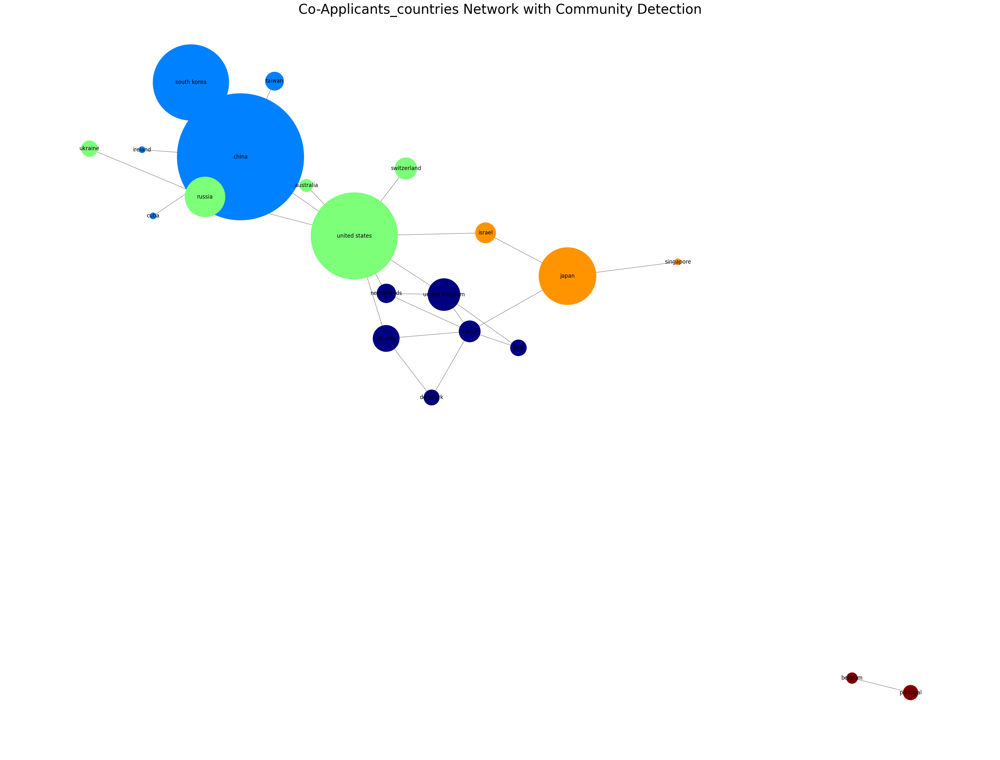

In [ ]:
create_co_inventorship_graph_louvain(data, 'Applicants_countries')

In [ ]:
create_co_inventorship_graph_louvain(data, 'Applicants_clean')

In [ ]:
create_co_inventorship_graph_louvain(data, 'Inventors_clean')

#### greedy_modularity_communities

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
from collections import Counter
from networkx.algorithms import community as nx_community

def create_co_inventorship_graph_greedy(dataframe, entity_column):
    # Data cleaning and parsing
    df_cleaned = dataframe.dropna(subset=[entity_column]).copy()
    df_cleaned[entity_column] = df_cleaned[entity_column].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])

    # Select the top entities
    top_entities = df_cleaned[entity_column].explode().value_counts().head(1000).index.tolist()

    # Filter the data to include only these top entities
    df_cleaned[entity_column] = df_cleaned[entity_column].apply(lambda x: [entity for entity in x if entity in top_entities])

    # Create the network
    G = nx.Graph()
    for entities in df_cleaned[entity_column]:
        for i in range(len(entities)):
            for j in range(i + 1, len(entities)):
                G.add_edge(entities[i], entities[j])

    # Detect communities using the Louvain method
    partition = nx_community.greedy_modularity_communities(G)

    # Map each node to its community
    community_map = {node: idx for idx, community in enumerate(partition) for node in community}

    # Convert entity counts to a list of node sizes for the network plot
    entity_counts = Counter(df_cleaned[entity_column].explode())
    node_sizes = [entity_counts[node] * 100 for node in G.nodes()]

    # Draw the network
    plt.figure(figsize=(40, 30))
    pos = nx.spring_layout(G, k=0.1, iterations=20)
    nx.draw_networkx(G, pos, with_labels=True, node_size=node_sizes, font_size=10, font_color='black', node_color=[community_map[node] for node in G.nodes()], edge_color='gray', cmap=plt.cm.jet)
    plt.axis('off')
    plt.title(f'Co-{entity_column} Network with Community Detection', fontsize=30)
    plt.show()

# Example usage with your dataset
# create_co_inventorship_graph(data, 'Applicants')



In [ ]:
create_co_inventorship_graph_greedy(data, 'Applicants_clean')

In [ ]:
create_co_inventorship_graph_greedy(data, 'Inventors_clean')

In [ ]:
#create_co_inventorship_graph_greedy(data, 'IPCR Sections')

In [ ]:
#create_co_inventorship_graph_greedy(data, 'IPCR Class')

In [ ]:
# create_co_inventorship_graph_greedy(data, 'IPCR Subclass')

In [ ]:
#create_co_inventorship_graph_greedy(data, 'IPCR Classifications')

In [ ]:
data.columns

Index(['#', 'Jurisdiction', 'Kind', 'Display Key', 'Lens ID',
       'Publication Date', 'Publication Year', 'Application Number',
       'Application Date', 'Priority Numbers', 'Earliest Priority Date',
       'Title', 'Abstract', 'Applicants', 'Inventors', 'Owners', 'URL',
       'Document Type', 'Has Full Text', 'Cites Patent Count',
       'Cited by Patent Count', 'Simple Family Size', 'Extended Family Size',
       'Sequence Count', 'CPC Classifications', 'IPCR Classifications',
       'US Classifications', 'NPL Citation Count',
       'NPL Resolved Citation Count', 'NPL Resolved Lens ID(s)',
       'NPL Resolved External ID(s)', 'NPL Citations', 'Legal Status',
       'Topic N°', 'Application Year', 'Earliest Priority Year',
       'Application_Year_Range', 'IPCR Sections', 'IPCR Class',
       'IPCR Subclass', 'Jurisdiction_name', 'Jurisdiction_Region',
       'Number of Unique Applicants', 'Number of Unique Inventors',
       'Number of Unique IPCR Sections', 'Number of Unique 

In [ ]:
#create_co_inventorship_graph_louvain(data, 'IPCR Classifications')

In [ ]:
#create_co_inventorship_graph_greedy(data, 'Applicants_clean')

In [ ]:
#create_co_inventorship_graph_louvain(data, 'Applicants_clean')

# others graphs

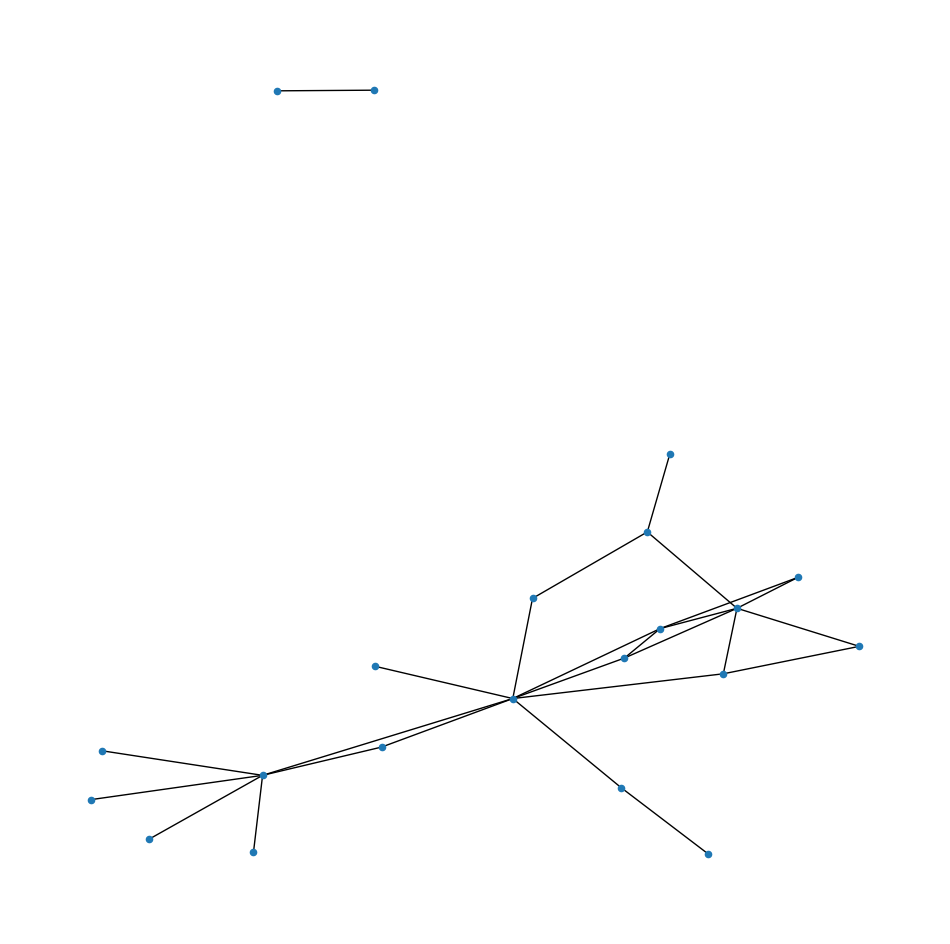

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists

# Data cleaning and parsing
data2 = data.dropna(subset=['Applicants_countries'])  # Remove rows where 'Inventors' is NaN
data2['Applicants_countries'] = data2['Applicants_countries'].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])

# Create the network
G1 = nx.Graph()

# Add nodes and edges
for inventors in data2['Applicants_countries']:
    for i in range(len(inventors)):
        for j in range(i+1, len(inventors)):
            # Add an edge between each pair of inventors
            G1.add_edge(inventors[i], inventors[j])

# Draw the network
plt.figure(figsize=(12, 12))
nx.draw_networkx(G1, with_labels=False, node_size=20, font_size=8)
plt.axis('off')  # Turn off the axis
plt.show()


In [ ]:
import networkx as nx
import pandas as pd

# Assuming your graph is stored in the variable G

# Degree Centrality
degree_centrality = nx.degree_centrality(G)
degree_df = pd.DataFrame(degree_centrality.items(), columns=['Applicants_countries', 'Degree Centrality'])

# Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(G)
betweenness_df = pd.DataFrame(betweenness_centrality.items(), columns=['Applicants_countries', 'Betweenness Centrality'])

# Closeness Centrality
closeness_centrality = nx.closeness_centrality(G)
closeness_df = pd.DataFrame(closeness_centrality.items(), columns=['Applicants_countries', 'Closeness Centrality'])

# Eigenvector Centrality
#eigenvector_centrality = nx.eigenvector_centrality(G)
#eigenvector_df = pd.DataFrame(eigenvector_centrality.items(), columns=['Applicants_countries', 'Eigenvector Centrality'])

# Merge all centrality measures into one DataFrame
centrality_df = degree_df.merge(betweenness_df, on='Applicants_countries').merge(closeness_df, on='Applicants_countries')#.merge(eigenvector_df, on='Inventor')

# Sort the DataFrame based on any centrality measure to identify the most influential inventors
sorted_df = centrality_df.sort_values(by='Degree Centrality', ascending=False)

# Display the DataFrame
sorted_df


,Applicants_countries,Degree Centrality,Betweenness Centrality,Closeness Centrality
1906,LIU YANG,0.012707,0.023347,0.064299
71,LIU YULING,0.010397,0.012050,0.061635
117,KANG SANG HYEON,0.009819,0.000091,0.012239
116,JUN SOO YOUN,0.009434,0.000082,0.012065
26,REN HUIYING,0.008856,0.003821,0.052838
...,...,...,...,...
2301,NAIR SEAN,0.000193,0.000000,0.000193
2300,WILSON MICHAEL,0.000193,0.000000,0.000193
4671,MISU YOSHIMI,0.000193,0.000000,0.000193
4672,UEDA HIROSHI,0.000193,0.000000,0.000193


<ipython-input-300-4b78ca99779c>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['Applicants_clean'] = data2['Applicants_clean'].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])


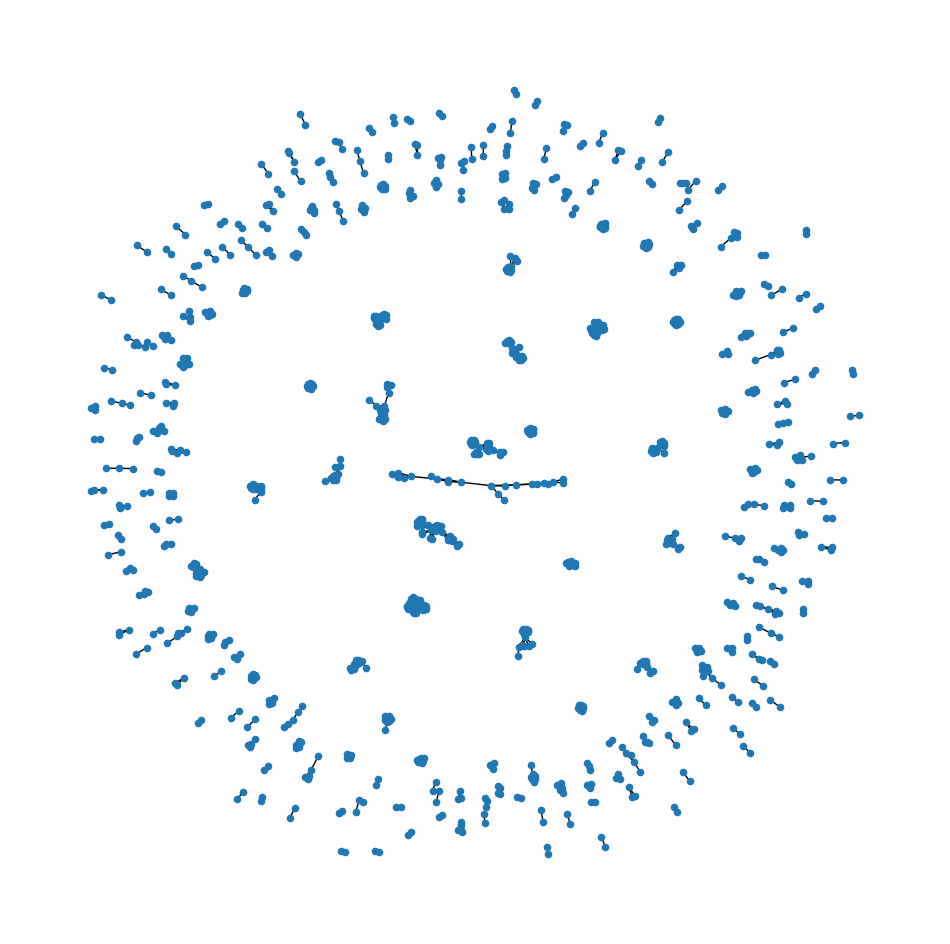

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists

# Data cleaning and parsing
data2 = data.dropna(subset=['Applicants_clean'])  # Remove rows where 'Inventors' is NaN
data2['Applicants_clean'] = data2['Applicants_clean'].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])

# Create the network
G1 = nx.Graph()

# Add nodes and edges
for inventors in data2['Applicants_clean']:
    for i in range(len(inventors)):
        for j in range(i+1, len(inventors)):
            # Add an edge between each pair of inventors
            G1.add_edge(inventors[i], inventors[j])

# Draw the network
plt.figure(figsize=(12, 12))
nx.draw_networkx(G1, with_labels=False, node_size=20, font_size=8)
plt.axis('off')  # Turn off the axis
plt.show()


In [ ]:
import networkx as nx
import pandas as pd

# Assuming your graph is stored in the variable G

# Degree Centrality
degree_centrality = nx.degree_centrality(G)
degree_df = pd.DataFrame(degree_centrality.items(), columns=['Applicant_clean', 'Degree Centrality'])

# Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(G)
betweenness_df = pd.DataFrame(betweenness_centrality.items(), columns=['Applicant_clean', 'Betweenness Centrality'])

# Closeness Centrality
closeness_centrality = nx.closeness_centrality(G)
closeness_df = pd.DataFrame(closeness_centrality.items(), columns=['Applicant_clean', 'Closeness Centrality'])

# Eigenvector Centrality
#eigenvector_centrality = nx.eigenvector_centrality(G)
#eigenvector_df = pd.DataFrame(eigenvector_centrality.items(), columns=['Applicant_clean', 'Eigenvector Centrality'])

# Merge all centrality measures into one DataFrame
centrality_df = degree_df.merge(betweenness_df, on='Applicant_clean').merge(closeness_df, on='Applicant_clean')#.merge(eigenvector_df, on='Inventor')

# Sort the DataFrame based on any centrality measure to identify the most influential inventors
sorted_df = centrality_df.sort_values(by='Degree Centrality', ascending=False)

# Display the DataFrame
sorted_df


,Applicant_clean,Degree Centrality,Betweenness Centrality,Closeness Centrality
1906,LIU YANG,0.012707,0.023347,0.064299
71,LIU YULING,0.010397,0.012050,0.061635
117,KANG SANG HYEON,0.009819,0.000091,0.012239
116,JUN SOO YOUN,0.009434,0.000082,0.012065
26,REN HUIYING,0.008856,0.003821,0.052838
...,...,...,...,...
2301,NAIR SEAN,0.000193,0.000000,0.000193
2300,WILSON MICHAEL,0.000193,0.000000,0.000193
4671,MISU YOSHIMI,0.000193,0.000000,0.000193
4672,UEDA HIROSHI,0.000193,0.000000,0.000193


<ipython-input-302-e548f6855da7>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['Inventors_clean'] = data2['Inventors_clean'].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])


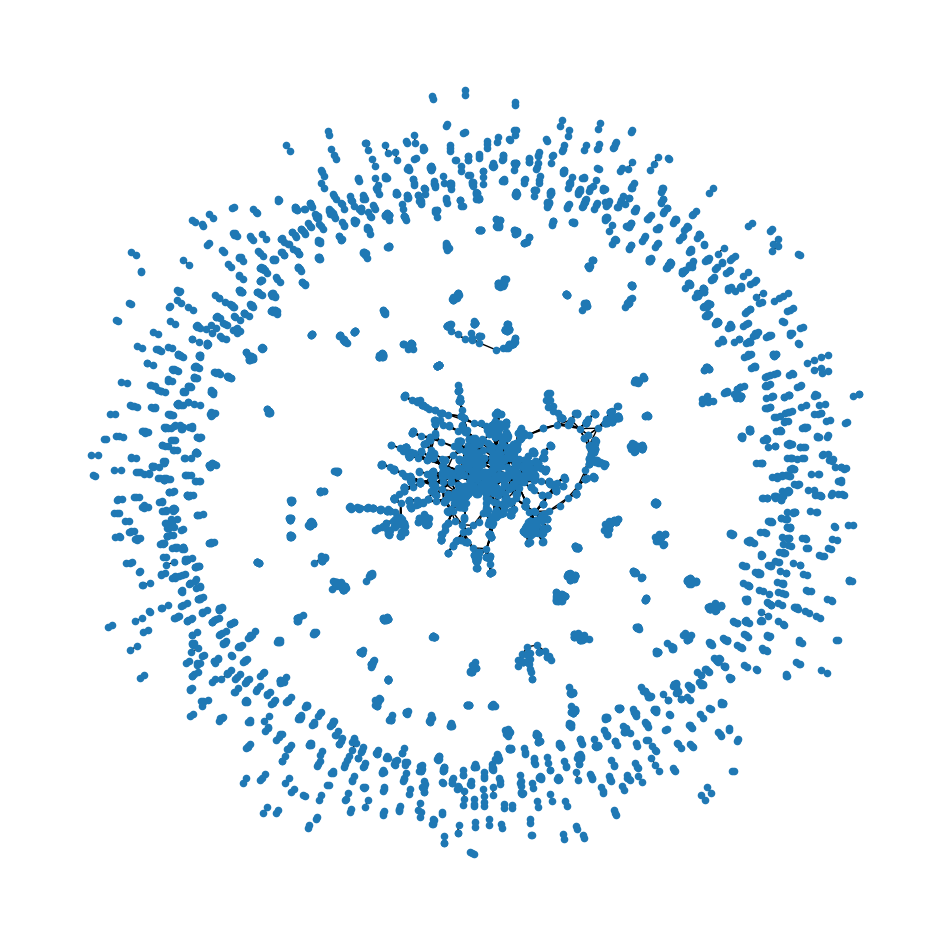

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists

# Data cleaning and parsing
data2 = data.dropna(subset=['Inventors_clean'])  # Remove rows where 'Inventors' is NaN
data2['Inventors_clean'] = data2['Inventors_clean'].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])

# Create the network
G1 = nx.Graph()

# Add nodes and edges
for inventors in data2['Inventors_clean']:
    for i in range(len(inventors)):
        for j in range(i+1, len(inventors)):
            # Add an edge between each pair of inventors
            G1.add_edge(inventors[i], inventors[j])

# Draw the network
plt.figure(figsize=(12, 12))
nx.draw_networkx(G1, with_labels=False, node_size=20, font_size=8)
plt.axis('off')  # Turn off the axis
plt.show()


In [ ]:
import networkx as nx
import pandas as pd

# Assuming your graph is stored in the variable G

# Degree Centrality
degree_centrality = nx.degree_centrality(G)
degree_df = pd.DataFrame(degree_centrality.items(), columns=['Inventor_clean', 'Degree Centrality'])

# Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(G)
betweenness_df = pd.DataFrame(betweenness_centrality.items(), columns=['Inventor_clean', 'Betweenness Centrality'])

# Closeness Centrality
closeness_centrality = nx.closeness_centrality(G)
closeness_df = pd.DataFrame(closeness_centrality.items(), columns=['Inventor_clean', 'Closeness Centrality'])

# Eigenvector Centrality
#eigenvector_centrality = nx.eigenvector_centrality(G)
#eigenvector_df = pd.DataFrame(eigenvector_centrality.items(), columns=['Inventor_clean', 'Eigenvector Centrality'])

# Merge all centrality measures into one DataFrame
centrality_df = degree_df.merge(betweenness_df, on='Inventor_clean').merge(closeness_df, on='Inventor_clean')#.merge(eigenvector_df, on='Inventor')

# Sort the DataFrame based on any centrality measure to identify the most influential inventors
sorted_df = centrality_df.sort_values(by='Degree Centrality', ascending=False)

# Display the DataFrame
sorted_df


,Inventor_clean,Degree Centrality,Betweenness Centrality,Closeness Centrality
1906,LIU YANG,0.012707,0.023347,0.064299
71,LIU YULING,0.010397,0.012050,0.061635
117,KANG SANG HYEON,0.009819,0.000091,0.012239
116,JUN SOO YOUN,0.009434,0.000082,0.012065
26,REN HUIYING,0.008856,0.003821,0.052838
...,...,...,...,...
2301,NAIR SEAN,0.000193,0.000000,0.000193
2300,WILSON MICHAEL,0.000193,0.000000,0.000193
4671,MISU YOSHIMI,0.000193,0.000000,0.000193
4672,UEDA HIROSHI,0.000193,0.000000,0.000193


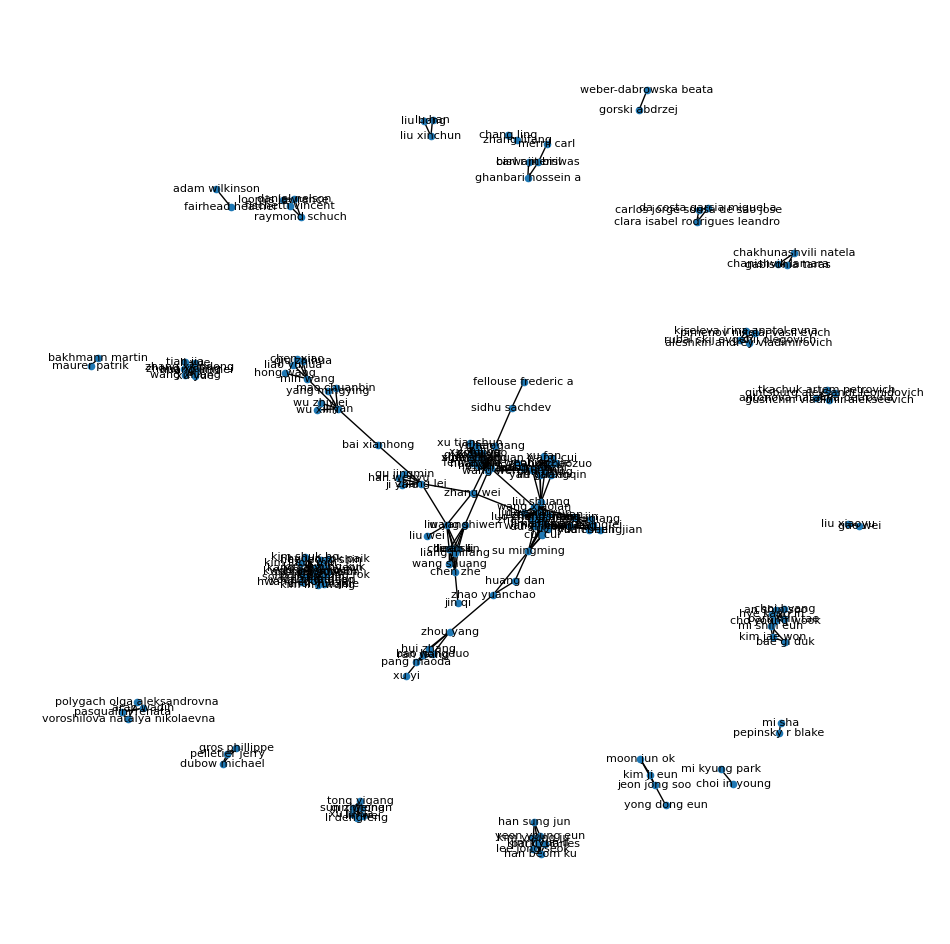

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter

# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists

# Data cleaning and parsing
data2 = data.dropna(subset=['Inventors_clean']).copy()  # Remove rows where 'Inventors' is NaN and create a copy
data2.loc[:, 'Inventors_clean'] = data2['Inventors_clean'].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])


# Select the top 200 inventors
top_inventors = data['Inventors_clean'].str.split(';;').explode().str.strip().value_counts().head(200).reset_index()['index'].to_list()

# Convert each inventor's name to lowercase
top_inventors = [name.lower() for name in top_inventors]

top_inventors

# Filter the data to include only these top inventors
data2.loc[:, 'Inventors_clean'] = data2['Inventors_clean'].apply(lambda x: [inventor for inventor in x if inventor in top_inventors])

# Create the network
G = nx.Graph()

# Add nodes and edges
for inventors in data2['Inventors_clean']:
    for i in range(len(inventors)):
        for j in range(i + 1, len(inventors)):
            # Add an edge between each pair of inventors
            G.add_edge(inventors[i], inventors[j])

# Draw the network
plt.figure(figsize=(12, 12))
nx.draw_networkx(G, with_labels=True, node_size=20, font_size=8)
plt.axis('off')  # Turn off the axis
plt.show()


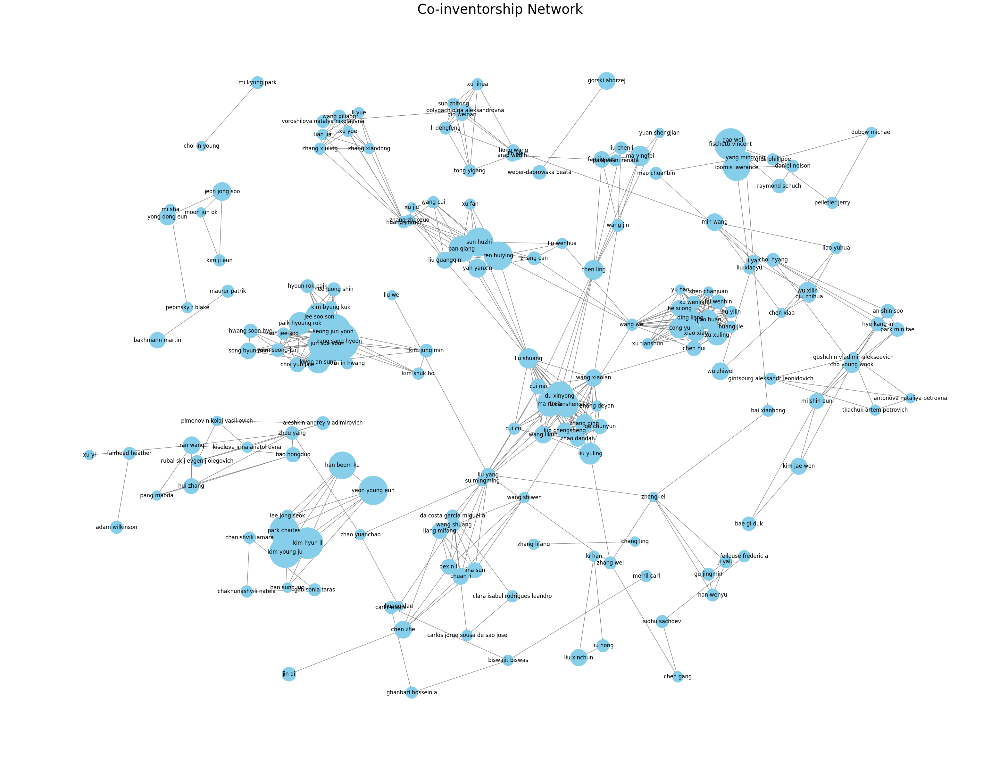

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter

# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists

# Data cleaning and parsing
data2 = data.dropna(subset=['Inventors_clean']).copy()  # Remove rows where 'Inventors' is NaN and create a copy
data2.loc[:, 'Inventors_clean'] = data2['Inventors_clean'].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])

# Select the top 200 inventors
top_inventors = data['Inventors_clean'].str.split(';;').explode().str.strip().value_counts().head(200).reset_index()['index'].to_list()

# Convert each inventor's name to lowercase
top_inventors = [name.lower() for name in top_inventors]

# Filter the data to include only these top inventors
data2.loc[:, 'Inventors_clean'] = data2['Inventors_clean'].apply(lambda x: [inventor for inventor in x if inventor in top_inventors])

# Create a dictionary to store the count of applications for each inventor
application_counts = Counter(data2['Inventors_clean'].explode())

# Create the network
G = nx.Graph()

# Add nodes and edges
for inventors in data2['Inventors_clean']:
    for i in range(len(inventors)):
        for j in range(i + 1, len(inventors)):
            # Add an edge between each pair of inventors
            G.add_edge(inventors[i], inventors[j])

# Convert application counts to a list of node sizes for the network plot
node_sizes = [application_counts[node] * 100 for node in G.nodes()]  # Multiplied by 100 for better visibility

# Draw the network
plt.figure(figsize=(40, 30))  # Increased figure size
pos = nx.spring_layout(G, k=0.15, iterations=20)  # Adjusted layout parameters for better spacing
nx.draw_networkx(G, pos, with_labels=True, node_size=node_sizes, font_size=12, font_color='black', node_color='skyblue', edge_color='gray')
plt.axis('off')  # Turn off the axis
plt.title('Co-inventorship Network', fontsize=30)  # Added title
plt.show()


In [ ]:
import networkx as nx
import pandas as pd

# Assuming your graph is stored in the variable G

# Degree Centrality
degree_centrality = nx.degree_centrality(G)
degree_df = pd.DataFrame(degree_centrality.items(), columns=['Inventors_clean', 'Degree Centrality'])

# Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(G)
betweenness_df = pd.DataFrame(betweenness_centrality.items(), columns=['Inventors_clean', 'Betweenness Centrality'])

# Closeness Centrality
closeness_centrality = nx.closeness_centrality(G)
closeness_df = pd.DataFrame(closeness_centrality.items(), columns=['Inventors_clean', 'Closeness Centrality'])

# Eigenvector Centrality
#eigenvector_centrality = nx.eigenvector_centrality(G)
#eigenvector_df = pd.DataFrame(eigenvector_centrality.items(), columns=['Inventors_clean', 'Eigenvector Centrality'])

# Merge all centrality measures into one DataFrame
centrality_df = degree_df.merge(betweenness_df, on='Inventors_clean').merge(closeness_df, on='Inventors_clean')#.merge(eigenvector_df, on='Inventor_clean')

# Sort the DataFrame based on any centrality measure to identify the most influential inventors
sorted_df = centrality_df.sort_values(by='Degree Centrality', ascending=False)

# Display the DataFrame
sorted_df


,Inventors_clean,Degree Centrality,Betweenness Centrality,Closeness Centrality
78,liu shuang,0.101124,0.035399,0.144952
25,wang wei,0.095506,0.039991,0.129007
19,kang sang hyeon,0.089888,0.001134,0.089888
18,jun soo youn,0.089888,0.001134,0.089888
7,li xiansheng,0.084270,0.013986,0.144952
...,...,...,...,...
142,bakhmann martin,0.005618,0.000000,0.005618
127,pasqualini renata,0.005618,0.000000,0.005618
128,arap wadih,0.005618,0.000000,0.005618
133,fairhead heather,0.005618,0.000000,0.005618


<ipython-input-307-13f9fb89aa73>:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('YlOrRd')
/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:437: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(
<ipython-input-307-13f9fb89aa73>:57: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0, max_degree)), label='Degree Centrality', orientation='vertical')


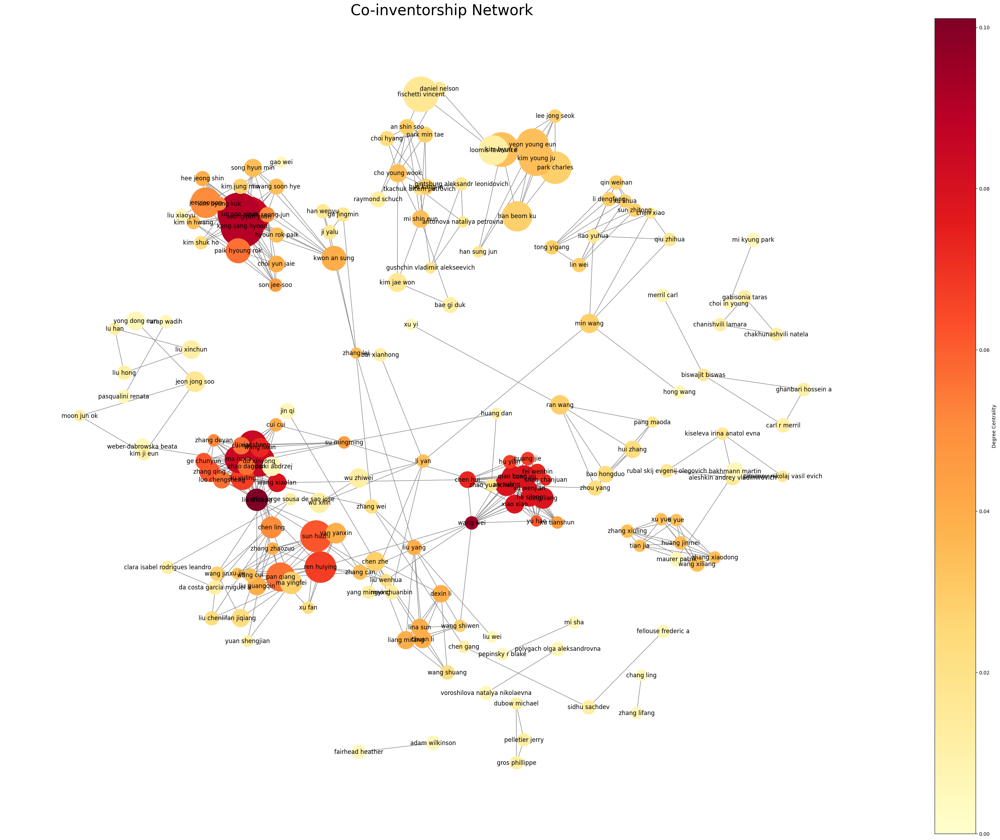

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
from collections import Counter

# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists

# Data cleaning and parsing
data2 = data.dropna(subset=['Inventors_clean']).copy()  # Remove rows where 'Inventors' is NaN and create a copy
data2.loc[:, 'Inventors_clean'] = data2['Inventors_clean'].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])

# Select the top 200 inventors
top_inventors = data['Inventors_clean'].str.split(';;').explode().str.strip().value_counts().head(200).reset_index()['index'].to_list()

# Convert each inventor's name to lowercase
top_inventors = [name.lower() for name in top_inventors]

# Filter the data to include only these top inventors
data2.loc[:, 'Inventors_clean'] = data2['Inventors_clean'].apply(lambda x: [inventor for inventor in x if inventor in top_inventors])

# Create a dictionary to store the count of applications for each inventor
application_counts = Counter(data2['Inventors_clean'].explode())

# Create the network
G = nx.Graph()

# Add nodes and edges
for inventors in data2['Inventors_clean']:
    for i in range(len(inventors)):
        for j in range(i + 1, len(inventors)):
            # Add an edge between each pair of inventors
            G.add_edge(inventors[i], inventors[j])

# Convert application counts to a list of node sizes for the network plot
node_sizes = [application_counts[node] * 100 for node in G.nodes()]  # Multiplied by 100 for better visibility

# Calculate centrality measures
degree_centrality = nx.degree_centrality(G)

# Convert degree centrality values to a list for node coloring
degree_values = [degree_centrality[node] for node in G.nodes()]

# Normalize degree values for coloring (mapping to a range between 0 and 1)
max_degree = max(degree_values)
degree_values = [degree / max_degree for degree in degree_values]

# Create a colormap
cmap = cm.get_cmap('YlOrRd')

# Draw the network
plt.figure(figsize=(40, 30))  # Increased figure size
pos = nx.spring_layout(G, k=0.15, iterations=20)  # Adjusted layout parameters for better spacing
nx.draw_networkx(G, pos, with_labels=True, node_size=node_sizes, font_size=12, font_color='black', node_color=cmap(degree_values), edge_color='gray', cmap=cmap)
plt.axis('off')  # Turn off the axis
plt.title('Co-inventorship Network', fontsize=30)  # Added title
plt.colorbar(cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0, max_degree)), label='Degree Centrality', orientation='vertical')
plt.show()


<ipython-input-308-0892b19ddff3>:37: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


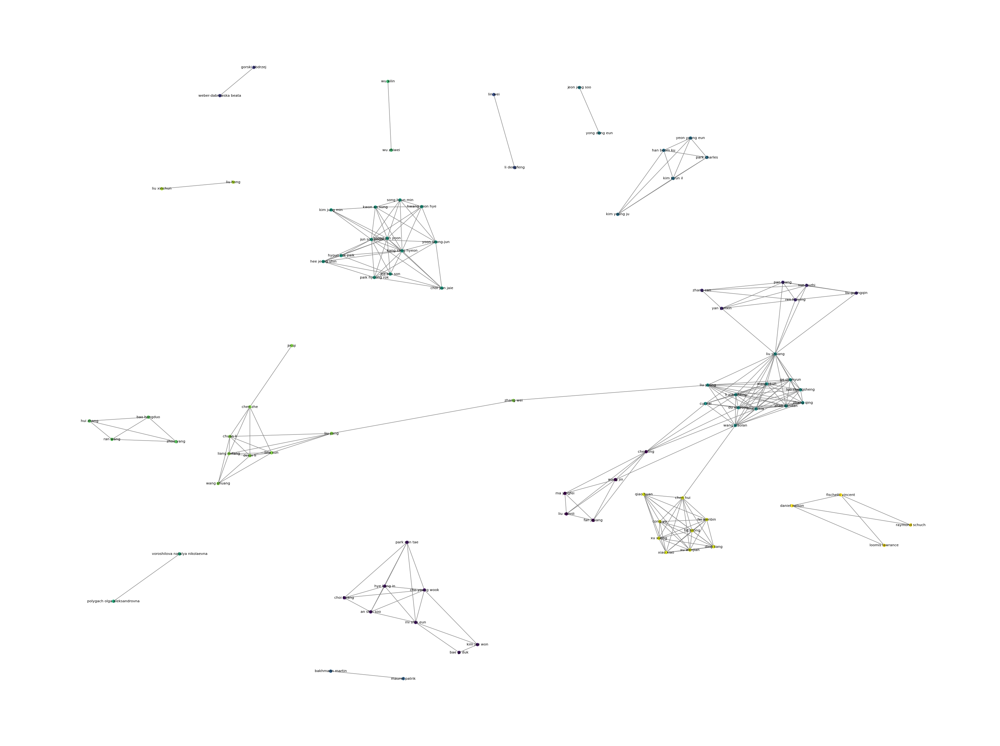

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
from collections import Counter
import community as community_louvain

def build_and_visualize_network(data, entity_column, delimiter=';;', region=None, year_range=None, top_n_entities=None):
    # Filter data based on region and year range if specified
    if region is not None:
        data = data[data['Region'] == region]
    if year_range is not None:
        data = data[(data['Year'] >= year_range[0]) & (data['Year'] <= year_range[1])]

    # Split entities, ensuring to handle NaN values
    data['Entities'] = data[entity_column].fillna('').str.lower().str.split(delimiter)

    # If top_n_entities is specified, filter to include only these entities
    if top_n_entities is not None:
        top_entities = data['Entities'].explode().value_counts().head(top_n_entities).index.tolist()
        data['Entities'] = data['Entities'].apply(lambda entities: [entity for entity in entities if entity in top_entities])

    # Create the network
    G = nx.Graph()
    for entities in data['Entities']:
        for i in range(len(entities)):
            for j in range(i + 1, len(entities)):
                if entities[i] and entities[j]:  # Ensure that both entities are non-empty
                    G.add_edge(entities[i], entities[j])

    # Detect communities
    partition = cl.best_partition(G)

    # Draw the network
    plt.figure(figsize=(40, 30))
    pos = nx.spring_layout(G, k=0.15, iterations=20)
    cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
    nx.draw_networkx(G, pos, node_color=[partition.get(node) for node in G.nodes()], node_size=40, font_size=8, cmap=cmap, edge_color="grey")
    plt.axis('off')
    plt.show()

    return G

# Example Usage
# Assume 'data' is your DataFrame with the necessary columns
G = build_and_visualize_network(data, 'Inventors_clean', delimiter=';;', region=None, year_range=None, top_n_entities=100)


In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
import community as community_louvain

def visualize_collaboration_network(dataframe, entity_column):
    # Data cleaning and parsing
    df_cleaned = dataframe.dropna(subset=[entity_column]).copy()
    df_cleaned[entity_column] = df_cleaned[entity_column].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])

    # Create the network
    G = nx.Graph()
    for entities in df_cleaned[entity_column]:
        for i in range(len(entities)):
            for j in range(i + 1, len(entities)):
                G.add_edge(entities[i], entities[j])

    # Detect communities
    partition = cl.best_partition(G)

    # Visualize the network
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G)
    cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
    nx.draw_networkx(G, pos, node_color=[partition.get(node) for node in G.nodes()], node_size=40, font_size=10, cmap=cmap, width=0.5)
    plt.title('Collaboration Network')
    plt.colorbar(cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=max(partition.values()))), label='Community')
    plt.axis('off')
    plt.show()

# Example Usage
# Assuming 'data' is your DataFrame with a column 'Entities' containing the entity lists
#visualize_collaboration_network(data, 'Entities')


<ipython-input-309-6ac16b3dba2a>:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-309-6ac16b3dba2a>:28: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=max(partition.values()))), label='Community')


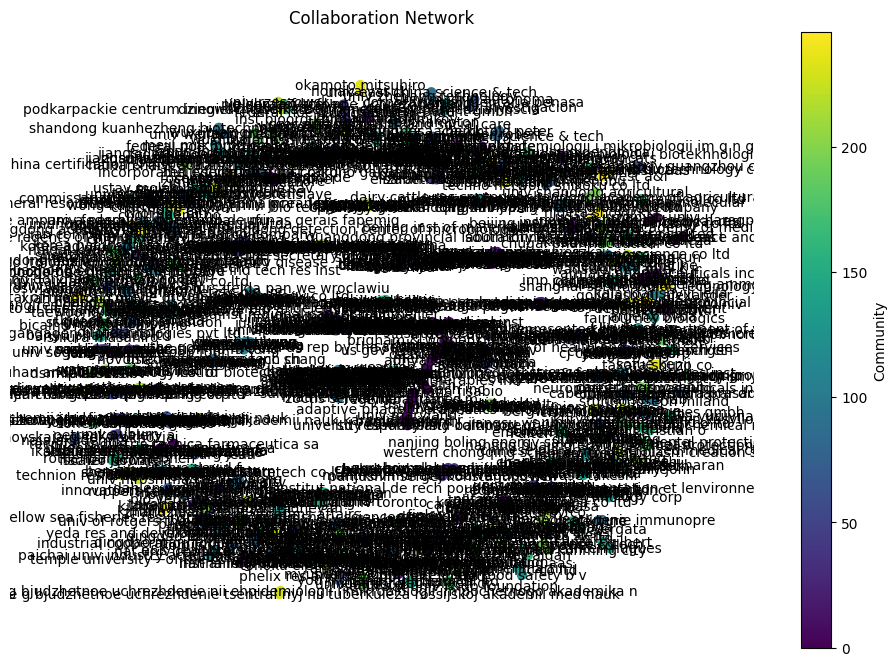

In [ ]:
visualize_collaboration_network(data, 'Applicants_clean')

<ipython-input-311-ca2bdb2ebbb7>:93: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(cm.ScalarMappable(cmap=cm.YlOrRd, norm=plt.Normalize(vmin=0, vmax=max_centrality)),


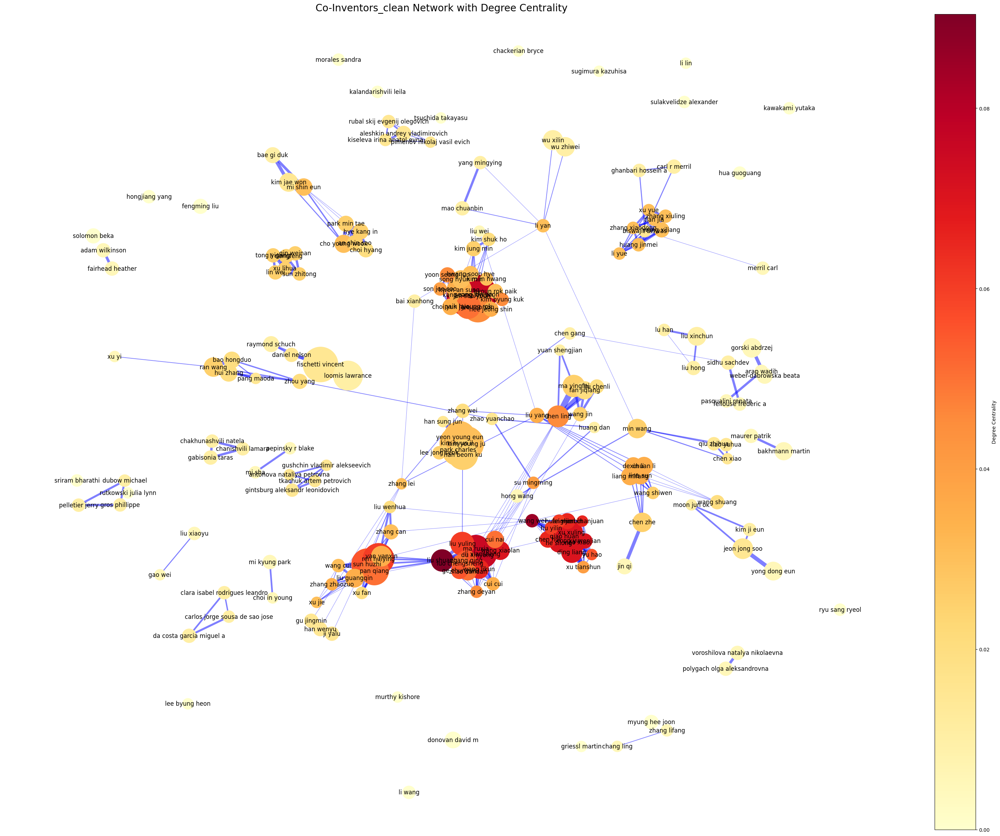

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
from collections import defaultdict

def draw_centrality_network(data, column, top_n=200, centrality_measure='degree'):
    """
    Draw a network graph based on a specified centrality measure for top N inventors
    with the edge width reflecting the strength of collaboration.

    Args:
    - data (pd.DataFrame): DataFrame containing the inventor data.
    - column (str): The column name in the DataFrame that contains the inventors' names.
    - top_n (int): Number of top inventors to consider for the network.
    - centrality_measure (str): The type of centrality measure to use.

    Returns:
    None
    """
    # Data cleaning and parsing
    data2 = data.dropna(subset=[column]).copy()
    data2[column] = data2[column].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])

    # Select the top N inventors
    top_inventors = data[column].str.split(';;').explode().str.strip().value_counts().head(top_n).index.tolist()
    top_inventors = [name.lower() for name in top_inventors]

    # Filter data for top inventors only and remove NaN entries
    data2[column] = data2[column].apply(lambda x: [inventor for inventor in x if inventor in top_inventors])

    # Create a dictionary for application counts
    application_counts = pd.Series(data2[column].explode()).value_counts().to_dict()

    # Initialize a defaultdict to store collaboration strength
    collaboration_strength = defaultdict(int)

    # Calculate the weight (strength) of the collaboration between each pair of inventors
    for inventors in data2[column]:
        for i in range(len(inventors)):
            for j in range(i + 1, len(inventors)):
                edge = tuple(sorted([inventors[i], inventors[j]]))
                collaboration_strength[edge] += 1

    # Create the network
    G = nx.Graph()

    # Add nodes with attributes for application counts
    for inventor, count in application_counts.items():
        G.add_node(inventor, applications=count)

    # Add edges with the collaboration strength as weight
    for (inventor_a, inventor_b), weight in collaboration_strength.items():
        G.add_edge(inventor_a, inventor_b, weight=weight)

    # Choose the centrality measure
    centrality_dict = {
        'degree': nx.degree_centrality,
        'closeness': nx.closeness_centrality,
        'betweenness': nx.betweenness_centrality,
        'eigenvector': nx.eigenvector_centrality
    }

    # Calculate the selected centrality measure
    if centrality_measure in centrality_dict:
        centrality = centrality_dict[centrality_measure](G)
    else:
        raise ValueError(f"Centrality measure '{centrality_measure}' is not supported.")

    # Node sizes based on application counts
    node_sizes = [100 * G.nodes[node]['applications'] for node in G]

    # Centrality values for node colors
    centrality_values = list(centrality.values())

    # Normalize centrality values for node color
    max_centrality = max(centrality_values, default=0)
    centrality_values = [c / max_centrality for c in centrality_values] if max_centrality else centrality_values

    # Edge widths based on collaboration strength
    edge_widths = [G[u][v]['weight'] for u, v in G.edges()]
    max_edge_width = max(edge_widths) if edge_widths else 1
    edge_widths = [ew / max_edge_width * 50 for ew in edge_widths]  # Normalize and scale edge width for visibility

    # Draw the network
    plt.figure(figsize=(40, 30))
    pos = nx.spring_layout(G, k=0.15, iterations=20)
    nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.5, edge_color='blue')
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=centrality_values, cmap=cm.YlOrRd)
    nx.draw_networkx_labels(G, pos, font_size=12, font_color='black')

    plt.title(f'Co-{column.capitalize()} Network with {centrality_measure.capitalize()} Centrality', fontsize=20)
    plt.colorbar(cm.ScalarMappable(cmap=cm.YlOrRd, norm=plt.Normalize(vmin=0, vmax=max_centrality)),
                 label=f'{centrality_measure.capitalize()} Centrality', orientation='vertical')
    plt.axis('off')
    plt.show()

# Example usage:
# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists
# data = pd.read_csv('your_dataset.csv') # Replace with your actual data loading method
draw_centrality_network(data, 'Inventors_clean', top_n=200, centrality_measure='degree')


In [ ]:
draw_centrality_network(data, 'Inventors_clean', top_n=200, centrality_measure='degree')
draw_centrality_network(data, 'Inventors_clean', top_n=200, centrality_measure='closeness')
draw_centrality_network(data, 'Inventors_clean', top_n=200, centrality_measure='betweenness')
#draw_centrality_network(data, 'Inventors_clean', top_n=200, centrality_measure='eigenvector')

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
from collections import defaultdict

def draw_centrality_network(data, column, top_n=200, centrality_measure='degree'):
    # Data cleaning and parsing
    data2 = data.dropna(subset=[column]).copy()
    data2[column] = data2[column].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])

    # Select the top N entities
    top_entities = data[column].str.split(';;').explode().str.strip().value_counts().head(top_n).index.to_list()
    top_entities = [name.lower() for name in top_entities]

    # Filter data for top entities only and remove NaN entries
    data2[column] = data2[column].apply(lambda x: [entity for entity in x if entity in top_entities and not pd.isna(entity)])

    # Create a dictionary for application counts
    application_counts = Counter(data2[column].explode())

    # Prepare a dictionary to hold the collaboration sizes (weights)
    collaboration_sizes = defaultdict(int)

    # Calculate collaboration sizes
    for entities in data2[column]:
        for i in range(len(entities)):
            for j in range(i + 1, len(entities)):
                pair = tuple(sorted([entities[i], entities[j]]))  # Sort the tuple for consistency
                collaboration_sizes[pair] += 1

    # Create the network
    G = nx.Graph()

    # Add nodes with attributes for application counts. When adding nodes, skip any that are NaN
    for entity, count in application_counts.items():
        if pd.isna(entity):  # Skip NaN entity names
            continue
        G.add_node(entity, applications=count)

    # Add edges with weights
    for (entity1, entity2), weight in collaboration_sizes.items():
        G.add_edge(entity1, entity2, weight=weight)

    # Choose the centrality measure
    centrality_dict = {
        'degree': nx.degree_centrality,
        'closeness': nx.closeness_centrality,
        'betweenness': nx.betweenness_centrality,
        'eigenvector': nx.eigenvector_centrality
    }

    # Calculate the selected centrality measure
    if centrality_measure in centrality_dict:
        centrality = centrality_dict[centrality_measure](G)
    else:
        raise ValueError(f"Centrality measure '{centrality_measure}' is not supported.")

    # Normalize centrality values for node color
    centrality_values = list(centrality.values())
    max_centrality = max(centrality_values, default=0)
    if max_centrality == 0:
        centrality_values = [0 for _ in centrality_values]
    else:
        centrality_values = [c / max_centrality for c in centrality_values]

    node_sizes = [100 * G.nodes[node]['applications'] for node in G.nodes()]
    edge_colors = [G[u][v]['weight'] for u, v in G.edges()]
    edge_cmap = cm.get_cmap('Blues')



```
    plt.figure(figsize=(40, 30))
    pos = nx.spring_layout(G, k=0.15, iterations=20)
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=centrality_values, cmap=cm.YlOrRd)
    nx.draw_networkx_edges(G, pos, edge_color=edge_colors, edge_cmap=edge_cmap, alpha=0.5, width=3)
    nx.draw_networkx_labels(G, pos, font_size=12, font_color='black')

    plt.axis('off')
    plt.title(f'Co-{column} Network with {centrality_measure.capitalize()} Centrality and Collaboration Weights', fontsize=20)
    plt.colorbar(cm.ScalarMappable(cmap=edge_cmap, norm=plt.Normalize(vmin=min(edge_colors), vmax=max(edge_colors))),
                 label='Collaboration Weight', orientation='vertical')
    plt.show()

#### Example usage:
##### Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists
draw_centrality_network(data, 'Inventors', top_n=200, centrality_measure='degree')
draw_centrality_network(data, 'Inventors', top_n=200, centrality_measure='degree')
draw_centrality_network(data, 'Inventors', top_n=200, centrality_measure='closeness')
draw_centrality_network(data, 'Inventors', top_n=200, centrality_measure='betweenness')
draw_centrality_network(data, 'Inventors', top_n=200, centrality_measure='eigenvector')
```





```


import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
from collections import Counter

def draw_centrality_network(data, column, top_n=200, centrality_measure='degree'):
    """
    Draw a network graph based on a specified centrality measure for top N inventors.

    Args:
    - data (pd.DataFrame): DataFrame containing the inventor data.
    - column (str): The column name in the DataFrame that contains the inventors' names.
    - top_n (int): Number of top inventors to consider for the network.
    - centrality_measure (str): The type of centrality measure to use. Options are 'degree', 'closeness', 'betweenness', 'eigenvector'.
    
    Returns:
    None
    """
    # Data cleaning and parsing
    data2 = data.dropna(subset=[column]).copy()
    data2[column] = data2[column].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])

    # Select the top N inventors
    top_inventors = data[column].str.split(';;').explode().str.strip().value_counts().head(top_n).index.to_list()
    top_inventors = [name.lower() for name in top_inventors]

    # Filter data for top inventors only and remove NaN entries
    data2[column] = data2[column].apply(lambda x: [inventor for inventor in x if inventor in top_inventors and not pd.isna(inventor)])

    
    # Create a dictionary for application counts
    application_counts = Counter(data2[column].explode())

    # Create the network
    G = nx.Graph()

    # Add nodes with attributes for application counts. When adding nodes, skip any that are NaN
    for inventor, count in application_counts.items():
        if pd.isna(inventor):  # Skip NaN inventor names
            continue
        G.add_node(inventor, applications=count)

    # Add edges
    for inventors in data2[column]:
        for i in range(len(inventors)):
            for j in range(i + 1, len(inventors)):
                G.add_edge(inventors[i], inventors[j])

    # Choose the centrality measure
    centrality_dict = {
        'degree': nx.degree_centrality,
        'closeness': nx.closeness_centrality,
        'betweenness': nx.betweenness_centrality,
        'eigenvector': nx.eigenvector_centrality
    }

    
    # Calculate the selected centrality measure
    if centrality_measure in centrality_dict:
        centrality = centrality_dict[centrality_measure](G)
    else:
        raise ValueError(f"Centrality measure '{centrality_measure}' is not supported.")
    
    # Convert centrality values to lists for plotting
    node_sizes = [100 * G.nodes[node]['applications'] for node in G.nodes()]
    centrality_values = [centrality[node] for node in G.nodes()]

    # Normalize centrality values for node color
    #max_centrality = max(centrality_values)
    #centrality_values = [c / max_centrality for c in centrality_values]

    # Normalize centrality values for node color
    max_centrality = max(centrality_values, default=0)  # Use default=0 to handle empty centrality_values list
    if max_centrality == 0:
        # Avoid division by zero if all centrality values are zero
        centrality_values = [0 for _ in centrality_values]
    else:
        centrality_values = [c / max_centrality for c in centrality_values]


    # Draw the network
    plt.figure(figsize=(40, 30))
    pos = nx.spring_layout(G, k=0.15, iterations=20)
    nx.draw_networkx(
        G, pos, with_labels=True, node_size=node_sizes, font_size=12, font_color='black',
        node_color=centrality_values, edge_color='gray', cmap=cm.YlOrRd
    )
    plt.axis('off')
    plt.title(f'Co-{column} Network with {centrality_measure.capitalize()} Centrality', fontsize=20)
    plt.colorbar(cm.ScalarMappable(cmap=cm.YlOrRd, norm=plt.Normalize(0, max_centrality)),
                 label=f'{centrality_measure.capitalize()} Centrality', orientation='vertical')
    plt.show()

#### Example usage:
##### Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists
draw_centrality_network(data, 'Inventors', top_n=200, centrality_measure='degree')
draw_centrality_network(data, 'Inventors', top_n=200, centrality_measure='closeness')
draw_centrality_network(data, 'Inventors', top_n=200, centrality_measure='betweenness')
draw_centrality_network(data, 'Inventors', top_n=200, centrality_measure='eigenvector')
# Ce texte est au format code
```

In [ ]:
data['Applicants_clean']

0                               NOVOSIB NII T;;UBERKULEZA
1       TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...
2       TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...
3       TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...
4       TechnoPhage;;TECNIFAR INDUSTRIA TECNICA FARMAC...
                              ...                        
2360                                            UPJOHN CO
2361                                            UPJOHN CO
2362                                 TCM BIOTECH INT CORP
2363                FLAGSHIP PIONEERING INNOVATIONS V INC
2364                                           BIOGEN INC
Name: Applicants_clean, Length: 2365, dtype: object

<ipython-input-311-ca2bdb2ebbb7>:93: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(cm.ScalarMappable(cmap=cm.YlOrRd, norm=plt.Normalize(vmin=0, vmax=max_centrality)),


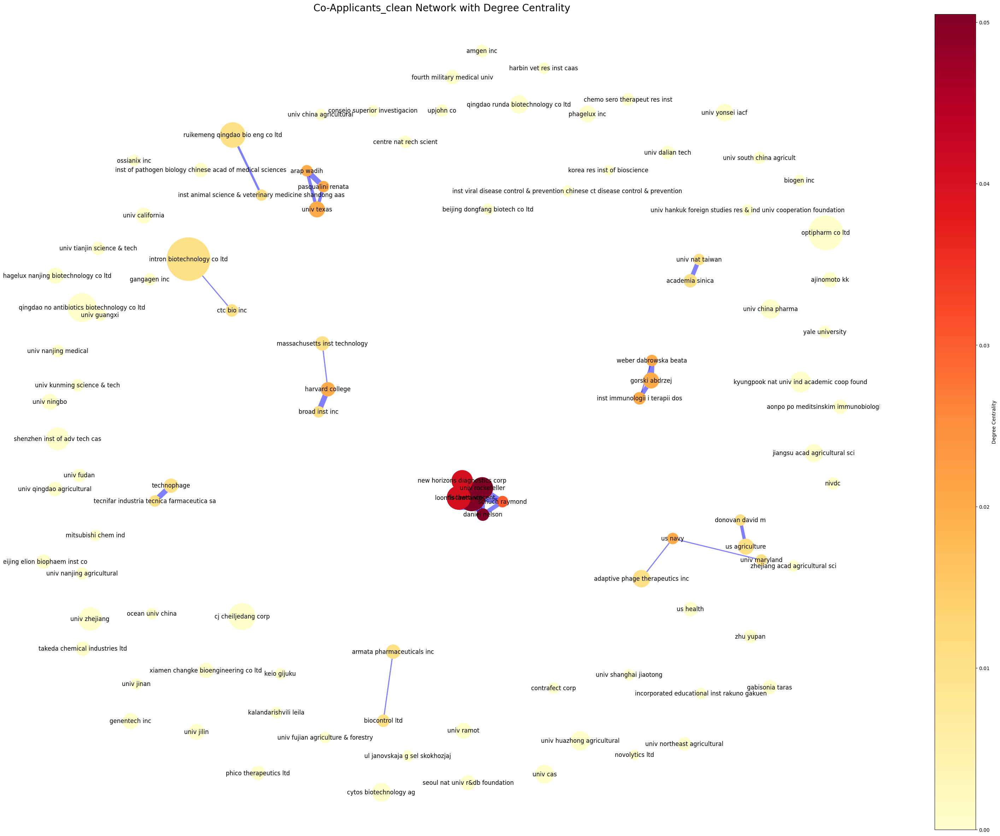

<ipython-input-311-ca2bdb2ebbb7>:93: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(cm.ScalarMappable(cmap=cm.YlOrRd, norm=plt.Normalize(vmin=0, vmax=max_centrality)),


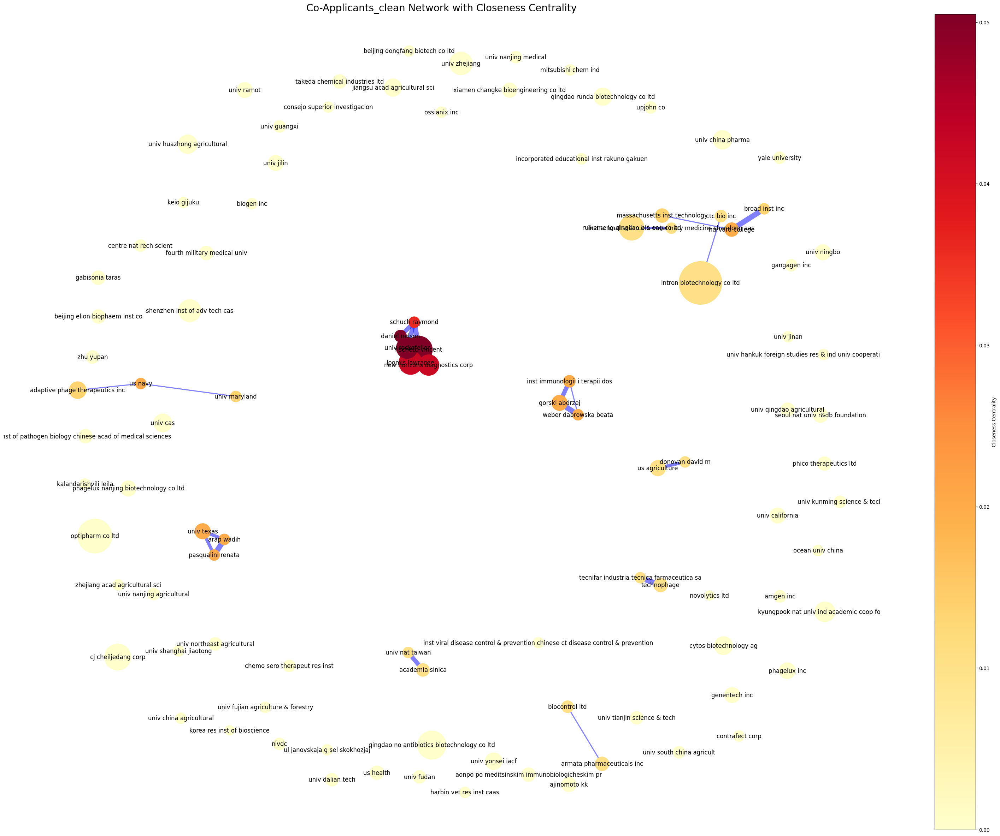

<ipython-input-311-ca2bdb2ebbb7>:93: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(cm.ScalarMappable(cmap=cm.YlOrRd, norm=plt.Normalize(vmin=0, vmax=max_centrality)),


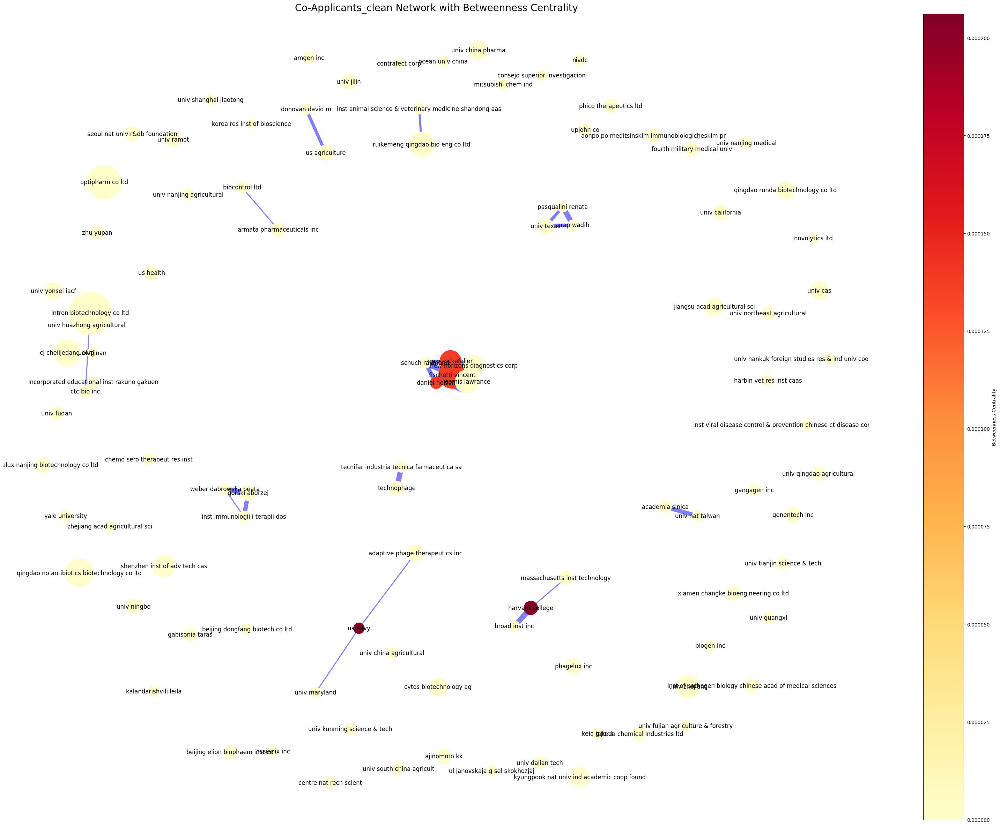

In [ ]:
# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists
draw_centrality_network(data, 'Applicants_clean', top_n=100, centrality_measure='degree')
draw_centrality_network(data, 'Applicants_clean', top_n=100, centrality_measure='closeness')
draw_centrality_network(data, 'Applicants_clean', top_n=100, centrality_measure='betweenness')
#draw_centrality_network(data, 'Applicants', top_n=200, centrality_measure='eigenvector')

<ipython-input-311-ca2bdb2ebbb7>:93: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(cm.ScalarMappable(cmap=cm.YlOrRd, norm=plt.Normalize(vmin=0, vmax=max_centrality)),


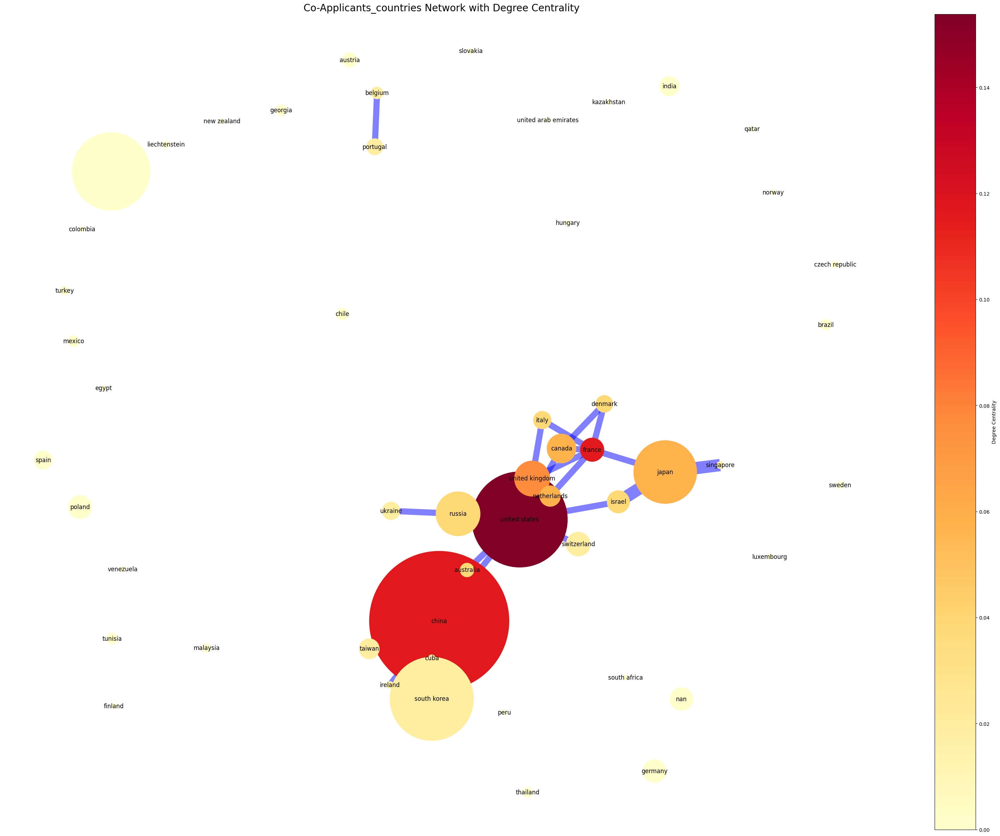

<ipython-input-311-ca2bdb2ebbb7>:93: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(cm.ScalarMappable(cmap=cm.YlOrRd, norm=plt.Normalize(vmin=0, vmax=max_centrality)),


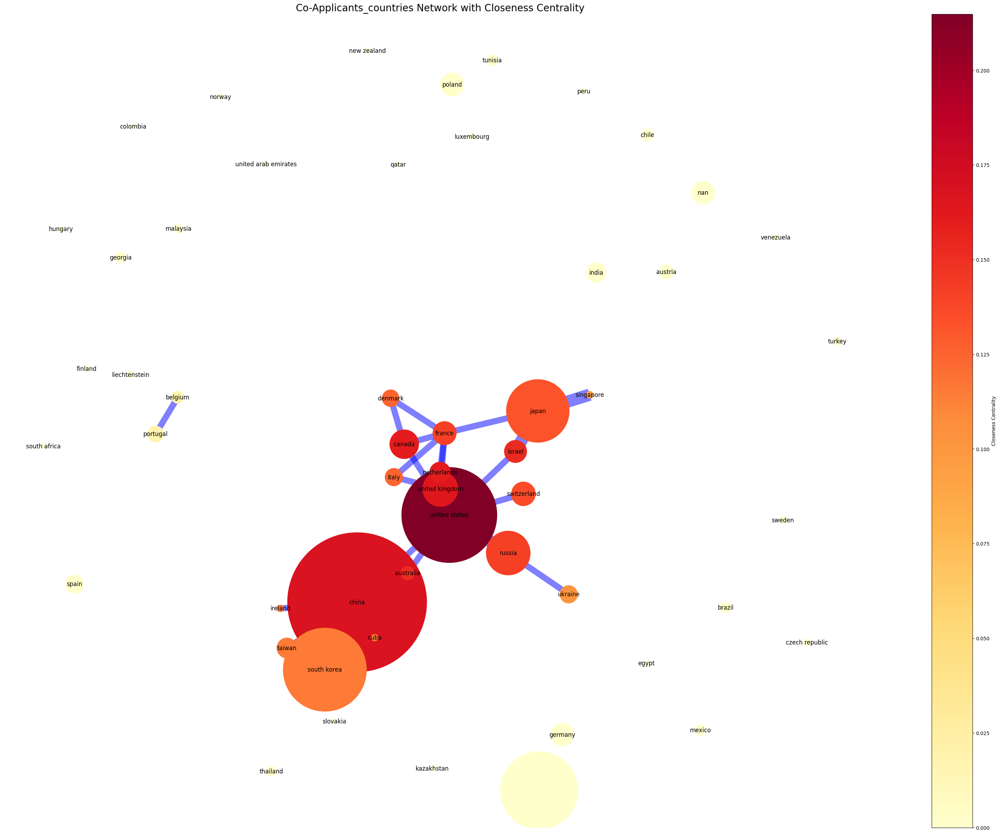

In [ ]:
# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists
draw_centrality_network(data, 'Applicants_countries', top_n=200, centrality_measure='degree')
draw_centrality_network(data, 'Applicants_countries', top_n=200, centrality_measure='closeness')
#draw_centrality_network(data, 'Applicants', top_n=200, centrality_measure='betweenness')
#draw_centrality_network(data, 'Applicants', top_n=200, centrality_measure='eigenvector')

In [ ]:
###

### per top juridictions

In [ ]:
# Filter the DataFrame for rows where the 'Jurisdiction' column is 'CN'
wo_data = data[data['Jurisdiction'] == 'WO']

# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists
draw_centrality_network(wo_data, 'Applicants_clean', top_n=100, centrality_measure='degree')
draw_centrality_network(wo_data, 'Applicants_clean', top_n=100, centrality_measure='closeness')
draw_centrality_network(wo_data, 'Applicants_clean', top_n=100, centrality_measure='betweenness')
draw_centrality_network(wo_data, 'Applicants_clean', top_n=100, centrality_measure='eigenvector')

In [ ]:
# Filter the DataFrame for rows where the 'Jurisdiction' column is 'US'
us_data = data[data['Jurisdiction'] == 'US']

# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists
draw_centrality_network(us_data, 'Applicants_clean', top_n=100, centrality_measure='degree')
draw_centrality_network(us_data, 'Applicants_clean', top_n=100, centrality_measure='closeness')
draw_centrality_network(us_data, 'Applicants_clean', top_n=100, centrality_measure='betweenness')
draw_centrality_network(us_data, 'Applicants_clean', top_n=100, centrality_measure='eigenvector')

In [ ]:
# Filter the DataFrame for rows where the 'Jurisdiction' column is 'CN'
cn_data = data[data['Jurisdiction'] == 'CN']

# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists
draw_centrality_network(cn_data, 'Applicants_clean', top_n=100, centrality_measure='degree')
draw_centrality_network(cn_data, 'Applicants_clean', top_n=100, centrality_measure='closeness')
draw_centrality_network(cn_data, 'Applicants_clean', top_n=100, centrality_measure='betweenness')
draw_centrality_network(cn_data, 'Applicants_clean', top_n=100, centrality_measure='eigenvector')

In [ ]:
# Filter the DataFrame for rows where the 'Jurisdiction' column is 'CN'
ru_data = data[data['Jurisdiction'] == 'RU']

# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists
draw_centrality_network(ru_data, 'Applicants_clean', top_n=100, centrality_measure='degree')
draw_centrality_network(ru_data, 'Applicants_clean', top_n=100, centrality_measure='closeness')
draw_centrality_network(ru_data, 'Applicants_clean', top_n=100, centrality_measure='betweenness')
draw_centrality_network(ru_data, 'Applicants_clean', top_n=100, centrality_measure='eigenvector')

<ipython-input-311-ca2bdb2ebbb7>:93: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(cm.ScalarMappable(cmap=cm.YlOrRd, norm=plt.Normalize(vmin=0, vmax=max_centrality)),


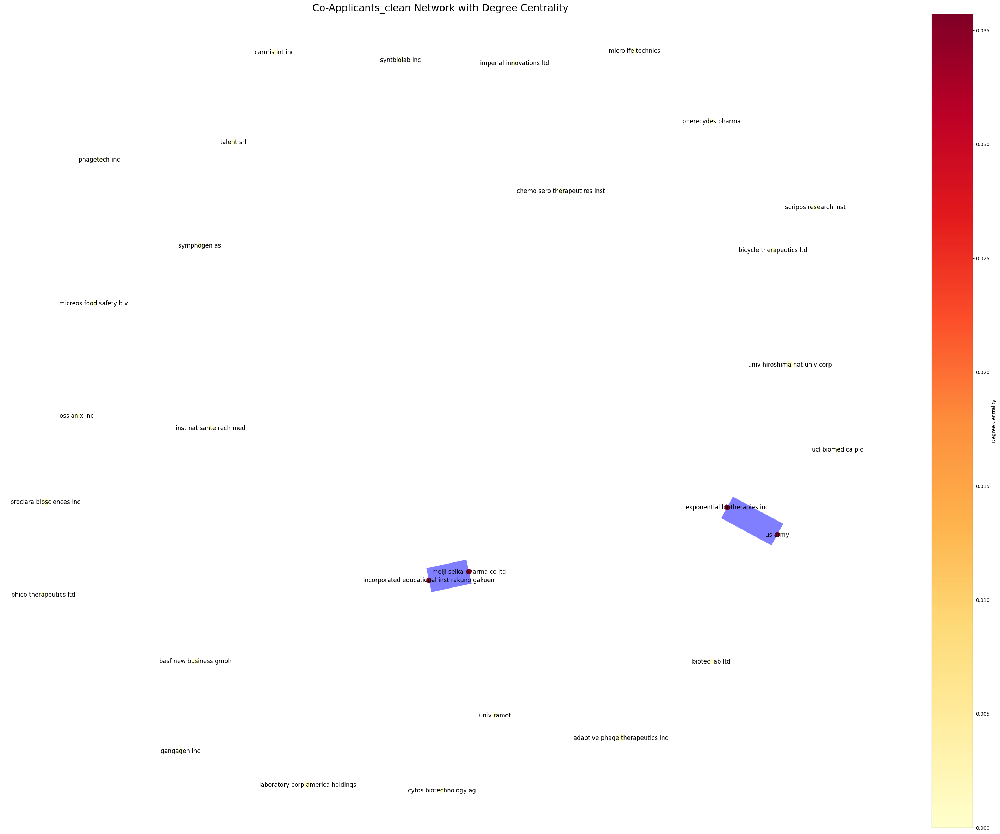

<ipython-input-311-ca2bdb2ebbb7>:93: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(cm.ScalarMappable(cmap=cm.YlOrRd, norm=plt.Normalize(vmin=0, vmax=max_centrality)),


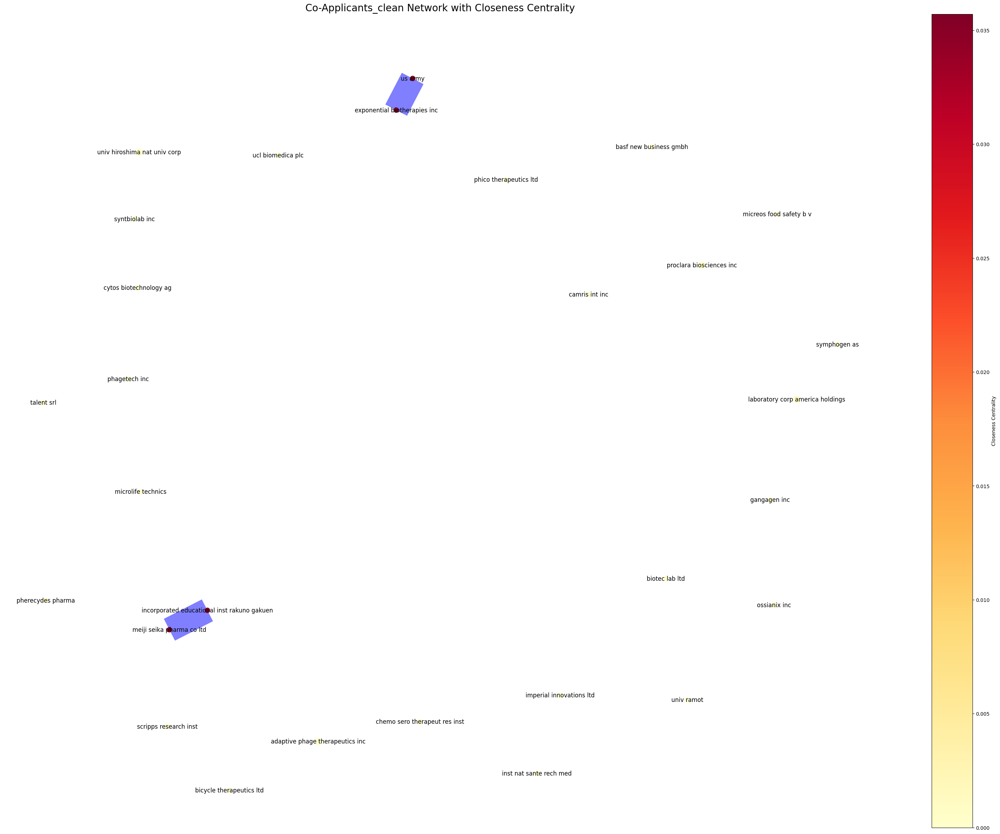

<ipython-input-311-ca2bdb2ebbb7>:93: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(cm.ScalarMappable(cmap=cm.YlOrRd, norm=plt.Normalize(vmin=0, vmax=max_centrality)),


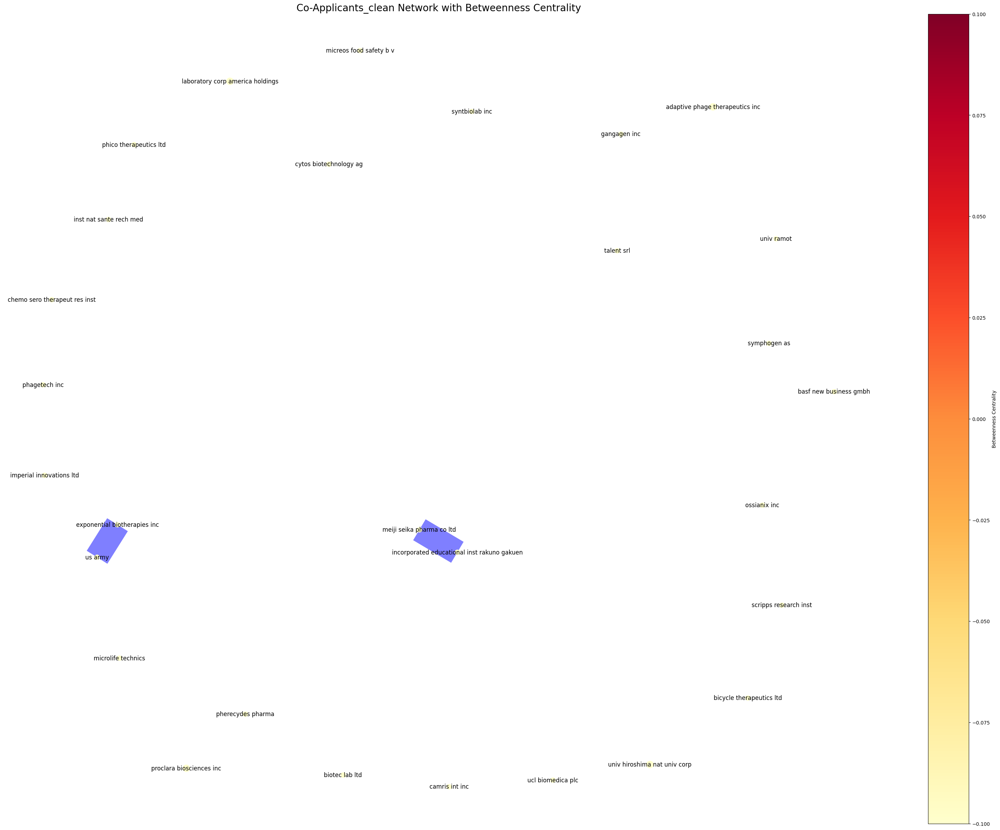

<ipython-input-311-ca2bdb2ebbb7>:93: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(cm.ScalarMappable(cmap=cm.YlOrRd, norm=plt.Normalize(vmin=0, vmax=max_centrality)),


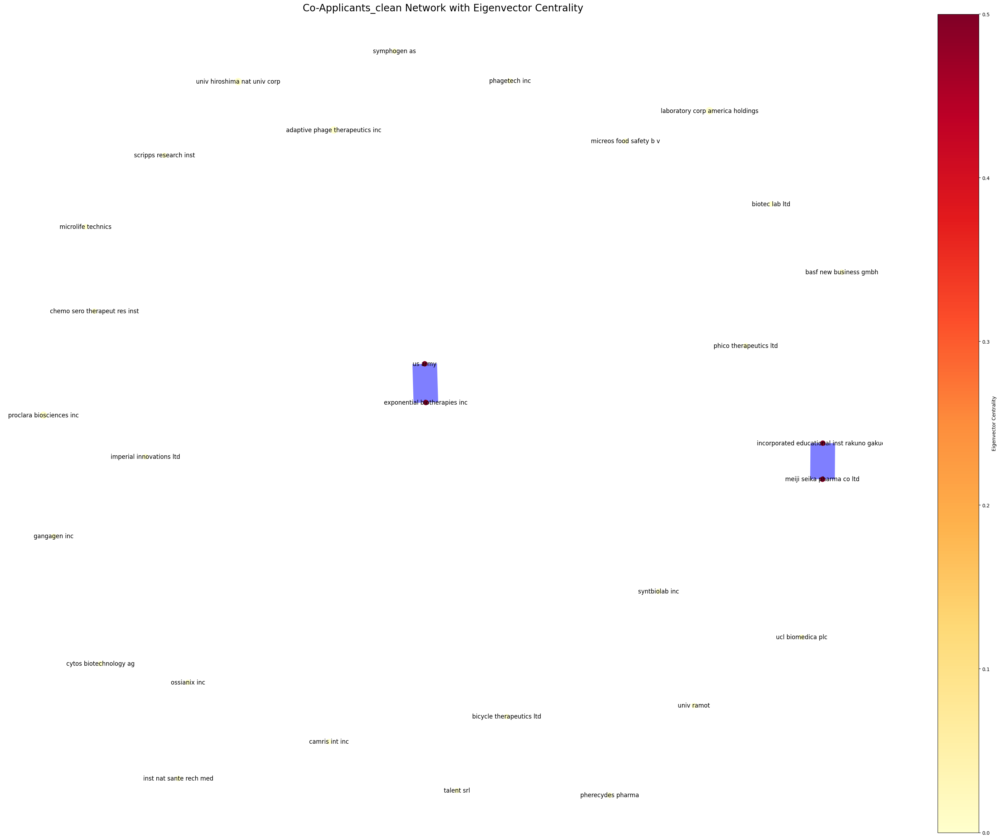

In [ ]:
# Filter the DataFrame for rows where the 'Jurisdiction' column is 'CN'
ca_data = data[data['Jurisdiction'] == 'CA']

# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists
draw_centrality_network(ca_data, 'Applicants_clean', top_n=100, centrality_measure='degree')
draw_centrality_network(ca_data, 'Applicants_clean', top_n=100, centrality_measure='closeness')
draw_centrality_network(ca_data, 'Applicants_clean', top_n=100, centrality_measure='betweenness')
draw_centrality_network(ca_data, 'Applicants_clean', top_n=100, centrality_measure='eigenvector')

In [ ]:
data[data['Application_Year_Range'] == '2020-2024']

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Topic N°,Application Year,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Number of Unique Applicants,Number of Unique Inventors,Number of Unique IPCR Sections,Number of Unique IPCR Class,Number of Unique IPCR Subclass,Number of Unique IPCR Classifications,Inventors_clean,Applicants_clean,applicants_clean_not_individual,Applicants_countries,Applicants_regions,Applicants_categories,Entities
6,7,AU,A1,AU 2020/407755 A1,150-626-037-364-099,2022-05-19,2022,AU 2020/407755 A,2020-12-21,US 201962950850 P;;PT 2020050058 W,2019-12-19,Cocktail compositions comprising respiratory a...,The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,RODRIGUES LEANDRO CLARA ISABEL;;MARTINS BARBOS...,NaN,https://lens.org/150-626-037-364-099,Patent Application,no,0,0,8,8,0,A01N63/40;;A61P31/04;;C12N7/00;;C12N2795/10121...,A01N63/40;;A61K35/76;;A61P31/04,NaN,0,0,NaN,NaN,NaN,PENDING,Topic 3,2020,2019,2020-2024,A,A01;;A61,A01N;;A61K;;A61P,Australia,Oceania,1.0,6.0,1,2,3,3.0,JONES DIAS DANIELA;;VOLKER CORTE-REAL SOFIA;;C...,TechnoPhage,TechnoPhage,Portugal,Europe,Commercial,[]
10,11,US,A1,US 2021/0228659 A1,090-115-923-879-717,2021-07-29,2021,US 202117153911 A,2021-01-21,US 202117153911 A;;EP 14306788 A;;US 201715524...,2014-11-07,PHAGE THERAPY,The present invention relates to bacteriophage...,PHERECYDES PHARMA,POUILLOT FLAVIE;;BLOIS HELENE,PHERECYDES PHARMA (2017-04-06),https://lens.org/090-115-923-879-717,Patent Application,yes,3,1,24,24,7,C12N7/00;;C12N2795/00021;;C12N2795/00032;;C12N...,A61K35/76;;C12N7/00,NaN,1,0,NaN,NaN,GenBank: GU815091.1 (2010) (Year: 2010),ACTIVE,Topic 3,2021,2014,2020-2024,A;;C,A61;;C12,A61K;;C12N,United States,North America,1.0,2.0,2,2,2,2.0,POUILLOT FLAVIE;;BLOIS HELENE,PHERECYDES PHARMA,PHERECYDES PHARMA,France,Europe,Commercial,[]
12,13,CN,A,CN 111269893 A,125-783-025-780-266,2020-06-12,2020,CN 202010160388 A,2020-03-10,CN 202010160388 A,2020-03-10,Bacteriophage composition and application of b...,The invention discloses a bacteriophage compos...,QINGDAO NO ANTIBIOTICS BIOTECHNOLOGY CO LTD,PAN QIANG;;REN HUIYING;;SUN HUZHI;;LIU GUANGQI...,NaN,https://lens.org/125-783-025-780-266,Patent Application,no,4,1,4,4,0,C12N7/00;;A61K35/76;;C12N2795/10121;;C12Q1/70;...,C12N7/00;;A01N63/40;;A01P1/00;;A61K35/76;;A61P...,NaN,2,0,NaN,NaN,"王秀娟: ""蛋鸡沙门氏菌病的防控"", 《当代畜禽养殖业》;;于晓妍等: ""大肠杆菌噬菌体Bp...",ACTIVE,Topic 8,2020,2020,2020-2024,A;;C,A01;;A61;;C12,A01N;;A01P;;A61K;;A61P;;C12N;;C12Q;;C12R,China,Asia,1.0,6.0,2,3,7,8.0,LUO SHIXIAN;;PAN QIANG;;GE CHAO;;REN HUIYING;;...,QINGDAO NO ANTIBIOTICS BIOTECHNOLOGY CO LTD,QINGDAO NO ANTIBIOTICS BIOTECHNOLOGY CO LTD,China,Asia,Commercial,"[pan qiang, ren huiying, liu guangqin, sun huzhi]"
13,14,US,A1,US 2023/0041208 A1,138-164-314-422-077,2023-02-09,2023,US 202217738647 A,2022-05-06,US 202217738647 A;;US 202163185076 P;;US 20216...,2021-05-06,M13 PHAGE BASED GENE THERAPY PLATFORM,An engineered phage-derived particle (PDP) for...,MASSACHUSETTS INST TECHNOLOGY,TSEDEV UYANGA;;BELCHER ANGELA M,NaN,https://lens.org/138-164-314-422-077,Patent Application,yes,0,0,2,2,140,A61K35/76;;C12N15/86;;C12N2795/14143;;C12N2795...,A61K35/76;;A61K47/69;;A61K48/00;;A61K49/00;;A6...,NaN,0,0,NaN,NaN,NaN,PENDING,Topic 4,2022,2021,2020-2024,A;;C,A61;;C07;;C12,A61K;;A61P;;C07K;;C12N;;C12P,United States,North America,1.0,2.0,2,3,5,9.0,TSEDEV UYANGA;;BELCHER ANGELA,MASSACHUSETTS INST TECHNOLOGY,MASSACHUSETTS INST TEC

### per year range

In [ ]:
import pandas as pd

def visualize_networks_by_year_range(data, year_range_column, applicant_column, top_n=200):
    """
    Visualizes networks by sorted year ranges and different centrality measures.

    Args:
    - data (pd.DataFrame): DataFrame containing the data.
    - year_range_column (str): Column name for the year ranges.
    - applicant_column (str): Column name for the applicants.
    - top_n (int): Number of top inventors to consider for the network.

    Returns:
    None
    """
    # Ensure that the data for the specified columns exists
    if year_range_column not in data.columns or applicant_column not in data.columns:
        raise ValueError("Specified columns do not exist in the DataFrame.")

    # Convert NaN to a string and sort
    year_ranges = data[year_range_column].astype(str).unique().tolist()
    sorted_year_ranges = sorted(year_ranges, reverse=True)

    # Loop through each year range and visualize the networks
    for year_range in sorted_year_ranges:
        # Skip the 'nan' entry if present
        if year_range == 'nan':
            continue

        year_range_data = data[data[year_range_column] == year_range]
        print(year_range)
        draw_centrality_network(year_range_data, applicant_column, top_n=top_n, centrality_measure='degree')
        draw_centrality_network(year_range_data, applicant_column, top_n=top_n, centrality_measure='closeness')
        draw_centrality_network(year_range_data, applicant_column, top_n=top_n, centrality_measure='betweenness')
        #draw_centrality_network(year_range_data, applicant_column, top_n=top_n, centrality_measure='eigenvector', max_iter=500, tol=1e-06)

# Example usage:
visualize_networks_by_year_range(data, 'Application_Year_Range', 'Applicants_clean')


In [ ]:
visualize_networks_by_year_range(data, 'Application_Year_Range', 'Inventors_clean')


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2365 entries, 0 to 2364
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   #                                      2365 non-null   int64         
 1   Jurisdiction                           2365 non-null   object        
 2   Kind                                   2365 non-null   object        
 3   Display Key                            2365 non-null   object        
 4   Lens ID                                2365 non-null   object        
 5   Publication Date                       2365 non-null   object        
 6   Publication Year                       2365 non-null   Int64         
 7   Application Number                     2365 non-null   object        
 8   Application Date                       2365 non-null   datetime64[ns]
 9   Priority Numbers                       2363 non-null   object  

In [ ]:
#visualize_networks_by_year_range(data, 'Jurisdiction', 'Applicants')

In [ ]:
visualize_networks_by_year_range(data, 'Applicants_countries', 'Applicants_clean')

In [ ]:
visualize_networks_by_year_range(data, 'Jurisdiction_Region', 'Applicants_clean')

In [ ]:
visualize_networks_by_year_range(data, 'Applicants_countries', 'Inventors_clean')

In [ ]:
visualize_networks_by_year_range(data, 'Jurisdiction_Region', 'Inventors_clean')